In [9]:
%load_ext dotenv
%dotenv

import tqdm
import flax
from flax import linen as nn
import jax
from typing import Dict, Callable, Sequence, Any, Union
from dataclasses import field
import jax.numpy as jnp
import tensorflow_datasets as tfds
import tensorflow as tf
import matplotlib.pyplot as plt
import einops
import clu
from clu import parameter_overview, metrics
from flax.training import train_state  # Useful dataclass to keep train state
import optax
from flax import struct                # Flax dataclasses
import time
import os
from datetime import datetime
import orbax
from flax.training import orbax_utils
import numpy as np
from einops import rearrange


The dotenv extension is already loaded. To reload it, use:
  %reload_ext dotenv


# Initialization

In [2]:
# Some Optimizations
import ctypes

_libcudart = ctypes.CDLL("libcudart.so")
# Set device limit on the current device
# cudaLimitMaxL2FetchGranularity = 0x05
pValue = ctypes.cast((ctypes.c_int * 1)(), ctypes.POINTER(ctypes.c_int))
_libcudart.cudaDeviceSetLimit(ctypes.c_int(0x05), ctypes.c_int(128))
_libcudart.cudaDeviceGetLimit(pValue, ctypes.c_int(0x05))
assert pValue.contents.value == 128
tf.compat.v1.ConfigProto.force_gpu_compatible = True

gpus = tf.config.list_physical_devices("GPU")
if gpus:
    try:
        # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices("GPU")
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
        # Memory growth must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPUs


I0000 00:00:1718209144.592810  330143 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718209144.740911  330143 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718209144.741068  330143 cuda_executor.cc:1020] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1718209144.742658  330143 cuda_executor.cc:1020] successful NUMA node read from SysFS ha

In [3]:
normalizeImage = lambda x: jax.nn.standardize(x, mean=[127.5], std=[127.5])
denormalizeImage = lambda x: (x + 1.0) * 127.5


def plotImages(imgs, fig_size=(8, 8), dpi=100):
    fig = plt.figure(figsize=fig_size, dpi=dpi)
    imglen = imgs.shape[0]
    for i in range(imglen):
        plt.subplot(fig_size[0], fig_size[1], i + 1)
        plt.imshow(tf.cast(denormalizeImage(imgs[i, :, :, :]), tf.uint8))
        plt.axis("off")
    plt.show()

class RandomClass():
    def __init__(self, rng: jax.random.PRNGKey):
        self.rng = rng

    def get_random_key(self):
        self.rng, subkey = jax.random.split(self.rng)
        return subkey
    
    def set_random_key(self, seed):
        self.rng = jax.random.PRNGKey(seed)

    def reset_random_key(self):
        self.rng = jax.random.PRNGKey(42)

class MarkovState(struct.PyTreeNode):
    pass

class RandomMarkovState(MarkovState):
    rng: jax.random.PRNGKey

    def get_random_key(self):
        rng, subkey = jax.random.split(self.rng)
        return RandomMarkovState(rng), subkey

# Data Pipeline

In [4]:
def get_dataset(data_name="celeb_a", batch_size=64, image_scale=256):
    def augmenter(image_scale=256, method="area"):
        @tf.function()
        def augment(sample):
            image = (
                tf.cast(sample["image"], tf.float32) - 127.5
            ) / 127.5
            image = tf.image.resize(
                image, [image_scale, image_scale], method=method, antialias=True
            )
            image = tf.image.random_flip_left_right(image)
            image = tf.image.random_contrast(image, 0.999, 1.05)
            image = tf.image.random_brightness(image, 0.2)

            image = tf.clip_by_value(image, -1.0, 1.0)
            return image
        return augment

    # Load CelebA Dataset
    data: tf.data.Dataset = tfds.load(data_name, split="all", shuffle_files=True)
    final_data = (
        data
        .cache()  # Cache after augmenting to avoid recomputation
        # .prefetch(tf.data.experimental.AUTOTUNE)
        # .batch(128, num_parallel_calls=tf.data.AUTOTUNE)
        .map(
            augmenter(image_scale, method="area"),
            num_parallel_calls=tf.data.AUTOTUNE,
        )
        .repeat()  # Repeats the dataset indefinitely
        # .unbatch()
        .shuffle(4096)  # Ensure this is adequate for your dataset size
        .batch(batch_size, drop_remainder=True)
        .prefetch(tf.data.experimental.AUTOTUNE)
    ).as_numpy_iterator()
    return final_data, len(data)


# Noise Samplers

In [241]:
def cosine_beta_schedule(timesteps, start_angle=0.008, end_angle=0.999):
    ts = np.linspace(0, 1, timesteps + 1, dtype=np.float64)
    alphas_bar = np.cos((ts + start_angle) / (1 + start_angle) * np.pi /2) ** 2
    alphas_bar = alphas_bar/alphas_bar[0]
    betas = 1 - (alphas_bar[1:] / alphas_bar[:-1])
    return np.clip(betas, 0, end_angle)

def linear_beta_schedule(timesteps, beta_start=0.0001, beta_end=0.02):
    scale = 1000 / timesteps
    beta_start = scale * beta_start
    beta_end = scale * beta_end
    betas = np.linspace(
        beta_start, beta_end, timesteps, dtype=np.float64)
    return betas

class NoiseScheduler():
    def __init__(self, timesteps,
                    dtype=jnp.float32,
                    clip_min=-1.0,
                    clip_max=1.0,
                    *args, **kwargs):
        self.max_timesteps = timesteps
        self.dtype = dtype
        self.clip_min = clip_min
        self.clip_max = clip_max

    def generate_timesteps(self, batch_size, state:RandomMarkovState) -> tuple[jnp.ndarray, RandomMarkovState]:
        raise NotImplementedError
    
    def get_p2_weights(self, k, gamma):
        raise NotImplementedError
    
    def clip_images(self, images) -> jnp.ndarray:
        raise NotImplementedError
    
    def reshape_rates(self, rates:tuple[jnp.ndarray, jnp.ndarray]) -> tuple[jnp.ndarray, jnp.ndarray]:
        raise NotImplementedError
    
    def get_rates(self, steps):
        raise NotImplementedError
    
    def add_noise(self, images, noise, steps, rates=None) -> jnp.ndarray:
        raise NotImplementedError
    
    def remove_all_noise(self, noisy_images, noise, steps, clip_denoised=True, rates=None):
        raise NotImplementedError
    
    def transform_steps(self, steps):
        raise NotImplementedError
    
    def get_posterior_mean(self, x_0, x_t, steps):
        raise NotImplementedError
    
    def get_posterior_variance(self, steps):
        raise NotImplementedError
    

class DiscreteNoiseScheduler(NoiseScheduler):
    def __init__(self, timesteps,
                    beta_start=0.0001,
                    beta_end=0.02,
                    schedule_fn=linear_beta_schedule, 
                    *args, **kwargs):
        super().__init__(timesteps, *args, **kwargs)
        betas = schedule_fn(timesteps, beta_start, beta_end)
        alphas = 1 - betas
        alpha_cumprod = jnp.cumprod(alphas, axis=0)
        alpha_cumprod_prev = jnp.append(1.0, alpha_cumprod[:-1])
        
        self.betas = jnp.array(betas, dtype=jnp.float32)
        self.alphas = alphas.astype(jnp.float32)
        self.alpha_cumprod = alpha_cumprod.astype(jnp.float32)
        self.alpha_cumprod_prev = alpha_cumprod_prev.astype(jnp.float32)

        self.sqrt_alpha_cumprod = jnp.sqrt(alpha_cumprod).astype(jnp.float32)
        self.sqrt_one_minus_alpha_cumprod = jnp.sqrt(1 - alpha_cumprod).astype(jnp.float32)

        self.sqrt_recip_alpha_cumprod = jnp.sqrt(1 / alpha_cumprod).astype(jnp.float32)
        self.sqrt_recip_one_minus_alpha_cumprod = jnp.sqrt(1 / alpha_cumprod - 1).astype(jnp.float32)

        posterior_variance = (betas * (1 - alpha_cumprod_prev) / (1 - alpha_cumprod))
        self.posterior_variance = posterior_variance.astype(jnp.float32)
        self.posterior_log_variance_clipped = (jnp.log(jnp.maximum(posterior_variance, 1e-20))).astype(jnp.float32)
        
        self.posterior_mean_coef1 = (betas * jnp.sqrt(alpha_cumprod_prev) / (1 - alpha_cumprod)).astype(jnp.float32)
        self.posterior_mean_coef2 = ((1 - alpha_cumprod_prev) * jnp.sqrt(alphas) / (1 - alpha_cumprod)).astype(jnp.float32)

    def generate_timesteps(self, batch_size, state:RandomMarkovState) -> tuple[jnp.ndarray, RandomMarkovState]:
        state, rng = state.get_random_key()
        timesteps = jax.random.randint(rng, (batch_size,), 0, self.max_timesteps)
        return timesteps, state
    
    def get_p2_weights(self, k, gamma):
        return (k + self.alpha_cumprod / (1 - self.alpha_cumprod)) ** -gamma
    
    def clip_images(self, images) -> jnp.ndarray:
        return jnp.clip(images, self.clip_min, self.clip_max)
    
    def reshape_rates(self, rates:tuple[jnp.ndarray, jnp.ndarray]) -> tuple[jnp.ndarray, jnp.ndarray]:
        signal_rates, noise_rates = rates
        signal_rates = jnp.reshape(signal_rates, (-1, 1, 1, 1))
        noise_rates = jnp.reshape(noise_rates, (-1, 1, 1, 1))
        return signal_rates, noise_rates

    def get_rates(self, steps):
        signal_rate = self.sqrt_alpha_cumprod[steps]
        noise_rate = self.sqrt_one_minus_alpha_cumprod[steps]
        signal_rates = jnp.reshape(signal_rates, (-1, 1, 1, 1))
        noise_rates = jnp.reshape(noise_rates, (-1, 1, 1, 1))
        return signal_rate, noise_rate
    
    # Used while training
    def add_noise(self, images, noise, steps) -> jnp.ndarray:
        signal_rates, noise_rates = self.get_rates(steps)
        return signal_rates * images + noise_rates * noise

    def remove_all_noise(self, noisy_images, noise, steps):
        # Scale 't' to the range [0, 1]
        signal_coeff = self.sqrt_recip_alpha_cumprod[steps]
        noise_coeff = self.sqrt_recip_one_minus_alpha_cumprod[steps]
        signal_coeff, noise_coeff = self.reshape_rates((signal_coeff, noise_coeff))
        pred_images = signal_coeff * noisy_images - noise_coeff * noise
        return pred_images
    
    # Used while training
    def transform_steps(self, steps):
        return steps #/ self.max_timesteps
    
    def get_posterior_mean(self, x_0, x_t, steps):
        x_0_coeff = self.posterior_mean_coef1[steps]
        x_t_coeff = self.posterior_mean_coef2[steps]
        x_0_coeff, x_t_coeff = self.reshape_rates((x_0_coeff, x_t_coeff))
        mean = x_0_coeff * x_0 + x_t_coeff * x_t
        return mean
    
    def get_posterior_variance(self, steps):
        return jnp.exp(0.5 * self.posterior_log_variance_clipped[steps]).reshape(-1, 1, 1, 1)

class CosineNoiseSchedule(DiscreteNoiseScheduler):
    def __init__(self, timesteps, beta_start=0.008, beta_end=0.999, *args, **kwargs):
        super().__init__(timesteps, beta_start, beta_end, schedule_fn=cosine_beta_schedule, *args, **kwargs)

class LinearNoiseSchedule(DiscreteNoiseScheduler):
    def __init__(self, timesteps, beta_start=0.0001, beta_end=0.02, *args, **kwargs):
        super().__init__(timesteps, beta_start, beta_end, schedule_fn=linear_beta_schedule, *args, **kwargs)

############################################################################################################
# Prediction Transforms
############################################################################################################

class DiffusionPredictionTransform():
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        raise NotImplementedError
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        raise NotImplementedError
    
    def train_step(self, x_0, epsilon, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        signal_rate, noise_rate = noise_schedule.get_rates(current_step)
        x_t = signal_rate * x_0 + noise_rate * epsilon
        expected_output = self.get_target(x_0, epsilon, current_step, (signal_rate, noise_rate))
        return x_t, expected_output
    
class EpsilonPredictionTransform(DiffusionPredictionTransform):
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        # preds is the predicted noise
        epsilon = preds
        x_0 = noise_schedule.remove_all_noise(x_t, epsilon, current_step)
        return x_0, epsilon
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        return epsilon
    
class VPredictionTransform(DiffusionPredictionTransform):
    def __call__(self, x_t, preds, current_step, noise_schedule:NoiseScheduler) -> Union[jnp.ndarray, jnp.ndarray]:
        # here the model output's V = sqrt_alpha_t * epsilon - sqrt_one_minus_alpha_t * x_0
        # where epsilon is the noise
        # x_0 is the current sample
        v = preds
        signal_rate, noise_rate = noise_schedule.get_rates(current_step)
        x_0 = signal_rate * x_t - noise_rate * v
        eps_0 = signal_rate * v + noise_rate * x_t
        return x_0, eps_0
    
    def get_target(self, x_0, epsilon, current_step, rates) ->jnp.ndarray:
        signal_rate, noise_rate = rates
        return signal_rate * epsilon - noise_rate * x_0

2.7537346e-05 1.0 (Array(0., dtype=float32), Array(1., dtype=float32)) (Array(0., dtype=float32), Array(1., dtype=float32))


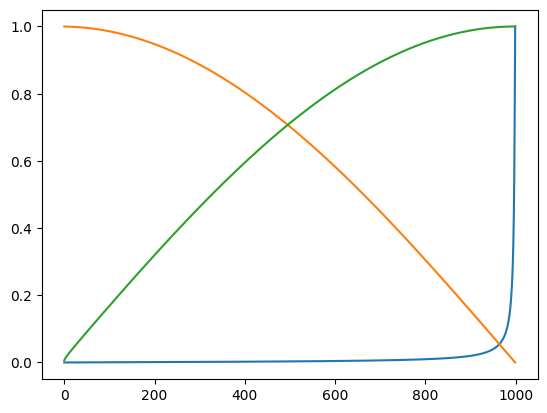

In [6]:
schedule = CosineNoiseSchedule(1000, beta_end=1)
plt.plot(schedule.betas)
# plt.plot(sampler.alphas)
# plt.plot(sampler.alpha_cumprod)
# plt.plot(sampler.alpha_cumprod_prev)
plt.plot([schedule.get_rates(i) for i in range(1000)])
deltas = []
for i in range(1000):
    signal, noise = schedule.get_rates(i)
    deltas.append(jnp.abs(1 - (signal**2 + noise**2)))
print(sum(deltas), schedule.betas[-1], schedule.get_rates(999), schedule.get_rates(1000))

# Data Diffusion Testing

In [ ]:
# Visualize adding some noise to some sample images and then removing it
state = RandomMarkovState(jax.random.PRNGKey(4))
data, _ = get_dataset("oxford_flowers102", batch_size=64, image_scale=64)
images = next(iter(data))
plotImages(images)
noise_level = 400# * jnp.ones((images.shape[0], ), dtype=jnp.int32)
noise_level_max = 1000
schedule = CosineNoiseSchedule(noise_level_max)
state, rng = state.get_random_key()
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float64)
noisy_images = schedule.add_noise(images, noise, noise_level)
plotImages(noisy_images)
plotImages(noise)
reconstructed_images = schedule.remove_all_noise(noisy_images, noise, noise_level)
plotImages(reconstructed_images)


# Modeling

## Metrics

## Callbacks

## Model Generator

In [49]:
# Built using the Flax NNX library

# Kernel initializer to use
def kernel_init(scale):
    scale = max(scale, 1e-10)
    return nn.initializers.variance_scaling(scale=scale, mode="fan_avg", distribution="normal")

class WeightStandardizedConv(nn.Module):
    """
    apply weight standardization  https://arxiv.org/abs/1903.10520
    """
    features: int
    kernel_size: Sequence[int] = 3
    strides: Union[None, int, Sequence[int]] = 1
    padding: Any = 1
    dtype: Any = jnp.float32
    param_dtype: Any = jnp.float32


    @nn.compact
    def __call__(self, x):
        """
        Applies a weight standardized convolution to the inputs.

        Args:
          inputs: input data with dimensions (batch, spatial_dims..., features).

        Returns:
          The convolved data.
        """
        x = x.astype(self.dtype)

        conv = nn.Conv(
            features=self.features,
            kernel_size=self.kernel_size,
            strides = self.strides,
            padding=self.padding,
            dtype=self.dtype,
            param_dtype = self.param_dtype,
            parent=None)

        kernel_init = lambda  rng, x: conv.init(rng,x)['params']['kernel']
        bias_init = lambda  rng, x: conv.init(rng,x)['params']['bias']

        # standardize kernel
        kernel = self.param('kernel', kernel_init, x)
        eps = 1e-5 if self.dtype == jnp.float32 else 1e-3
        # reduce over dim_out
        redux = tuple(range(kernel.ndim - 1))
        mean = jnp.mean(kernel, axis=redux, dtype=self.dtype, keepdims=True)
        var = jnp.var(kernel, axis=redux, dtype=self.dtype, keepdims=True)
        standardized_kernel = (kernel - mean)/jnp.sqrt(var + eps)

        bias = self.param('bias',bias_init, x)

        return(conv.apply({'params': {'kernel': standardized_kernel, 'bias': bias}},x))

class PixelShuffle(nn.Module):
    scale: int

    @nn.compact
    def __call__(self, x):
        up = einops.rearrange(
            x,
            pattern="b h w (h2 w2 c) -> b (h h2) (w w2) c",
            h2=self.scale,
            w2=self.scale,
        )
        return up

class TimeEmbedding(nn.Module):
    features:int
    max_timesteps:int=10000

    def setup(self):
        # self.embeddings = nn.Embed(
        #     num_embeddings=max_timesteps, features=out_features
        # )
        half_dim = self.features // 2
        emb = jnp.log(self.max_timesteps) / (half_dim - 1)
        emb = jnp.exp(-emb * jnp.arange(half_dim, dtype=jnp.float32))
        self.embeddings = emb

    def __call__(self, x):
        x = jax.lax.convert_element_type(x, jnp.float32)
        emb = x[:, None] * self.embeddings[None, :]
        emb = jnp.concatenate([jnp.sin(emb), jnp.cos(emb)], axis=-1)
        return emb

class TimeProjection(nn.Module):
    features:int
    activation:Callable=jax.nn.gelu

    @nn.compact
    def __call__(self, x):
        x = nn.DenseGeneral(self.features, kernel_init=kernel_init(1.0))(x)
        x = self.activation(x)
        x = nn.DenseGeneral(self.features, kernel_init=kernel_init(1.0))(x)
        x = self.activation(x)
        return x

class SeparableConv(nn.Module):
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    use_bias:bool=False
    kernel_init:Callable=kernel_init(1.0)
    padding:str="SAME"

    @nn.compact
    def __call__(self, x):
        in_features = x.shape[-1]
        depthwise = nn.Conv(
            features=in_features, kernel_size=self.kernel_size,
            strides=self.strides, kernel_init=self.kernel_init,
            feature_group_count=in_features, use_bias=self.use_bias,
            padding=self.padding
        )(x)
        pointwise = nn.Conv(
            features=self.features, kernel_size=(1, 1),
            strides=(1, 1), kernel_init=self.kernel_init,
            use_bias=self.use_bias
        )(depthwise)
        return pointwise


class ConvLayer(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    kernel_init:Callable=kernel_init(1.0)

    def setup(self):
        # conv_type can be "conv", "separable", "conv_transpose"
        if self.conv_type == "conv":
            self.conv = nn.Conv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )
        elif self.conv_type == "w_conv":
            self.conv = WeightStandardizedConv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                padding="SAME",
                dtype=jnp.float32,
                param_dtype=jnp.float32
            )
        elif self.conv_type == "separable":
            self.conv = SeparableConv(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )
        elif self.conv_type == "conv_transpose":
            self.conv = nn.ConvTranspose(
                features=self.features,
                kernel_size=self.kernel_size,
                strides=self.strides,
                kernel_init=self.kernel_init,
            )

    def __call__(self, x):
        return self.conv(x)

class Upsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = x
        # out = PixelShuffle(scale=self.scale)(out)
        B, H, W, C = x.shape
        out = jax.image.resize(x, (B, H * self.scale, W * self.scale, C), method="nearest")
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(3, 3),
            strides=(1, 1),
        )(out)
        if residual is not None:
            out = jnp.concatenate([out, residual], axis=-1)
        return out

class Downsample(nn.Module):
    features:int
    scale:int
    activation:Callable=jax.nn.swish

    @nn.compact
    def __call__(self, x, residual=None):
        out = ConvLayer(
            "conv",
            features=self.features,
            kernel_size=(4, 4),
            strides=(2, 2)
        )(x)
        if residual is not None:
            if residual.shape[1] > out.shape[1]:
                residual = nn.avg_pool(residual, window_shape=(2, 2), strides=(2, 2), padding="SAME")
            out = jnp.concatenate([out, residual], axis=-1)
        return out


def l2norm(t, axis=1, eps=1e-12):
    denom = jnp.clip(jnp.linalg.norm(t, ord=2, axis=axis, keepdims=True), eps)
    out = t/denom
    return (out)

class Attention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    scale: int = 10
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(features= dim * 3, kernel_size=(1, 1),
                      use_bias=False, dtype=self.dtype, name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))

        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)

        q, k = map(l2norm, (q, k))

        sim = jnp.einsum('b i h d, b j h d -> b h i j', q, k) * self.scale
        attn = nn.softmax(sim, axis=-1)
        assert attn.shape == (B, self.heads, H * W,  H * W)

        out = jnp.einsum('b h i j , b j h d  -> b h i d', attn, v)
        out = rearrange(out, 'b h (x y) d -> b x y (h d)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1), dtype=self.dtype, name='to_out.conv_0')(out)
        return (out)

class LinearAttention(nn.Module):
    heads: int = 4
    dim_head: int = 32
    dtype: Any = jnp.float32

    @nn.compact
    def __call__(self, x):
        B, H, W, C = x.shape
        dim = self.dim_head * self.heads

        qkv = nn.Conv(
            features=dim * 3,
            kernel_size=(1, 1),
            use_bias=False,
            dtype=self.dtype,
            name='to_qkv.conv_0')(x)  # [B, H, W, dim *3]
        q, k, v = jnp.split(qkv, 3, axis=-1)  # [B, H, W, dim]
        q, k, v = map(lambda t: rearrange(
            t, 'b x y (h d) -> b (x y) h d', h=self.heads), (q, k, v))
        assert q.shape == k.shape == v.shape == (
            B, H * W, self.heads, self.dim_head)
        # compute softmax for q along its embedding dimensions
        q = nn.softmax(q, axis=-1)
        # compute softmax for k along its spatial dimensions
        k = nn.softmax(k, axis=-3)

        q = q/jnp.sqrt(self.dim_head)
        v = v / (H * W)

        context = jnp.einsum('b n h d, b n h e -> b h d e', k, v)
        out = jnp.einsum('b h d e, b n h d -> b h e n', context, q)
        out = rearrange(out, 'b h e (x y) -> b x y (h e)', x=H)
        assert out.shape == (B, H, W, dim)

        out = nn.Conv(features=C, kernel_size=(1, 1),  dtype=self.dtype, name='to_out.conv_0')(out)
        out = nn.LayerNorm(epsilon=1e-5, use_bias=False, dtype=self.dtype, name='to_out.norm_0')(out)
        return (out)

class AttentionBlock(nn.Module):
    heads: int = 4
    dim_head: int = 32
    use_linear_attention: bool = True
    dtype: Any = jnp.float32


    @nn.compact
    def __call__(self, x):
      B, H, W, C = x.shape
      normed_x = nn.LayerNorm(epsilon=1e-5, use_bias=False,dtype=self.dtype)(x)
      if self.use_linear_attention:
        attn = LinearAttention(self.heads, self.dim_head, dtype=self.dtype)
      else:
        attn = Attention(self.heads, self.dim_head, dtype=self.dtype)
      out = attn(normed_x)
      assert out.shape == (B, H, W, C)
      return(out + x)

# class AttentionBlock(nn.Module):
#     attention_config:Dict[str, Any]
#     kernel_init:Callable=kernel_init(1.0)
#     attention_kwargs:Dict[str, Any]=field(default_factory=dict)

#     @nn.compact
#     def __call__(self, x):
#         attention = nn.MultiHeadAttention(**self.attention_config, decode=False)(x)
#         out = x + attention
#         return x

class ResidualBlock(nn.Module):
    conv_type:str
    features:int
    kernel_size:tuple=(3, 3)
    strides:tuple=(1, 1)
    padding:str="SAME"
    activation:Callable=jax.nn.swish
    direction:str=None
    res:int=2
    norm_groups:int=8
    kernel_init:Callable=kernel_init(1.0)

    @nn.compact
    def __call__(self, x:jax.Array, temb:jax.Array, extra_features:jax.Array=None):
        residual = x
        out = nn.GroupNorm(8)(x)
        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv1"
        )(out)
        out = nn.GroupNorm(8)(out)

        temb = nn.DenseGeneral(features=self.features*2, name="temb_projection")(temb)[:, None, None, :]
        scale, shift = jnp.split(temb, 2, axis=-1)
        out = out * (1 + scale) + shift

        out = self.activation(out)

        out = ConvLayer(
            self.conv_type,
            features=self.features,
            kernel_size=self.kernel_size,
            strides=self.strides,
            kernel_init=self.kernel_init,
            name="conv2"
        )(out)

        if residual.shape != out.shape:
            residual = ConvLayer(
                self.conv_type,
                features=self.features,
                kernel_size=(1, 1),
                strides=1,
                kernel_init=self.kernel_init,
                name="residual_conv"
            )(residual)
        out = out + residual

        out = jnp.concatenate([out, extra_features], axis=-1) if extra_features is not None else out

        return out

class Unet(nn.Module):
    emb_features:int=64*4,
    feature_depths:list=[64, 128, 256, 512],
    attention_configs:list=[{"heads":8}, {"heads":8}, {"heads":8}, {"heads":8}],
    num_res_blocks:int=2,
    num_middle_res_blocks:int=1,
    activation:Callable = jax.nn.swish

    @nn.compact
    def __call__(self, x, temb):
        # print("embedding features", self.emb_features)
        temb = TimeEmbedding(features=self.emb_features)(temb)
        temb = TimeProjection(features=self.emb_features)(temb)
        # print("time embedding", temb.shape)
        feature_depths = self.feature_depths
        attention_configs = self.attention_configs
        x = ConvLayer(
            "conv",
            features=self.feature_depths[0],
            kernel_size=(7, 7),
            strides=(1, 1),
            kernel_init=kernel_init(1.0)
        )(x)
        downs = [x]

        # Downscaling blocks
        for i, (dim_out, attention_config) in enumerate(zip(feature_depths, attention_configs)):
            dim_in = x.shape[-1]
            # dim_in = dim_out
            for j in range(self.num_res_blocks):
                x = ResidualBlock(
                    "conv",
                    name=f"down_{i}_residual_{j}",
                    features=dim_in,
                    kernel_init=kernel_init(1.0),
                    kernel_size=(3, 3),
                    strides=(1, 1),
                    activation=self.activation,
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"down_{i}_attention_{j}")(x)
                # print("down residual for feature level", i, "is of shape", x.shape, "features", dim_in)
                downs.append(x)
            if i != len(feature_depths) - 1:
                # print("Downsample", i, x.shape)
                x = Downsample(
                    features=dim_out,
                    scale=2,
                    activation=self.activation,
                    name=f"down_{i}_downsample"
                )(x)

        # Middle Blocks
        middle_dim_out = self.feature_depths[-1]
        middle_attention = self.attention_configs[-1]
        # x = ConvLayer(
        #     "conv",
        #     features=middle_dim_out,
        #     kernel_size=(3, 3),
        #     strides=(1, 1),
        #     kernel_init=kernel_init(1.0),
        #     name="middle_conv"
        # )(x)
        for j in range(self.num_middle_res_blocks):
            x = ResidualBlock(
                "separable",
                name=f"middle_res1_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
            )(x, temb)
            if middle_attention is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                x = AttentionBlock(heads=attention_config['heads'], use_linear_attention=False, name=f"middle_attention_{j}")(x)
            x = ResidualBlock(
                "separable",
                name=f"middle_res2_{j}",
                features=middle_dim_out,
                kernel_init=kernel_init(1.0),
                kernel_size=(3, 3),
                strides=(1, 1),
                activation=self.activation,
            )(x, temb)

        # Upscaling Blocks
        for i, (dim_out, attention_config) in enumerate(zip(reversed(feature_depths), reversed(attention_configs))):
            # print("Upscaling", i, "features", dim_out)
            for j in range(self.num_res_blocks):
                x = jnp.concatenate([x, downs.pop()], axis=-1)
                # print("concat==> ", i, "concat", x.shape)
                x = ResidualBlock(
                    "conv",
                    name=f"up_{i}_residual_{j}",
                    features=dim_out,
                    kernel_init=kernel_init(1.0),
                    kernel_size=(3, 3),
                    strides=(1, 1),
                    activation=self.activation,
                )(x, temb)
                if attention_config is not None and j == self.num_res_blocks - 1:   # Apply attention only on the last block
                    x = AttentionBlock(heads=attention_config['heads'], name=f"up_{i}_attention_{j}")(x)
            # print("Upscaling ", i, x.shape)
            if i != len(feature_depths) - 1:
                x = Upsample(
                    features=feature_depths[-i],
                    scale=2,
                    activation=self.activation,
                    name=f"up_{i}_upsample"
                )(x)

        x = nn.GroupNorm(8)(x)
        x = self.activation(x)

        noise_out = ConvLayer(
            "conv",
            features=3,
            kernel_size=(3, 3),
            strides=(1, 1),
            # activation=jax.nn.mish
            kernel_init=kernel_init(0.0)
        )(x)
        return noise_out#, attentions

In [ ]:
model = Unet(emb_features=256,
    feature_depths=[64, 128, 192, 256],
    attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
    num_res_blocks=2,
    num_middle_res_blocks=1)
inp = jnp.ones((1, 64, 64, 3))
temb = jnp.ones((1,))
print(model.tabulate(jax.random.key(0), inp, temb, console_kwargs={"width": 200, "force_jupyter":True, }))


# Training

In [240]:
BATCH_SIZE = 16
IMAGE_SIZE = 64

cosine_schedule = CosineNoiseSchedule(1000, beta_end=1)
linear_schedule = LinearNoiseSchedule(1000)

In [242]:
import orbax.checkpoint


@struct.dataclass
class Metrics(metrics.Collection):
  loss: metrics.Average.from_output('loss') # type: ignore

class TrainState(train_state.TrainState):
    rngs:jax.random.PRNGKey
    
    def get_random_key(self):
        rngs, subkey = jax.random.split(self.rngs)
        return self.replace(rngs=rngs), subkey

class DiffusionTrainer:
    state : TrainState
    best_state : TrainState
    best_loss : float
    model : nn.Module
    noise_schedule : NoiseScheduler
    model_output_transform:DiffusionPredictionTransform
    
    def __init__(self, 
                 model:nn.Module, 
                 optimizer: optax.GradientTransformation,
                 noise_schedule:NoiseScheduler,
                 rngs:jax.random.PRNGKey,
                 train_state:TrainState=None,
                 name:str="Diffusion",
                 load_from_checkpoint:bool=False,
                 p2_loss_weight_k:float=1,
                 p2_loss_weight_gamma:float=1,
                 param_transforms:Callable=None,
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform()
                 ):
        self.model = model
        self.noise_schedule = noise_schedule
        self.name = name
        self.p2_loss_weights = self.noise_schedule.get_p2_weights(p2_loss_weight_k, p2_loss_weight_gamma)
        self.model_output_transform = model_output_transform

        checkpointer = orbax.checkpoint.PyTreeCheckpointer()
        options = orbax.checkpoint.CheckpointManagerOptions(max_to_keep=4, create=True)
        self.checkpointer = orbax.checkpoint.CheckpointManager(self.checkpoint_path(), checkpointer, options)

        if load_from_checkpoint:
            params = self.load()
        else:
            params = None

        if train_state == None:
            self.init_state(optimizer, rngs, params=params, model=model, param_transforms=param_transforms)
        else:
            train_state.params = params
            self.state = train_state
            self.best_state = train_state

    def init_state(self, 
                   optimizer: optax.GradientTransformation, 
                   rngs:jax.random.PRNGKey,
                   params:dict=None,
                   model:nn.Module=None,
                     param_transforms:Callable=None,
                   ):
        inp = jnp.ones((BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((BATCH_SIZE,))
        rngs, subkey = jax.random.split(rngs)
        if params == None:
            params = model.init(subkey, inp, temb)
        if param_transforms is not None:
            params = param_transforms(params)
        self.best_loss = 1e9
        self.state = TrainState.create(
            apply_fn=model.apply,
            params=params,
            tx=optimizer,
            rngs=rngs,
        )
        self.best_state = self.state

    def checkpoint_path(self):
        experiment_name = self.name
        path = os.path.join(os.path.abspath('./models'), experiment_name)
        if not os.path.exists(path):
            os.makedirs(path)
        return path

    def load(self):
        step = self.checkpointer.latest_step()
        print("Loading model from checkpoint", step)
        ckpt = self.checkpointer.restore(step)
        state = ckpt['state']
        # Convert the state to a TrainState
        self.best_loss = ckpt['best_loss']
        print(f"Loaded model from checkpoint at step {step}", ckpt['best_loss'])
        return state.get('params', None)#, ckpt.get('model', None)

    def save(self, epoch=0, best=False):
        print(f"Saving model at epoch {epoch}")
        state = self.best_state if best else self.state
        # filename = os.path.join(self.checkpoint_path(), f'model_{epoch}' if not best else 'best_model')
        ckpt = {
            'model': self.model,
            'state': state,
            'best_loss': self.best_loss
        }
        save_args = orbax_utils.save_args_from_target(ckpt)
        self.checkpointer.save(epoch, ckpt, save_kwargs={'save_args': save_args})

    def summary(self):
        inp = jnp.ones((1, IMAGE_SIZE, IMAGE_SIZE, 3))
        temb = jnp.ones((1,))
        print(self.model.tabulate(jax.random.key(0), inp, temb, console_kwargs={"width": 200, "force_jupyter":True, }))

    def _define_train_step(self):
        noise_schedule = self.noise_schedule
        model = self.model
        p2_loss_weights = self.p2_loss_weights
        model_output_transform = self.model_output_transform
        @jax.jit
        def train_step(state:TrainState, batch):
            """Train for a single step."""
            images = batch
            noise_level, state = noise_schedule.generate_timesteps(images.shape[0], state)
            state, rngs = state.get_random_key()
            noise:jax.Array = jax.random.normal(rngs, shape=images.shape)
            noisy_images, expected_output = model_output_transform.train_step(images, noise, noise_level, noise_schedule)
            def loss_fn(params):
                preds = model.apply(params, noisy_images, noise_schedule.transform_steps(noise_level))
                nloss = jnp.mean(optax.l2_loss(preds.reshape((1, -1)) - expected_output.reshape((1, -1))), axis=1)
                nloss *= p2_loss_weights[noise_level]
                nloss = jnp.mean(nloss)
                loss = nloss
                return loss
            loss, grads = jax.value_and_grad(loss_fn)(state.params)
            state = state.apply_gradients(grads=grads) 
            return state, loss
        return train_step
    
    def _define_compute_metrics(self):
        @jax.jit
        def compute_metrics(state:TrainState, expected, pred):
            loss = jnp.mean(jnp.square(pred - expected))
            metric_updates = state.metrics.single_from_model_output(loss=loss)
            metrics = state.metrics.merge(metric_updates)
            state = state.replace(metrics=metrics)
            return state
        return compute_metrics

    def fit(self, data, steps_per_epoch, epochs):
        data = iter(data)
        train_step = self._define_train_step()
        compute_metrics = self._define_compute_metrics()
        state = self.state
        for epoch in range(epochs):
            print(f"\nEpoch {epoch+1}/{epochs}")
            start_time = time.time()
            epoch_loss = 0
            with tqdm.tqdm(total=steps_per_epoch, desc=f'\t\tEpoch {epoch+1}', ncols=100, unit='step') as pbar:
                for i in range(steps_per_epoch):
                    batch = next(data)
                    state, loss = train_step(state, batch)
                    epoch_loss += loss
                    if i % 100 == 0:
                        pbar.set_postfix(loss=f'{loss:.4f}')
                        pbar.update(100)
            end_time = time.time()
            self.state = state
            total_time = end_time - start_time
            avg_time_per_step = total_time / steps_per_epoch
            avg_loss = epoch_loss / steps_per_epoch
            if avg_loss < self.best_loss:
                self.best_loss = avg_loss
                self.best_state = state
                self.save(epoch, best=True)
            print(f"\n\tEpoch {epoch+1} completed. Avg Loss: {avg_loss}, Time: {total_time:.2f}s, Avg time per step: {avg_time_per_step:.5f}s")
        return self.state


In [53]:
# # experiment_name = "{name}_{date}".format(
# #     name="Diffusion", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
# # )
# experiment_name = 'Diffusion_2024-06-11_23:41:18'
# print("Experiment_Name:", experiment_name)
# unet = Unet(emb_features=256, 
#             feature_depths=[64, 96, 128, 192, 256], 
#             attention_configs=[{"num_heads":4, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}, {"num_heads":8, "precision":"high"}],
#             # attention_configs=[None]*4, 
#             num_res_blocks=2,
#             num_middle_res_blocks=2,
#             )

# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
# trainer = DiffusionTrainer(unet, optimizer=solver, 
#                            noise_schedule=cosine_schedule,
#                            rngs=jax.random.PRNGKey(4), 
#                            name=experiment_name,
#                             param_transforms=params_transform,
#                            load_from_checkpoint=True,
#                            )
# #trainer.summary()
# data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)

In [54]:
experiment_name = "{name}_{date}".format(
    name="Diffusion", date=datetime.now().strftime("%Y-%m-%d_%H:%M:%S")
)
print("Experiment_Name:", experiment_name)
unet = Unet(emb_features=256, 
            feature_depths=[64, 128, 192, 256],
            attention_configs=[{"heads":4}, {"heads":4}, {"heads":4}, {"heads":4}],
            num_res_blocks=2,
            num_middle_res_blocks=1
)
# solver = optax.lookahead(optax.adam(2e-4), sync_period=6, slow_step_size=0.5)
# params_transform = lambda x: optax.LookaheadParams.init_synced(x)
solver = optax.adam(2e-4)
trainer = DiffusionTrainer(unet, optimizer=solver, 
                           noise_schedule=cosine_schedule,
                           rngs=jax.random.PRNGKey(4), 
                           name=experiment_name,
                            # param_transforms=params_transform,
                        #    load_from_checkpoint=True,
                           )
#trainer.summary()

Experiment_Name: Diffusion_2024-06-13_00:28:17


In [ ]:
trainer.summary()

In [56]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=1000)


Epoch 1/1000


		Epoch 1: 600step [00:35, 16.91step/s, loss=0.0296]                                                


Saving model at epoch 0

	Epoch 1 completed. Avg Loss: 0.047502052038908005, Time: 35.49s, Avg time per step: 0.06946s

Epoch 2/1000


		Epoch 2: 600step [00:16, 35.96step/s, loss=0.0149]                                                


Saving model at epoch 1

	Epoch 2 completed. Avg Loss: 0.02305321767926216, Time: 16.69s, Avg time per step: 0.03266s

Epoch 3/1000


		Epoch 3: 600step [00:17, 34.86step/s, loss=0.0192]                                                


Saving model at epoch 2

	Epoch 3 completed. Avg Loss: 0.02079562470316887, Time: 17.21s, Avg time per step: 0.03369s

Epoch 4/1000


		Epoch 4: 600step [00:17, 34.67step/s, loss=0.0105]                                                


Saving model at epoch 3

	Epoch 4 completed. Avg Loss: 0.019418155774474144, Time: 17.31s, Avg time per step: 0.03387s

Epoch 5/1000


		Epoch 5: 600step [00:17, 35.08step/s, loss=0.0109]                                                



	Epoch 5 completed. Avg Loss: 0.019429905340075493, Time: 17.10s, Avg time per step: 0.03347s

Epoch 6/1000


		Epoch 6: 600step [00:16, 36.13step/s, loss=0.0124]                                                


Saving model at epoch 5

	Epoch 6 completed. Avg Loss: 0.018352899700403214, Time: 16.61s, Avg time per step: 0.03250s

Epoch 7/1000


		Epoch 7: 600step [00:15, 37.89step/s, loss=0.0115]                                                


Saving model at epoch 6

	Epoch 7 completed. Avg Loss: 0.018008235841989517, Time: 15.84s, Avg time per step: 0.03099s

Epoch 8/1000


		Epoch 8: 600step [00:15, 37.80step/s, loss=0.0320]                                                


Saving model at epoch 7

	Epoch 8 completed. Avg Loss: 0.017387399449944496, Time: 15.88s, Avg time per step: 0.03107s

Epoch 9/1000


		Epoch 9: 600step [00:15, 38.02step/s, loss=0.0207]                                                



	Epoch 9 completed. Avg Loss: 0.01753835938870907, Time: 15.78s, Avg time per step: 0.03089s

Epoch 10/1000


		Epoch 10: 600step [00:15, 38.28step/s, loss=0.0184]                                               


Saving model at epoch 9

	Epoch 10 completed. Avg Loss: 0.017361048609018326, Time: 15.67s, Avg time per step: 0.03067s

Epoch 11/1000


		Epoch 11: 600step [00:15, 38.52step/s, loss=0.0144]                                               


Saving model at epoch 10

	Epoch 11 completed. Avg Loss: 0.01680462248623371, Time: 15.58s, Avg time per step: 0.03049s

Epoch 12/1000


		Epoch 12: 600step [00:15, 38.50step/s, loss=0.0160]                                               


Saving model at epoch 11

	Epoch 12 completed. Avg Loss: 0.016682637855410576, Time: 15.58s, Avg time per step: 0.03050s

Epoch 13/1000


		Epoch 13: 600step [00:15, 38.31step/s, loss=0.0116]                                               



	Epoch 13 completed. Avg Loss: 0.01701948419213295, Time: 15.66s, Avg time per step: 0.03065s

Epoch 14/1000


		Epoch 14: 600step [00:15, 38.17step/s, loss=0.0180]                                               



	Epoch 14 completed. Avg Loss: 0.016988476738333702, Time: 15.72s, Avg time per step: 0.03076s

Epoch 15/1000


		Epoch 15: 600step [00:15, 38.40step/s, loss=0.0215]                                               



	Epoch 15 completed. Avg Loss: 0.016853783279657364, Time: 15.63s, Avg time per step: 0.03058s

Epoch 16/1000


		Epoch 16: 600step [00:15, 38.55step/s, loss=0.0176]                                               



	Epoch 16 completed. Avg Loss: 0.016731293871998787, Time: 15.57s, Avg time per step: 0.03046s

Epoch 17/1000


		Epoch 17: 600step [00:15, 38.54step/s, loss=0.0102]                                               


Saving model at epoch 16

	Epoch 17 completed. Avg Loss: 0.016528556123375893, Time: 15.57s, Avg time per step: 0.03047s

Epoch 18/1000


		Epoch 18: 600step [00:15, 37.89step/s, loss=0.0198]                                               



	Epoch 18 completed. Avg Loss: 0.016546962782740593, Time: 15.84s, Avg time per step: 0.03099s

Epoch 19/1000


		Epoch 19: 600step [00:15, 38.57step/s, loss=0.0213]                                               



	Epoch 19 completed. Avg Loss: 0.016743017360568047, Time: 15.56s, Avg time per step: 0.03045s

Epoch 20/1000


		Epoch 20: 600step [00:15, 38.55step/s, loss=0.0088]                                               


Saving model at epoch 19

	Epoch 20 completed. Avg Loss: 0.015642831102013588, Time: 15.57s, Avg time per step: 0.03046s

Epoch 21/1000


		Epoch 21: 600step [00:15, 38.51step/s, loss=0.0116]                                               



	Epoch 21 completed. Avg Loss: 0.016156524419784546, Time: 15.58s, Avg time per step: 0.03049s

Epoch 22/1000


		Epoch 22: 600step [00:15, 38.46step/s, loss=0.0123]                                               



	Epoch 22 completed. Avg Loss: 0.01646271161735058, Time: 15.60s, Avg time per step: 0.03054s

Epoch 23/1000


		Epoch 23: 600step [00:15, 38.95step/s, loss=0.0168]                                               



	Epoch 23 completed. Avg Loss: 0.016506070271134377, Time: 15.41s, Avg time per step: 0.03015s

Epoch 24/1000


		Epoch 24: 600step [00:15, 38.57step/s, loss=0.0148]                                               



	Epoch 24 completed. Avg Loss: 0.016336828470230103, Time: 15.56s, Avg time per step: 0.03045s

Epoch 25/1000


		Epoch 25: 600step [00:15, 38.53step/s, loss=0.0109]                                               



	Epoch 25 completed. Avg Loss: 0.01587805524468422, Time: 15.57s, Avg time per step: 0.03048s

Epoch 26/1000


		Epoch 26: 600step [00:15, 38.56step/s, loss=0.0139]                                               



	Epoch 26 completed. Avg Loss: 0.01602119766175747, Time: 15.56s, Avg time per step: 0.03045s

Epoch 27/1000


		Epoch 27: 600step [00:15, 38.54step/s, loss=0.0146]                                               



	Epoch 27 completed. Avg Loss: 0.015741392970085144, Time: 15.57s, Avg time per step: 0.03047s

Epoch 28/1000


		Epoch 28: 600step [00:15, 38.91step/s, loss=0.0210]                                               



	Epoch 28 completed. Avg Loss: 0.015943557024002075, Time: 15.42s, Avg time per step: 0.03018s

Epoch 29/1000


		Epoch 29: 600step [00:15, 38.46step/s, loss=0.0160]                                               



	Epoch 29 completed. Avg Loss: 0.01577596552670002, Time: 15.60s, Avg time per step: 0.03053s

Epoch 30/1000


		Epoch 30: 600step [00:15, 38.53step/s, loss=0.0151]                                               


Saving model at epoch 29

	Epoch 30 completed. Avg Loss: 0.015349507331848145, Time: 15.58s, Avg time per step: 0.03048s

Epoch 31/1000


		Epoch 31: 600step [00:15, 38.40step/s, loss=0.0155]                                               



	Epoch 31 completed. Avg Loss: 0.015708809718489647, Time: 15.63s, Avg time per step: 0.03058s

Epoch 32/1000


		Epoch 32: 600step [00:15, 38.43step/s, loss=0.0258]                                               



	Epoch 32 completed. Avg Loss: 0.01594739779829979, Time: 15.61s, Avg time per step: 0.03055s

Epoch 33/1000


		Epoch 33: 600step [00:15, 38.40step/s, loss=0.0211]                                               



	Epoch 33 completed. Avg Loss: 0.015947705134749413, Time: 15.63s, Avg time per step: 0.03058s

Epoch 34/1000


		Epoch 34: 600step [00:15, 38.54step/s, loss=0.0098]                                               



	Epoch 34 completed. Avg Loss: 0.015517465770244598, Time: 15.57s, Avg time per step: 0.03047s

Epoch 35/1000


		Epoch 35: 600step [00:15, 38.91step/s, loss=0.0118]                                               



	Epoch 35 completed. Avg Loss: 0.015991972759366035, Time: 15.42s, Avg time per step: 0.03018s

Epoch 36/1000


		Epoch 36: 600step [00:15, 38.33step/s, loss=0.0218]                                               



	Epoch 36 completed. Avg Loss: 0.01619887351989746, Time: 15.65s, Avg time per step: 0.03063s

Epoch 37/1000


		Epoch 37: 600step [00:15, 38.51step/s, loss=0.0127]                                               



	Epoch 37 completed. Avg Loss: 0.01589803583920002, Time: 15.58s, Avg time per step: 0.03050s

Epoch 38/1000


		Epoch 38: 600step [00:15, 38.53step/s, loss=0.0297]                                               



	Epoch 38 completed. Avg Loss: 0.015831908211112022, Time: 15.57s, Avg time per step: 0.03048s

Epoch 39/1000


		Epoch 39: 600step [00:15, 38.54step/s, loss=0.0200]                                               



	Epoch 39 completed. Avg Loss: 0.01568022556602955, Time: 15.57s, Avg time per step: 0.03047s

Epoch 40/1000


		Epoch 40: 600step [00:15, 38.77step/s, loss=0.0176]                                               



	Epoch 40 completed. Avg Loss: 0.01547640934586525, Time: 15.48s, Avg time per step: 0.03029s

Epoch 41/1000


		Epoch 41: 600step [00:15, 38.51step/s, loss=0.0189]                                               



	Epoch 41 completed. Avg Loss: 0.01581748016178608, Time: 15.58s, Avg time per step: 0.03049s

Epoch 42/1000


		Epoch 42: 600step [00:15, 38.51step/s, loss=0.0140]                                               



	Epoch 42 completed. Avg Loss: 0.015886325389146805, Time: 15.58s, Avg time per step: 0.03050s

Epoch 43/1000


		Epoch 43: 600step [00:15, 38.50step/s, loss=0.0104]                                               



	Epoch 43 completed. Avg Loss: 0.015523414127528667, Time: 15.59s, Avg time per step: 0.03050s

Epoch 44/1000


		Epoch 44: 600step [00:15, 38.52step/s, loss=0.0191]                                               



	Epoch 44 completed. Avg Loss: 0.015887318179011345, Time: 15.58s, Avg time per step: 0.03049s

Epoch 45/1000


		Epoch 45: 600step [00:15, 38.45step/s, loss=0.0154]                                               



	Epoch 45 completed. Avg Loss: 0.015512517653405666, Time: 15.61s, Avg time per step: 0.03054s

Epoch 46/1000


		Epoch 46: 600step [00:15, 38.52step/s, loss=0.0126]                                               



	Epoch 46 completed. Avg Loss: 0.015440886840224266, Time: 15.58s, Avg time per step: 0.03048s

Epoch 47/1000


		Epoch 47: 600step [00:15, 38.80step/s, loss=0.0182]                                               



	Epoch 47 completed. Avg Loss: 0.015767185017466545, Time: 15.46s, Avg time per step: 0.03026s

Epoch 48/1000


		Epoch 48: 600step [00:15, 38.51step/s, loss=0.0126]                                               



	Epoch 48 completed. Avg Loss: 0.015639767050743103, Time: 15.58s, Avg time per step: 0.03050s

Epoch 49/1000


		Epoch 49: 600step [00:15, 38.53step/s, loss=0.0212]                                               



	Epoch 49 completed. Avg Loss: 0.01569329760968685, Time: 15.58s, Avg time per step: 0.03048s

Epoch 50/1000


		Epoch 50: 600step [00:15, 37.92step/s, loss=0.0190]                                               



	Epoch 50 completed. Avg Loss: 0.015498989261686802, Time: 15.82s, Avg time per step: 0.03096s

Epoch 51/1000


		Epoch 51: 600step [00:15, 38.39step/s, loss=0.0086]                                               



	Epoch 51 completed. Avg Loss: 0.01543992105871439, Time: 15.63s, Avg time per step: 0.03058s

Epoch 52/1000


		Epoch 52: 600step [00:15, 38.81step/s, loss=0.0171]                                               



	Epoch 52 completed. Avg Loss: 0.015504540875554085, Time: 15.46s, Avg time per step: 0.03026s

Epoch 53/1000


		Epoch 53: 600step [00:15, 38.04step/s, loss=0.0128]                                               



	Epoch 53 completed. Avg Loss: 0.015532317571341991, Time: 15.78s, Avg time per step: 0.03087s

Epoch 54/1000


		Epoch 54: 600step [00:15, 38.44step/s, loss=0.0120]                                               


Saving model at epoch 53

	Epoch 54 completed. Avg Loss: 0.015286070294678211, Time: 15.61s, Avg time per step: 0.03055s

Epoch 55/1000


		Epoch 55: 600step [00:15, 38.55step/s, loss=0.0148]                                               


Saving model at epoch 54

	Epoch 55 completed. Avg Loss: 0.014955359511077404, Time: 15.56s, Avg time per step: 0.03046s

Epoch 56/1000


		Epoch 56: 600step [00:15, 38.37step/s, loss=0.0130]                                               



	Epoch 56 completed. Avg Loss: 0.015484432689845562, Time: 15.64s, Avg time per step: 0.03061s

Epoch 57/1000


		Epoch 57: 600step [00:15, 38.24step/s, loss=0.0158]                                               



	Epoch 57 completed. Avg Loss: 0.015194585546851158, Time: 15.69s, Avg time per step: 0.03071s

Epoch 58/1000


		Epoch 58: 600step [00:15, 38.47step/s, loss=0.0139]                                               



	Epoch 58 completed. Avg Loss: 0.015442433767020702, Time: 15.60s, Avg time per step: 0.03052s

Epoch 59/1000


		Epoch 59: 600step [00:16, 37.27step/s, loss=0.0132]                                               



	Epoch 59 completed. Avg Loss: 0.015584548935294151, Time: 16.10s, Avg time per step: 0.03151s

Epoch 60/1000


		Epoch 60: 600step [00:16, 36.33step/s, loss=0.0154]                                               



	Epoch 60 completed. Avg Loss: 0.01515120454132557, Time: 16.51s, Avg time per step: 0.03232s

Epoch 61/1000


		Epoch 61: 600step [00:15, 37.95step/s, loss=0.0111]                                               



	Epoch 61 completed. Avg Loss: 0.015177398920059204, Time: 15.81s, Avg time per step: 0.03094s

Epoch 62/1000


		Epoch 62: 600step [00:16, 37.19step/s, loss=0.0131]                                               



	Epoch 62 completed. Avg Loss: 0.015367042273283005, Time: 16.13s, Avg time per step: 0.03157s

Epoch 63/1000


		Epoch 63: 600step [00:15, 38.22step/s, loss=0.0094]                                               



	Epoch 63 completed. Avg Loss: 0.01519722305238247, Time: 15.70s, Avg time per step: 0.03072s

Epoch 64/1000


		Epoch 64: 600step [00:15, 38.53step/s, loss=0.0298]                                               



	Epoch 64 completed. Avg Loss: 0.014995601028203964, Time: 15.57s, Avg time per step: 0.03047s

Epoch 65/1000


		Epoch 65: 600step [00:15, 38.33step/s, loss=0.0118]                                               



	Epoch 65 completed. Avg Loss: 0.015433702617883682, Time: 15.65s, Avg time per step: 0.03063s

Epoch 66/1000


		Epoch 66: 600step [00:15, 38.06step/s, loss=0.0217]                                               



	Epoch 66 completed. Avg Loss: 0.015374944545328617, Time: 15.77s, Avg time per step: 0.03085s

Epoch 67/1000


		Epoch 67: 600step [00:15, 38.08step/s, loss=0.0106]                                               



	Epoch 67 completed. Avg Loss: 0.015608291141688824, Time: 15.76s, Avg time per step: 0.03084s

Epoch 68/1000


		Epoch 68: 600step [00:15, 37.74step/s, loss=0.0209]                                               



	Epoch 68 completed. Avg Loss: 0.015214699320495129, Time: 15.90s, Avg time per step: 0.03112s

Epoch 69/1000


		Epoch 69: 600step [00:15, 38.02step/s, loss=0.0219]                                               



	Epoch 69 completed. Avg Loss: 0.015015782788395882, Time: 15.78s, Avg time per step: 0.03088s

Epoch 70/1000


		Epoch 70: 600step [00:15, 38.30step/s, loss=0.0204]                                               



	Epoch 70 completed. Avg Loss: 0.015492986887693405, Time: 15.67s, Avg time per step: 0.03066s

Epoch 71/1000


		Epoch 71: 600step [00:15, 38.38step/s, loss=0.0207]                                               



	Epoch 71 completed. Avg Loss: 0.015070443041622639, Time: 15.63s, Avg time per step: 0.03059s

Epoch 72/1000


		Epoch 72: 600step [00:15, 37.81step/s, loss=0.0128]                                               



	Epoch 72 completed. Avg Loss: 0.015340915881097317, Time: 15.87s, Avg time per step: 0.03106s

Epoch 73/1000


		Epoch 73: 600step [00:15, 38.55step/s, loss=0.0089]                                               



	Epoch 73 completed. Avg Loss: 0.015315378084778786, Time: 15.57s, Avg time per step: 0.03046s

Epoch 74/1000


		Epoch 74: 600step [00:15, 38.32step/s, loss=0.0157]                                               



	Epoch 74 completed. Avg Loss: 0.015218179672956467, Time: 15.66s, Avg time per step: 0.03065s

Epoch 75/1000


		Epoch 75: 600step [00:15, 37.99step/s, loss=0.0095]                                               



	Epoch 75 completed. Avg Loss: 0.014974960125982761, Time: 15.80s, Avg time per step: 0.03091s

Epoch 76/1000


		Epoch 76: 600step [00:15, 37.89step/s, loss=0.0206]                                               


Saving model at epoch 75

	Epoch 76 completed. Avg Loss: 0.014885060489177704, Time: 15.84s, Avg time per step: 0.03100s

Epoch 77/1000


		Epoch 77: 600step [00:15, 38.29step/s, loss=0.0141]                                               



	Epoch 77 completed. Avg Loss: 0.015373490750789642, Time: 15.67s, Avg time per step: 0.03067s

Epoch 78/1000


		Epoch 78: 600step [00:15, 37.92step/s, loss=0.0123]                                               



	Epoch 78 completed. Avg Loss: 0.015117487870156765, Time: 15.83s, Avg time per step: 0.03097s

Epoch 79/1000


		Epoch 79: 600step [00:15, 37.98step/s, loss=0.0088]                                               



	Epoch 79 completed. Avg Loss: 0.01545629184693098, Time: 15.80s, Avg time per step: 0.03092s

Epoch 80/1000


		Epoch 80: 600step [00:16, 36.92step/s, loss=0.0107]                                               



	Epoch 80 completed. Avg Loss: 0.015000465326011181, Time: 16.25s, Avg time per step: 0.03180s

Epoch 81/1000


		Epoch 81: 600step [00:16, 36.77step/s, loss=0.0201]                                               



	Epoch 81 completed. Avg Loss: 0.015465672127902508, Time: 16.32s, Avg time per step: 0.03193s

Epoch 82/1000


		Epoch 82: 600step [00:16, 37.29step/s, loss=0.0155]                                               


Saving model at epoch 81

	Epoch 82 completed. Avg Loss: 0.01480560190975666, Time: 16.09s, Avg time per step: 0.03149s

Epoch 83/1000


		Epoch 83: 600step [00:15, 37.72step/s, loss=0.0159]                                               



	Epoch 83 completed. Avg Loss: 0.015145215205848217, Time: 15.91s, Avg time per step: 0.03113s

Epoch 84/1000


		Epoch 84: 600step [00:15, 38.10step/s, loss=0.0113]                                               



	Epoch 84 completed. Avg Loss: 0.015224451199173927, Time: 15.75s, Avg time per step: 0.03082s

Epoch 85/1000


		Epoch 85: 600step [00:16, 37.14step/s, loss=0.0113]                                               



	Epoch 85 completed. Avg Loss: 0.015583029948174953, Time: 16.16s, Avg time per step: 0.03162s

Epoch 86/1000


		Epoch 86: 600step [00:17, 34.89step/s, loss=0.0156]                                               



	Epoch 86 completed. Avg Loss: 0.014986886642873287, Time: 17.20s, Avg time per step: 0.03365s

Epoch 87/1000


		Epoch 87: 600step [00:17, 34.29step/s, loss=0.0130]                                               



	Epoch 87 completed. Avg Loss: 0.01513025350868702, Time: 17.50s, Avg time per step: 0.03424s

Epoch 88/1000


		Epoch 88: 600step [00:16, 36.22step/s, loss=0.0135]                                               


Saving model at epoch 87

	Epoch 88 completed. Avg Loss: 0.014794989489018917, Time: 16.57s, Avg time per step: 0.03242s

Epoch 89/1000


		Epoch 89: 600step [00:15, 38.47step/s, loss=0.0108]                                               



	Epoch 89 completed. Avg Loss: 0.015005381777882576, Time: 15.60s, Avg time per step: 0.03052s

Epoch 90/1000


		Epoch 90: 600step [00:15, 38.82step/s, loss=0.0147]                                               



	Epoch 90 completed. Avg Loss: 0.015165280550718307, Time: 15.46s, Avg time per step: 0.03025s

Epoch 91/1000


		Epoch 91: 600step [00:15, 38.54step/s, loss=0.0120]                                               



	Epoch 91 completed. Avg Loss: 0.015508203767240047, Time: 15.57s, Avg time per step: 0.03047s

Epoch 92/1000


		Epoch 92: 600step [00:15, 38.33step/s, loss=0.0156]                                               


Saving model at epoch 91

	Epoch 92 completed. Avg Loss: 0.014775581657886505, Time: 15.66s, Avg time per step: 0.03064s

Epoch 93/1000


		Epoch 93: 600step [00:15, 38.41step/s, loss=0.0170]                                               



	Epoch 93 completed. Avg Loss: 0.014918233267962933, Time: 15.62s, Avg time per step: 0.03057s

Epoch 94/1000


		Epoch 94: 600step [00:15, 38.55step/s, loss=0.0138]                                               



	Epoch 94 completed. Avg Loss: 0.015133668668568134, Time: 15.57s, Avg time per step: 0.03046s

Epoch 95/1000


		Epoch 95: 600step [00:15, 38.55step/s, loss=0.0120]                                               



	Epoch 95 completed. Avg Loss: 0.01506063248962164, Time: 15.56s, Avg time per step: 0.03046s

Epoch 96/1000


		Epoch 96: 600step [00:15, 38.42step/s, loss=0.0235]                                               



	Epoch 96 completed. Avg Loss: 0.015130575746297836, Time: 15.62s, Avg time per step: 0.03056s

Epoch 97/1000


		Epoch 97: 600step [00:15, 38.91step/s, loss=0.0181]                                               



	Epoch 97 completed. Avg Loss: 0.01536508183926344, Time: 15.42s, Avg time per step: 0.03018s

Epoch 98/1000


		Epoch 98: 600step [00:15, 38.52step/s, loss=0.0178]                                               



	Epoch 98 completed. Avg Loss: 0.014860592782497406, Time: 15.58s, Avg time per step: 0.03049s

Epoch 99/1000


		Epoch 99: 600step [00:15, 38.57step/s, loss=0.0192]                                               


Saving model at epoch 98

	Epoch 99 completed. Avg Loss: 0.014598067849874496, Time: 15.56s, Avg time per step: 0.03045s

Epoch 100/1000


		Epoch 100: 600step [00:15, 38.57step/s, loss=0.0074]                                              



	Epoch 100 completed. Avg Loss: 0.01518853660672903, Time: 15.56s, Avg time per step: 0.03044s

Epoch 101/1000


		Epoch 101: 600step [00:15, 38.58step/s, loss=0.0178]                                              



	Epoch 101 completed. Avg Loss: 0.015423019416630268, Time: 15.55s, Avg time per step: 0.03044s

Epoch 102/1000


		Epoch 102: 600step [00:15, 38.55step/s, loss=0.0196]                                              



	Epoch 102 completed. Avg Loss: 0.014930438250303268, Time: 15.56s, Avg time per step: 0.03046s

Epoch 103/1000


		Epoch 103: 600step [00:15, 38.55step/s, loss=0.0165]                                              



	Epoch 103 completed. Avg Loss: 0.01531479973345995, Time: 15.57s, Avg time per step: 0.03046s

Epoch 104/1000


		Epoch 104: 600step [00:15, 38.92step/s, loss=0.0108]                                              



	Epoch 104 completed. Avg Loss: 0.015155911445617676, Time: 15.42s, Avg time per step: 0.03017s

Epoch 105/1000


		Epoch 105: 600step [00:15, 38.44step/s, loss=0.0145]                                              



	Epoch 105 completed. Avg Loss: 0.014773380942642689, Time: 15.61s, Avg time per step: 0.03055s

Epoch 106/1000


		Epoch 106: 600step [00:15, 38.46step/s, loss=0.0144]                                              



	Epoch 106 completed. Avg Loss: 0.014739276841282845, Time: 15.60s, Avg time per step: 0.03053s

Epoch 107/1000


		Epoch 107: 600step [00:15, 38.46step/s, loss=0.0145]                                              



	Epoch 107 completed. Avg Loss: 0.015106611885130405, Time: 15.60s, Avg time per step: 0.03053s

Epoch 108/1000


		Epoch 108: 600step [00:15, 38.56step/s, loss=0.0096]                                              



	Epoch 108 completed. Avg Loss: 0.01518804021179676, Time: 15.56s, Avg time per step: 0.03046s

Epoch 109/1000


		Epoch 109: 600step [00:15, 38.93step/s, loss=0.0173]                                              



	Epoch 109 completed. Avg Loss: 0.015351546928286552, Time: 15.41s, Avg time per step: 0.03017s

Epoch 110/1000


		Epoch 110: 600step [00:15, 38.47step/s, loss=0.0107]                                              



	Epoch 110 completed. Avg Loss: 0.01501756813377142, Time: 15.60s, Avg time per step: 0.03053s

Epoch 111/1000


		Epoch 111: 600step [00:15, 38.43step/s, loss=0.0191]                                              


Saving model at epoch 110

	Epoch 111 completed. Avg Loss: 0.014583682641386986, Time: 15.61s, Avg time per step: 0.03056s

Epoch 112/1000


		Epoch 112: 600step [00:15, 38.52step/s, loss=0.0125]                                              



	Epoch 112 completed. Avg Loss: 0.014949856325984001, Time: 15.58s, Avg time per step: 0.03048s

Epoch 113/1000


		Epoch 113: 600step [00:15, 38.53step/s, loss=0.0116]                                              



	Epoch 113 completed. Avg Loss: 0.014828676357865334, Time: 15.58s, Avg time per step: 0.03048s

Epoch 114/1000


		Epoch 114: 600step [00:15, 38.54step/s, loss=0.0187]                                              



	Epoch 114 completed. Avg Loss: 0.015124172903597355, Time: 15.57s, Avg time per step: 0.03047s

Epoch 115/1000


		Epoch 115: 600step [00:15, 38.53step/s, loss=0.0086]                                              



	Epoch 115 completed. Avg Loss: 0.01500689797103405, Time: 15.57s, Avg time per step: 0.03048s

Epoch 116/1000


		Epoch 116: 600step [00:15, 38.92step/s, loss=0.0163]                                              



	Epoch 116 completed. Avg Loss: 0.014882432296872139, Time: 15.42s, Avg time per step: 0.03017s

Epoch 117/1000


		Epoch 117: 600step [00:15, 38.52step/s, loss=0.0089]                                              



	Epoch 117 completed. Avg Loss: 0.014880061149597168, Time: 15.58s, Avg time per step: 0.03049s

Epoch 118/1000


		Epoch 118: 600step [00:15, 38.42step/s, loss=0.0168]                                              



	Epoch 118 completed. Avg Loss: 0.015129166655242443, Time: 15.62s, Avg time per step: 0.03056s

Epoch 119/1000


		Epoch 119: 600step [00:15, 38.29step/s, loss=0.0084]                                              



	Epoch 119 completed. Avg Loss: 0.01496970746666193, Time: 15.67s, Avg time per step: 0.03067s

Epoch 120/1000


		Epoch 120: 600step [00:15, 37.58step/s, loss=0.0128]                                              



	Epoch 120 completed. Avg Loss: 0.014938140287995338, Time: 15.97s, Avg time per step: 0.03124s

Epoch 121/1000


		Epoch 121: 600step [00:16, 35.66step/s, loss=0.0116]                                              



	Epoch 121 completed. Avg Loss: 0.014963764697313309, Time: 16.83s, Avg time per step: 0.03293s

Epoch 122/1000


		Epoch 122: 600step [00:15, 37.55step/s, loss=0.0238]                                              



	Epoch 122 completed. Avg Loss: 0.01506885327398777, Time: 15.98s, Avg time per step: 0.03127s

Epoch 123/1000


		Epoch 123: 600step [00:15, 38.34step/s, loss=0.0251]                                              



	Epoch 123 completed. Avg Loss: 0.014825370162725449, Time: 15.65s, Avg time per step: 0.03063s

Epoch 124/1000


		Epoch 124: 600step [00:15, 37.97step/s, loss=0.0107]                                              



	Epoch 124 completed. Avg Loss: 0.01481766626238823, Time: 15.80s, Avg time per step: 0.03093s

Epoch 125/1000


		Epoch 125: 600step [00:15, 37.82step/s, loss=0.0188]                                              


Saving model at epoch 124

	Epoch 125 completed. Avg Loss: 0.01457405649125576, Time: 15.87s, Avg time per step: 0.03105s

Epoch 126/1000


		Epoch 126: 600step [00:15, 37.85step/s, loss=0.0136]                                              



	Epoch 126 completed. Avg Loss: 0.014888896606862545, Time: 15.85s, Avg time per step: 0.03102s

Epoch 127/1000


		Epoch 127: 600step [00:15, 37.56step/s, loss=0.0183]                                              



	Epoch 127 completed. Avg Loss: 0.015069069340825081, Time: 15.97s, Avg time per step: 0.03126s

Epoch 128/1000


		Epoch 128: 600step [00:15, 38.16step/s, loss=0.0199]                                              



	Epoch 128 completed. Avg Loss: 0.014897311106324196, Time: 15.72s, Avg time per step: 0.03077s

Epoch 129/1000


		Epoch 129: 600step [00:16, 37.46step/s, loss=0.0088]                                              



	Epoch 129 completed. Avg Loss: 0.014801738783717155, Time: 16.02s, Avg time per step: 0.03135s

Epoch 130/1000


		Epoch 130: 600step [00:15, 37.73step/s, loss=0.0092]                                              



	Epoch 130 completed. Avg Loss: 0.0151985427364707, Time: 15.90s, Avg time per step: 0.03112s

Epoch 131/1000


		Epoch 131: 600step [00:16, 35.95step/s, loss=0.0126]                                              


Saving model at epoch 130

	Epoch 131 completed. Avg Loss: 0.014567985199391842, Time: 16.69s, Avg time per step: 0.03267s

Epoch 132/1000


		Epoch 132: 600step [00:16, 36.47step/s, loss=0.0139]                                              



	Epoch 132 completed. Avg Loss: 0.01478433795273304, Time: 16.45s, Avg time per step: 0.03220s

Epoch 133/1000


		Epoch 133: 600step [00:16, 36.36step/s, loss=0.0126]                                              



	Epoch 133 completed. Avg Loss: 0.015023276209831238, Time: 16.50s, Avg time per step: 0.03229s

Epoch 134/1000


		Epoch 134: 600step [00:16, 36.19step/s, loss=0.0236]                                              



	Epoch 134 completed. Avg Loss: 0.014834793284535408, Time: 16.58s, Avg time per step: 0.03245s

Epoch 135/1000


		Epoch 135: 600step [00:17, 34.53step/s, loss=0.0091]                                              



	Epoch 135 completed. Avg Loss: 0.014643766917288303, Time: 17.38s, Avg time per step: 0.03401s

Epoch 136/1000


		Epoch 136: 600step [00:17, 33.67step/s, loss=0.0235]                                              



	Epoch 136 completed. Avg Loss: 0.014784123748540878, Time: 17.82s, Avg time per step: 0.03488s

Epoch 137/1000


		Epoch 137: 600step [00:17, 34.24step/s, loss=0.0243]                                              



	Epoch 137 completed. Avg Loss: 0.015183309093117714, Time: 17.52s, Avg time per step: 0.03430s

Epoch 138/1000


		Epoch 138: 600step [00:16, 36.50step/s, loss=0.0165]                                              



	Epoch 138 completed. Avg Loss: 0.014740562066435814, Time: 16.44s, Avg time per step: 0.03217s

Epoch 139/1000


		Epoch 139: 600step [00:17, 35.04step/s, loss=0.0184]                                              



	Epoch 139 completed. Avg Loss: 0.014662647619843483, Time: 17.13s, Avg time per step: 0.03351s

Epoch 140/1000


		Epoch 140: 600step [00:17, 35.17step/s, loss=0.0172]                                              



	Epoch 140 completed. Avg Loss: 0.014898249879479408, Time: 17.06s, Avg time per step: 0.03339s

Epoch 141/1000


		Epoch 141: 600step [00:17, 34.91step/s, loss=0.0156]                                              



	Epoch 141 completed. Avg Loss: 0.015064533799886703, Time: 17.19s, Avg time per step: 0.03363s

Epoch 142/1000


		Epoch 142: 600step [00:17, 34.18step/s, loss=0.0067]                                              



	Epoch 142 completed. Avg Loss: 0.014983030967414379, Time: 17.56s, Avg time per step: 0.03436s

Epoch 143/1000


		Epoch 143: 600step [00:17, 34.55step/s, loss=0.0113]                                              



	Epoch 143 completed. Avg Loss: 0.015225585550069809, Time: 17.37s, Avg time per step: 0.03399s

Epoch 144/1000


		Epoch 144: 600step [00:17, 34.34step/s, loss=0.0161]                                              



	Epoch 144 completed. Avg Loss: 0.015024444088339806, Time: 17.47s, Avg time per step: 0.03420s

Epoch 145/1000


		Epoch 145: 600step [00:18, 32.01step/s, loss=0.0119]                                              



	Epoch 145 completed. Avg Loss: 0.014623994939029217, Time: 18.74s, Avg time per step: 0.03668s

Epoch 146/1000


		Epoch 146: 600step [00:18, 31.88step/s, loss=0.0153]                                              



	Epoch 146 completed. Avg Loss: 0.014994275756180286, Time: 18.82s, Avg time per step: 0.03683s

Epoch 147/1000


		Epoch 147: 600step [00:18, 32.59step/s, loss=0.0117]                                              



	Epoch 147 completed. Avg Loss: 0.014668574556708336, Time: 18.41s, Avg time per step: 0.03603s

Epoch 148/1000


		Epoch 148: 600step [00:18, 31.72step/s, loss=0.0171]                                              



	Epoch 148 completed. Avg Loss: 0.014626025222241879, Time: 18.92s, Avg time per step: 0.03702s

Epoch 149/1000


		Epoch 149: 600step [00:18, 31.90step/s, loss=0.0132]                                              



	Epoch 149 completed. Avg Loss: 0.014654605649411678, Time: 18.81s, Avg time per step: 0.03681s

Epoch 150/1000


		Epoch 150: 600step [00:18, 31.78step/s, loss=0.0190]                                              



	Epoch 150 completed. Avg Loss: 0.014990830793976784, Time: 18.88s, Avg time per step: 0.03695s

Epoch 151/1000


		Epoch 151: 600step [00:18, 31.97step/s, loss=0.0119]                                              



	Epoch 151 completed. Avg Loss: 0.015002099797129631, Time: 18.77s, Avg time per step: 0.03673s

Epoch 152/1000


		Epoch 152: 600step [00:18, 32.50step/s, loss=0.0147]                                              



	Epoch 152 completed. Avg Loss: 0.015055823139846325, Time: 18.46s, Avg time per step: 0.03613s

Epoch 153/1000


		Epoch 153: 600step [00:18, 32.19step/s, loss=0.0098]                                              



	Epoch 153 completed. Avg Loss: 0.014688214287161827, Time: 18.64s, Avg time per step: 0.03647s

Epoch 154/1000


		Epoch 154: 600step [00:18, 32.42step/s, loss=0.0117]                                              



	Epoch 154 completed. Avg Loss: 0.014640731737017632, Time: 18.51s, Avg time per step: 0.03621s

Epoch 155/1000


		Epoch 155: 600step [00:18, 32.21step/s, loss=0.0167]                                              



	Epoch 155 completed. Avg Loss: 0.014719943515956402, Time: 18.63s, Avg time per step: 0.03646s

Epoch 156/1000


		Epoch 156: 600step [00:18, 32.14step/s, loss=0.0141]                                              



	Epoch 156 completed. Avg Loss: 0.014984259381890297, Time: 18.67s, Avg time per step: 0.03653s

Epoch 157/1000


		Epoch 157: 600step [00:18, 32.82step/s, loss=0.0114]                                              



	Epoch 157 completed. Avg Loss: 0.014871286228299141, Time: 18.28s, Avg time per step: 0.03578s

Epoch 158/1000


		Epoch 158: 600step [00:16, 35.94step/s, loss=0.0106]                                              



	Epoch 158 completed. Avg Loss: 0.014763206243515015, Time: 16.70s, Avg time per step: 0.03268s

Epoch 159/1000


		Epoch 159: 600step [00:16, 36.26step/s, loss=0.0123]                                              



	Epoch 159 completed. Avg Loss: 0.015250860713422298, Time: 16.55s, Avg time per step: 0.03238s

Epoch 160/1000


		Epoch 160: 600step [00:16, 36.71step/s, loss=0.0178]                                              



	Epoch 160 completed. Avg Loss: 0.014592817053198814, Time: 16.34s, Avg time per step: 0.03198s

Epoch 161/1000


		Epoch 161: 600step [00:16, 35.78step/s, loss=0.0146]                                              



	Epoch 161 completed. Avg Loss: 0.014988020993769169, Time: 16.77s, Avg time per step: 0.03282s

Epoch 162/1000


		Epoch 162: 600step [00:17, 33.75step/s, loss=0.0089]                                              



	Epoch 162 completed. Avg Loss: 0.015288271941244602, Time: 17.78s, Avg time per step: 0.03479s

Epoch 163/1000


		Epoch 163: 600step [00:17, 34.02step/s, loss=0.0146]                                              


Saving model at epoch 162

	Epoch 163 completed. Avg Loss: 0.014395535923540592, Time: 17.64s, Avg time per step: 0.03451s

Epoch 164/1000


		Epoch 164: 600step [00:17, 35.09step/s, loss=0.0201]                                              



	Epoch 164 completed. Avg Loss: 0.014985651709139347, Time: 17.10s, Avg time per step: 0.03346s

Epoch 165/1000


		Epoch 165: 600step [00:16, 36.76step/s, loss=0.0124]                                              



	Epoch 165 completed. Avg Loss: 0.014735101722180843, Time: 16.32s, Avg time per step: 0.03194s

Epoch 166/1000


		Epoch 166: 600step [00:16, 37.12step/s, loss=0.0094]                                              



	Epoch 166 completed. Avg Loss: 0.014745173044502735, Time: 16.16s, Avg time per step: 0.03163s

Epoch 167/1000


		Epoch 167: 600step [00:16, 36.17step/s, loss=0.0181]                                              



	Epoch 167 completed. Avg Loss: 0.01496515329927206, Time: 16.59s, Avg time per step: 0.03246s

Epoch 168/1000


		Epoch 168: 600step [00:18, 32.80step/s, loss=0.0191]                                              



	Epoch 168 completed. Avg Loss: 0.014673061668872833, Time: 18.30s, Avg time per step: 0.03580s

Epoch 169/1000


		Epoch 169: 600step [00:18, 32.47step/s, loss=0.0086]                                              



	Epoch 169 completed. Avg Loss: 0.01490534096956253, Time: 18.48s, Avg time per step: 0.03616s

Epoch 170/1000


		Epoch 170: 600step [00:18, 33.07step/s, loss=0.0153]                                              



	Epoch 170 completed. Avg Loss: 0.01509157009422779, Time: 18.15s, Avg time per step: 0.03551s

Epoch 171/1000


		Epoch 171: 600step [00:17, 34.50step/s, loss=0.0188]                                              



	Epoch 171 completed. Avg Loss: 0.014956987462937832, Time: 17.39s, Avg time per step: 0.03404s

Epoch 172/1000


		Epoch 172: 600step [00:17, 34.35step/s, loss=0.0181]                                              



	Epoch 172 completed. Avg Loss: 0.014926433563232422, Time: 17.47s, Avg time per step: 0.03419s

Epoch 173/1000


		Epoch 173: 600step [00:16, 35.30step/s, loss=0.0090]                                              



	Epoch 173 completed. Avg Loss: 0.014723893254995346, Time: 17.00s, Avg time per step: 0.03326s

Epoch 174/1000


		Epoch 174: 600step [00:17, 34.26step/s, loss=0.0143]                                              



	Epoch 174 completed. Avg Loss: 0.015146114863455296, Time: 17.51s, Avg time per step: 0.03427s

Epoch 175/1000


		Epoch 175: 600step [00:17, 34.35step/s, loss=0.0137]                                              



	Epoch 175 completed. Avg Loss: 0.014614722691476345, Time: 17.47s, Avg time per step: 0.03419s

Epoch 176/1000


		Epoch 176: 600step [00:17, 34.37step/s, loss=0.0140]                                              



	Epoch 176 completed. Avg Loss: 0.014829949475824833, Time: 17.46s, Avg time per step: 0.03417s

Epoch 177/1000


		Epoch 177: 600step [00:17, 33.77step/s, loss=0.0160]                                              



	Epoch 177 completed. Avg Loss: 0.014654017984867096, Time: 17.77s, Avg time per step: 0.03478s

Epoch 178/1000


		Epoch 178: 600step [00:17, 34.05step/s, loss=0.0200]                                              



	Epoch 178 completed. Avg Loss: 0.014653101563453674, Time: 17.62s, Avg time per step: 0.03449s

Epoch 179/1000


		Epoch 179: 600step [00:16, 36.74step/s, loss=0.0172]                                              



	Epoch 179 completed. Avg Loss: 0.01444028876721859, Time: 16.33s, Avg time per step: 0.03196s

Epoch 180/1000


		Epoch 180: 600step [00:17, 34.55step/s, loss=0.0101]                                              



	Epoch 180 completed. Avg Loss: 0.014764833264052868, Time: 17.37s, Avg time per step: 0.03399s

Epoch 181/1000


		Epoch 181: 600step [00:16, 35.96step/s, loss=0.0183]                                              



	Epoch 181 completed. Avg Loss: 0.014411665499210358, Time: 16.69s, Avg time per step: 0.03265s

Epoch 182/1000


		Epoch 182: 600step [00:15, 39.08step/s, loss=0.0149]                                              



	Epoch 182 completed. Avg Loss: 0.01476055383682251, Time: 15.36s, Avg time per step: 0.03005s

Epoch 183/1000


		Epoch 183: 600step [00:15, 39.53step/s, loss=0.0172]                                              



	Epoch 183 completed. Avg Loss: 0.014825664460659027, Time: 15.18s, Avg time per step: 0.02971s

Epoch 184/1000


		Epoch 184: 600step [00:15, 39.07step/s, loss=0.0210]                                              



	Epoch 184 completed. Avg Loss: 0.014958900399506092, Time: 15.36s, Avg time per step: 0.03006s

Epoch 185/1000


		Epoch 185: 600step [00:15, 39.09step/s, loss=0.0110]                                              



	Epoch 185 completed. Avg Loss: 0.014636623673141003, Time: 15.35s, Avg time per step: 0.03004s

Epoch 186/1000


		Epoch 186: 600step [00:15, 39.09step/s, loss=0.0121]                                              



	Epoch 186 completed. Avg Loss: 0.014978812076151371, Time: 15.35s, Avg time per step: 0.03004s

Epoch 187/1000


		Epoch 187: 600step [00:15, 39.07step/s, loss=0.0187]                                              



	Epoch 187 completed. Avg Loss: 0.01500101201236248, Time: 15.36s, Avg time per step: 0.03006s

Epoch 188/1000


		Epoch 188: 600step [00:15, 39.46step/s, loss=0.0185]                                              



	Epoch 188 completed. Avg Loss: 0.01453959010541439, Time: 15.21s, Avg time per step: 0.02976s

Epoch 189/1000


		Epoch 189: 600step [00:15, 38.89step/s, loss=0.0225]                                              


Saving model at epoch 188

	Epoch 189 completed. Avg Loss: 0.014161694794893265, Time: 15.43s, Avg time per step: 0.03020s

Epoch 190/1000


		Epoch 190: 600step [00:16, 37.04step/s, loss=0.0307]                                              



	Epoch 190 completed. Avg Loss: 0.014626399613916874, Time: 16.20s, Avg time per step: 0.03170s

Epoch 191/1000


		Epoch 191: 600step [00:17, 34.41step/s, loss=0.0144]                                              



	Epoch 191 completed. Avg Loss: 0.014625421725213528, Time: 17.44s, Avg time per step: 0.03413s

Epoch 192/1000


		Epoch 192: 600step [00:17, 34.62step/s, loss=0.0151]                                              



	Epoch 192 completed. Avg Loss: 0.014823833480477333, Time: 17.33s, Avg time per step: 0.03392s

Epoch 193/1000


		Epoch 193: 600step [00:17, 34.65step/s, loss=0.0170]                                              



	Epoch 193 completed. Avg Loss: 0.014561520889401436, Time: 17.32s, Avg time per step: 0.03389s

Epoch 194/1000


		Epoch 194: 600step [00:17, 34.58step/s, loss=0.0088]                                              



	Epoch 194 completed. Avg Loss: 0.014612478204071522, Time: 17.35s, Avg time per step: 0.03395s

Epoch 195/1000


		Epoch 195: 600step [00:17, 34.80step/s, loss=0.0163]                                              



	Epoch 195 completed. Avg Loss: 0.014741973020136356, Time: 17.24s, Avg time per step: 0.03374s

Epoch 196/1000


		Epoch 196: 600step [00:17, 34.50step/s, loss=0.0155]                                              



	Epoch 196 completed. Avg Loss: 0.014784865081310272, Time: 17.39s, Avg time per step: 0.03404s

Epoch 197/1000


		Epoch 197: 600step [00:17, 34.67step/s, loss=0.0140]                                              



	Epoch 197 completed. Avg Loss: 0.014860625378787518, Time: 17.31s, Avg time per step: 0.03387s

Epoch 198/1000


		Epoch 198: 600step [00:17, 34.48step/s, loss=0.0095]                                              



	Epoch 198 completed. Avg Loss: 0.014902796596288681, Time: 17.40s, Avg time per step: 0.03406s

Epoch 199/1000


		Epoch 199: 600step [00:17, 34.62step/s, loss=0.0179]                                              



	Epoch 199 completed. Avg Loss: 0.014801036566495895, Time: 17.33s, Avg time per step: 0.03392s

Epoch 200/1000


		Epoch 200: 600step [00:17, 34.89step/s, loss=0.0225]                                              



	Epoch 200 completed. Avg Loss: 0.014630541205406189, Time: 17.20s, Avg time per step: 0.03366s

Epoch 201/1000


		Epoch 201: 600step [00:17, 34.30step/s, loss=0.0143]                                              



	Epoch 201 completed. Avg Loss: 0.014303471893072128, Time: 17.49s, Avg time per step: 0.03423s

Epoch 202/1000


		Epoch 202: 600step [00:17, 34.62step/s, loss=0.0100]                                              



	Epoch 202 completed. Avg Loss: 0.014733543619513512, Time: 17.33s, Avg time per step: 0.03392s

Epoch 203/1000


		Epoch 203: 600step [00:17, 34.60step/s, loss=0.0213]                                              



	Epoch 203 completed. Avg Loss: 0.014382552355527878, Time: 17.34s, Avg time per step: 0.03394s

Epoch 204/1000


		Epoch 204: 600step [00:17, 34.71step/s, loss=0.0173]                                              



	Epoch 204 completed. Avg Loss: 0.014709115959703922, Time: 17.29s, Avg time per step: 0.03383s

Epoch 205/1000


		Epoch 205: 600step [00:17, 34.58step/s, loss=0.0100]                                              



	Epoch 205 completed. Avg Loss: 0.015082644298672676, Time: 17.35s, Avg time per step: 0.03396s

Epoch 206/1000


		Epoch 206: 600step [00:17, 34.35step/s, loss=0.0147]                                              



	Epoch 206 completed. Avg Loss: 0.014454706571996212, Time: 17.47s, Avg time per step: 0.03419s

Epoch 207/1000


		Epoch 207: 600step [00:17, 34.68step/s, loss=0.0127]                                              



	Epoch 207 completed. Avg Loss: 0.01466124877333641, Time: 17.30s, Avg time per step: 0.03386s

Epoch 208/1000


		Epoch 208: 600step [00:17, 34.59step/s, loss=0.0109]                                              



	Epoch 208 completed. Avg Loss: 0.014936074614524841, Time: 17.35s, Avg time per step: 0.03394s

Epoch 209/1000


		Epoch 209: 600step [00:17, 34.60step/s, loss=0.0263]                                              



	Epoch 209 completed. Avg Loss: 0.014841865748167038, Time: 17.34s, Avg time per step: 0.03394s

Epoch 210/1000


		Epoch 210: 600step [00:17, 34.54step/s, loss=0.0123]                                              



	Epoch 210 completed. Avg Loss: 0.014650275930762291, Time: 17.37s, Avg time per step: 0.03399s

Epoch 211/1000


		Epoch 211: 600step [00:17, 34.49step/s, loss=0.0112]                                              



	Epoch 211 completed. Avg Loss: 0.015404528938233852, Time: 17.40s, Avg time per step: 0.03405s

Epoch 212/1000


		Epoch 212: 600step [00:17, 34.54step/s, loss=0.0199]                                              



	Epoch 212 completed. Avg Loss: 0.014395000413060188, Time: 17.37s, Avg time per step: 0.03400s

Epoch 213/1000


		Epoch 213: 600step [00:17, 34.34step/s, loss=0.0175]                                              



	Epoch 213 completed. Avg Loss: 0.014651257544755936, Time: 17.47s, Avg time per step: 0.03420s

Epoch 214/1000


		Epoch 214: 600step [00:17, 34.58step/s, loss=0.0090]                                              



	Epoch 214 completed. Avg Loss: 0.01478310115635395, Time: 17.35s, Avg time per step: 0.03396s

Epoch 215/1000


		Epoch 215: 600step [00:17, 34.44step/s, loss=0.0111]                                              



	Epoch 215 completed. Avg Loss: 0.014547993429005146, Time: 17.42s, Avg time per step: 0.03409s

Epoch 216/1000


		Epoch 216: 600step [00:17, 34.59step/s, loss=0.0177]                                              



	Epoch 216 completed. Avg Loss: 0.015005319379270077, Time: 17.35s, Avg time per step: 0.03395s

Epoch 217/1000


		Epoch 217: 600step [00:17, 34.69step/s, loss=0.0098]                                              



	Epoch 217 completed. Avg Loss: 0.01463598757982254, Time: 17.30s, Avg time per step: 0.03385s

Epoch 218/1000


		Epoch 218: 600step [00:17, 34.36step/s, loss=0.0118]                                              



	Epoch 218 completed. Avg Loss: 0.014381556771695614, Time: 17.47s, Avg time per step: 0.03418s

Epoch 219/1000


		Epoch 219: 600step [00:17, 34.80step/s, loss=0.0154]                                              



	Epoch 219 completed. Avg Loss: 0.014509031549096107, Time: 17.24s, Avg time per step: 0.03375s

Epoch 220/1000


		Epoch 220: 600step [00:17, 34.48step/s, loss=0.0245]                                              



	Epoch 220 completed. Avg Loss: 0.014606564305722713, Time: 17.40s, Avg time per step: 0.03405s

Epoch 221/1000


		Epoch 221: 600step [00:17, 34.46step/s, loss=0.0150]                                              



	Epoch 221 completed. Avg Loss: 0.014511827379465103, Time: 17.41s, Avg time per step: 0.03407s

Epoch 222/1000


		Epoch 222: 600step [00:17, 34.50step/s, loss=0.0111]                                              



	Epoch 222 completed. Avg Loss: 0.014867295511066914, Time: 17.39s, Avg time per step: 0.03403s

Epoch 223/1000


		Epoch 223: 600step [00:17, 34.24step/s, loss=0.0085]                                              



	Epoch 223 completed. Avg Loss: 0.01486693974584341, Time: 17.53s, Avg time per step: 0.03430s

Epoch 224/1000


		Epoch 224: 600step [00:17, 34.74step/s, loss=0.0196]                                              



	Epoch 224 completed. Avg Loss: 0.014596253633499146, Time: 17.27s, Avg time per step: 0.03380s

Epoch 225/1000


		Epoch 225: 600step [00:17, 34.67step/s, loss=0.0272]                                              



	Epoch 225 completed. Avg Loss: 0.01440031360834837, Time: 17.30s, Avg time per step: 0.03386s

Epoch 226/1000


		Epoch 226: 600step [00:17, 34.44step/s, loss=0.0150]                                              



	Epoch 226 completed. Avg Loss: 0.014923576265573502, Time: 17.42s, Avg time per step: 0.03409s

Epoch 227/1000


		Epoch 227: 600step [00:17, 34.35step/s, loss=0.0102]                                              



	Epoch 227 completed. Avg Loss: 0.014805816113948822, Time: 17.47s, Avg time per step: 0.03418s

Epoch 228/1000


		Epoch 228: 600step [00:17, 34.31step/s, loss=0.0098]                                              



	Epoch 228 completed. Avg Loss: 0.014955053105950356, Time: 17.49s, Avg time per step: 0.03422s

Epoch 229/1000


		Epoch 229: 600step [00:17, 34.53step/s, loss=0.0123]                                              



	Epoch 229 completed. Avg Loss: 0.01448760461062193, Time: 17.38s, Avg time per step: 0.03401s

Epoch 230/1000


		Epoch 230: 600step [00:17, 34.62step/s, loss=0.0088]                                              



	Epoch 230 completed. Avg Loss: 0.014686484821140766, Time: 17.33s, Avg time per step: 0.03392s

Epoch 231/1000


		Epoch 231: 600step [00:17, 34.50step/s, loss=0.0114]                                              



	Epoch 231 completed. Avg Loss: 0.014488422311842442, Time: 17.39s, Avg time per step: 0.03404s

Epoch 232/1000


		Epoch 232: 600step [00:17, 34.46step/s, loss=0.0189]                                              



	Epoch 232 completed. Avg Loss: 0.014635821804404259, Time: 17.41s, Avg time per step: 0.03408s

Epoch 233/1000


		Epoch 233: 600step [00:17, 34.61step/s, loss=0.0120]                                              



	Epoch 233 completed. Avg Loss: 0.014611235819756985, Time: 17.34s, Avg time per step: 0.03393s

Epoch 234/1000


		Epoch 234: 600step [00:17, 34.52step/s, loss=0.0114]                                              



	Epoch 234 completed. Avg Loss: 0.014262277632951736, Time: 17.38s, Avg time per step: 0.03402s

Epoch 235/1000


		Epoch 235: 600step [00:17, 34.38step/s, loss=0.0162]                                              



	Epoch 235 completed. Avg Loss: 0.014610405080020428, Time: 17.45s, Avg time per step: 0.03416s

Epoch 236/1000


		Epoch 236: 600step [00:17, 34.85step/s, loss=0.0125]                                              



	Epoch 236 completed. Avg Loss: 0.014419933781027794, Time: 17.22s, Avg time per step: 0.03369s

Epoch 237/1000


		Epoch 237: 600step [00:17, 34.44step/s, loss=0.0191]                                              



	Epoch 237 completed. Avg Loss: 0.014734173193573952, Time: 17.43s, Avg time per step: 0.03410s

Epoch 238/1000


		Epoch 238: 600step [00:17, 34.66step/s, loss=0.0175]                                              



	Epoch 238 completed. Avg Loss: 0.014350554905831814, Time: 17.31s, Avg time per step: 0.03388s

Epoch 239/1000


		Epoch 239: 600step [00:17, 34.55step/s, loss=0.0169]                                              



	Epoch 239 completed. Avg Loss: 0.014613930135965347, Time: 17.37s, Avg time per step: 0.03399s

Epoch 240/1000


		Epoch 240: 600step [00:17, 34.52step/s, loss=0.0114]                                              



	Epoch 240 completed. Avg Loss: 0.014503280632197857, Time: 17.38s, Avg time per step: 0.03402s

Epoch 241/1000


		Epoch 241: 600step [00:17, 34.82step/s, loss=0.0131]                                              



	Epoch 241 completed. Avg Loss: 0.014213133603334427, Time: 17.23s, Avg time per step: 0.03373s

Epoch 242/1000


		Epoch 242: 600step [00:17, 34.54step/s, loss=0.0238]                                              



	Epoch 242 completed. Avg Loss: 0.014680472202599049, Time: 17.37s, Avg time per step: 0.03400s

Epoch 243/1000


		Epoch 243: 600step [00:17, 34.42step/s, loss=0.0138]                                              



	Epoch 243 completed. Avg Loss: 0.014781410805881023, Time: 17.44s, Avg time per step: 0.03412s

Epoch 244/1000


		Epoch 244: 600step [00:17, 34.52step/s, loss=0.0116]                                              



	Epoch 244 completed. Avg Loss: 0.014574144966900349, Time: 17.38s, Avg time per step: 0.03402s

Epoch 245/1000


		Epoch 245: 600step [00:17, 34.65step/s, loss=0.0130]                                              



	Epoch 245 completed. Avg Loss: 0.014648397453129292, Time: 17.32s, Avg time per step: 0.03389s

Epoch 246/1000


		Epoch 246: 600step [00:17, 34.37step/s, loss=0.0192]                                              



	Epoch 246 completed. Avg Loss: 0.014654873870313168, Time: 17.46s, Avg time per step: 0.03417s

Epoch 247/1000


		Epoch 247: 600step [00:17, 34.60step/s, loss=0.0176]                                              



	Epoch 247 completed. Avg Loss: 0.014425435103476048, Time: 17.34s, Avg time per step: 0.03393s

Epoch 248/1000


		Epoch 248: 600step [00:17, 34.87step/s, loss=0.0135]                                              



	Epoch 248 completed. Avg Loss: 0.014510365203022957, Time: 17.21s, Avg time per step: 0.03367s

Epoch 249/1000


		Epoch 249: 600step [00:17, 34.57step/s, loss=0.0196]                                              



	Epoch 249 completed. Avg Loss: 0.01466493308544159, Time: 17.36s, Avg time per step: 0.03396s

Epoch 250/1000


		Epoch 250: 600step [00:17, 34.50step/s, loss=0.0099]                                              



	Epoch 250 completed. Avg Loss: 0.014699816703796387, Time: 17.40s, Avg time per step: 0.03404s

Epoch 251/1000


		Epoch 251: 600step [00:16, 36.30step/s, loss=0.0111]                                              


Saving model at epoch 250

	Epoch 251 completed. Avg Loss: 0.014043815433979034, Time: 16.53s, Avg time per step: 0.03235s

Epoch 252/1000


		Epoch 252: 600step [00:16, 36.02step/s, loss=0.0150]                                              



	Epoch 252 completed. Avg Loss: 0.014402377419173717, Time: 16.66s, Avg time per step: 0.03260s

Epoch 253/1000


		Epoch 253: 600step [00:16, 36.43step/s, loss=0.0099]                                              



	Epoch 253 completed. Avg Loss: 0.014662975445389748, Time: 16.47s, Avg time per step: 0.03223s

Epoch 254/1000


		Epoch 254: 600step [00:16, 36.17step/s, loss=0.0186]                                              



	Epoch 254 completed. Avg Loss: 0.014330815523862839, Time: 16.59s, Avg time per step: 0.03247s

Epoch 255/1000


		Epoch 255: 600step [00:16, 36.15step/s, loss=0.0089]                                              



	Epoch 255 completed. Avg Loss: 0.014992749318480492, Time: 16.60s, Avg time per step: 0.03248s

Epoch 256/1000


		Epoch 256: 600step [00:16, 36.17step/s, loss=0.0153]                                              



	Epoch 256 completed. Avg Loss: 0.014591343700885773, Time: 16.59s, Avg time per step: 0.03246s

Epoch 257/1000


		Epoch 257: 600step [00:16, 36.23step/s, loss=0.0122]                                              



	Epoch 257 completed. Avg Loss: 0.014770750887691975, Time: 16.56s, Avg time per step: 0.03241s

Epoch 258/1000


		Epoch 258: 600step [00:16, 36.16step/s, loss=0.0146]                                              



	Epoch 258 completed. Avg Loss: 0.014828530140221119, Time: 16.59s, Avg time per step: 0.03247s

Epoch 259/1000


		Epoch 259: 600step [00:16, 36.09step/s, loss=0.0156]                                              



	Epoch 259 completed. Avg Loss: 0.014402595348656178, Time: 16.63s, Avg time per step: 0.03254s

Epoch 260/1000


		Epoch 260: 600step [00:16, 36.37step/s, loss=0.0175]                                              



	Epoch 260 completed. Avg Loss: 0.014510453678667545, Time: 16.50s, Avg time per step: 0.03228s

Epoch 261/1000


		Epoch 261: 600step [00:16, 36.16step/s, loss=0.0168]                                              



	Epoch 261 completed. Avg Loss: 0.014662252739071846, Time: 16.59s, Avg time per step: 0.03247s

Epoch 262/1000


		Epoch 262: 600step [00:16, 36.19step/s, loss=0.0153]                                              



	Epoch 262 completed. Avg Loss: 0.014633147977292538, Time: 16.58s, Avg time per step: 0.03245s

Epoch 263/1000


		Epoch 263: 600step [00:16, 36.29step/s, loss=0.0131]                                              



	Epoch 263 completed. Avg Loss: 0.01493702083826065, Time: 16.54s, Avg time per step: 0.03236s

Epoch 264/1000


		Epoch 264: 600step [00:16, 36.07step/s, loss=0.0167]                                              



	Epoch 264 completed. Avg Loss: 0.014636063016951084, Time: 16.64s, Avg time per step: 0.03256s

Epoch 265/1000


		Epoch 265: 600step [00:16, 36.33step/s, loss=0.0102]                                              



	Epoch 265 completed. Avg Loss: 0.014751237817108631, Time: 16.52s, Avg time per step: 0.03232s

Epoch 266/1000


		Epoch 266: 600step [00:16, 36.08step/s, loss=0.0117]                                              



	Epoch 266 completed. Avg Loss: 0.014127755537629128, Time: 16.63s, Avg time per step: 0.03255s

Epoch 267/1000


		Epoch 267: 600step [00:16, 36.17step/s, loss=0.0101]                                              



	Epoch 267 completed. Avg Loss: 0.01489624660462141, Time: 16.59s, Avg time per step: 0.03247s

Epoch 268/1000


		Epoch 268: 600step [00:16, 35.99step/s, loss=0.0080]                                              



	Epoch 268 completed. Avg Loss: 0.014330783858895302, Time: 16.67s, Avg time per step: 0.03263s

Epoch 269/1000


		Epoch 269: 600step [00:16, 35.94step/s, loss=0.0096]                                              



	Epoch 269 completed. Avg Loss: 0.014547914266586304, Time: 16.70s, Avg time per step: 0.03268s

Epoch 270/1000


		Epoch 270: 600step [00:16, 36.01step/s, loss=0.0149]                                              



	Epoch 270 completed. Avg Loss: 0.014469975605607033, Time: 16.66s, Avg time per step: 0.03261s

Epoch 271/1000


		Epoch 271: 600step [00:16, 36.27step/s, loss=0.0100]                                              



	Epoch 271 completed. Avg Loss: 0.014375001192092896, Time: 16.54s, Avg time per step: 0.03237s

Epoch 272/1000


		Epoch 272: 600step [00:16, 36.51step/s, loss=0.0121]                                              



	Epoch 272 completed. Avg Loss: 0.014668903313577175, Time: 16.44s, Avg time per step: 0.03217s

Epoch 273/1000


		Epoch 273: 600step [00:16, 36.21step/s, loss=0.0206]                                              



	Epoch 273 completed. Avg Loss: 0.014454524964094162, Time: 16.57s, Avg time per step: 0.03243s

Epoch 274/1000


		Epoch 274: 600step [00:16, 36.23step/s, loss=0.0092]                                              



	Epoch 274 completed. Avg Loss: 0.014729763381183147, Time: 16.56s, Avg time per step: 0.03242s

Epoch 275/1000


		Epoch 275: 600step [00:16, 36.32step/s, loss=0.0227]                                              



	Epoch 275 completed. Avg Loss: 0.014747625216841698, Time: 16.52s, Avg time per step: 0.03233s

Epoch 276/1000


		Epoch 276: 600step [00:16, 36.29step/s, loss=0.0138]                                              



	Epoch 276 completed. Avg Loss: 0.01490914635360241, Time: 16.54s, Avg time per step: 0.03236s

Epoch 277/1000


		Epoch 277: 600step [00:16, 36.48step/s, loss=0.0175]                                              



	Epoch 277 completed. Avg Loss: 0.014545969665050507, Time: 16.45s, Avg time per step: 0.03219s

Epoch 278/1000


		Epoch 278: 600step [00:16, 36.18step/s, loss=0.0104]                                              



	Epoch 278 completed. Avg Loss: 0.014726074412465096, Time: 16.58s, Avg time per step: 0.03245s

Epoch 279/1000


		Epoch 279: 600step [00:16, 36.13step/s, loss=0.0239]                                              



	Epoch 279 completed. Avg Loss: 0.01454768143594265, Time: 16.61s, Avg time per step: 0.03250s

Epoch 280/1000


		Epoch 280: 600step [00:16, 36.22step/s, loss=0.0139]                                              



	Epoch 280 completed. Avg Loss: 0.014569900929927826, Time: 16.56s, Avg time per step: 0.03242s

Epoch 281/1000


		Epoch 281: 600step [00:16, 35.89step/s, loss=0.0237]                                              



	Epoch 281 completed. Avg Loss: 0.014465687796473503, Time: 16.72s, Avg time per step: 0.03272s

Epoch 282/1000


		Epoch 282: 600step [00:16, 36.18step/s, loss=0.0194]                                              



	Epoch 282 completed. Avg Loss: 0.014623084105551243, Time: 16.58s, Avg time per step: 0.03245s

Epoch 283/1000


		Epoch 283: 600step [00:16, 36.10step/s, loss=0.0176]                                              



	Epoch 283 completed. Avg Loss: 0.014430216513574123, Time: 16.62s, Avg time per step: 0.03253s

Epoch 284/1000


		Epoch 284: 600step [00:16, 36.36step/s, loss=0.0153]                                              



	Epoch 284 completed. Avg Loss: 0.014434452168643475, Time: 16.50s, Avg time per step: 0.03229s

Epoch 285/1000


		Epoch 285: 600step [00:16, 36.28step/s, loss=0.0173]                                              



	Epoch 285 completed. Avg Loss: 0.014651219360530376, Time: 16.54s, Avg time per step: 0.03237s

Epoch 286/1000


		Epoch 286: 600step [00:16, 36.32step/s, loss=0.0144]                                              



	Epoch 286 completed. Avg Loss: 0.014117023907601833, Time: 16.52s, Avg time per step: 0.03233s

Epoch 287/1000


		Epoch 287: 600step [00:16, 35.98step/s, loss=0.0119]                                              



	Epoch 287 completed. Avg Loss: 0.014507913962006569, Time: 16.68s, Avg time per step: 0.03264s

Epoch 288/1000


		Epoch 288: 600step [00:16, 36.19step/s, loss=0.0105]                                              



	Epoch 288 completed. Avg Loss: 0.014472094364464283, Time: 16.58s, Avg time per step: 0.03244s

Epoch 289/1000


		Epoch 289: 600step [00:16, 36.51step/s, loss=0.0126]                                              



	Epoch 289 completed. Avg Loss: 0.014274572022259235, Time: 16.44s, Avg time per step: 0.03216s

Epoch 290/1000


		Epoch 290: 600step [00:16, 36.05step/s, loss=0.0088]                                              



	Epoch 290 completed. Avg Loss: 0.014389379881322384, Time: 16.64s, Avg time per step: 0.03257s

Epoch 291/1000


		Epoch 291: 600step [00:16, 36.14step/s, loss=0.0180]                                              



	Epoch 291 completed. Avg Loss: 0.014496862888336182, Time: 16.60s, Avg time per step: 0.03249s

Epoch 292/1000


		Epoch 292: 600step [00:16, 36.27step/s, loss=0.0162]                                              



	Epoch 292 completed. Avg Loss: 0.014429602771997452, Time: 16.54s, Avg time per step: 0.03237s

Epoch 293/1000


		Epoch 293: 600step [00:16, 36.01step/s, loss=0.0135]                                              



	Epoch 293 completed. Avg Loss: 0.014525952748954296, Time: 16.67s, Avg time per step: 0.03261s

Epoch 294/1000


		Epoch 294: 600step [00:16, 36.57step/s, loss=0.0077]                                              


Saving model at epoch 293

	Epoch 294 completed. Avg Loss: 0.014024176634848118, Time: 16.41s, Avg time per step: 0.03211s

Epoch 295/1000


		Epoch 295: 600step [00:16, 36.29step/s, loss=0.0136]                                              



	Epoch 295 completed. Avg Loss: 0.014637982472777367, Time: 16.53s, Avg time per step: 0.03235s

Epoch 296/1000


		Epoch 296: 600step [00:16, 36.15step/s, loss=0.0118]                                              



	Epoch 296 completed. Avg Loss: 0.014627723023295403, Time: 16.60s, Avg time per step: 0.03248s

Epoch 297/1000


		Epoch 297: 600step [00:16, 36.11step/s, loss=0.0124]                                              



	Epoch 297 completed. Avg Loss: 0.014419807121157646, Time: 16.62s, Avg time per step: 0.03252s

Epoch 298/1000


		Epoch 298: 600step [00:16, 36.18step/s, loss=0.0167]                                              



	Epoch 298 completed. Avg Loss: 0.014556659385561943, Time: 16.58s, Avg time per step: 0.03246s

Epoch 299/1000


		Epoch 299: 600step [00:16, 36.21step/s, loss=0.0103]                                              



	Epoch 299 completed. Avg Loss: 0.014559291303157806, Time: 16.57s, Avg time per step: 0.03243s

Epoch 300/1000


		Epoch 300: 600step [00:16, 36.41step/s, loss=0.0179]                                              



	Epoch 300 completed. Avg Loss: 0.014636141248047352, Time: 16.48s, Avg time per step: 0.03225s

Epoch 301/1000


		Epoch 301: 600step [00:16, 36.16step/s, loss=0.0073]                                              



	Epoch 301 completed. Avg Loss: 0.014833386056125164, Time: 16.59s, Avg time per step: 0.03247s

Epoch 302/1000


		Epoch 302: 600step [00:16, 36.28step/s, loss=0.0113]                                              



	Epoch 302 completed. Avg Loss: 0.01440117321908474, Time: 16.54s, Avg time per step: 0.03237s

Epoch 303/1000


		Epoch 303: 600step [00:16, 36.26step/s, loss=0.0074]                                              



	Epoch 303 completed. Avg Loss: 0.014278984628617764, Time: 16.55s, Avg time per step: 0.03238s

Epoch 304/1000


		Epoch 304: 600step [00:16, 36.05step/s, loss=0.0094]                                              



	Epoch 304 completed. Avg Loss: 0.01423608511686325, Time: 16.65s, Avg time per step: 0.03257s

Epoch 305/1000


		Epoch 305: 600step [00:16, 35.94step/s, loss=0.0099]                                              



	Epoch 305 completed. Avg Loss: 0.014371468685567379, Time: 16.70s, Avg time per step: 0.03268s

Epoch 306/1000


		Epoch 306: 600step [00:16, 36.08step/s, loss=0.0113]                                              



	Epoch 306 completed. Avg Loss: 0.014371048659086227, Time: 16.63s, Avg time per step: 0.03255s

Epoch 307/1000


		Epoch 307: 600step [00:16, 36.57step/s, loss=0.0136]                                              



	Epoch 307 completed. Avg Loss: 0.014607598073780537, Time: 16.41s, Avg time per step: 0.03211s

Epoch 308/1000


		Epoch 308: 600step [00:16, 36.21step/s, loss=0.0215]                                              



	Epoch 308 completed. Avg Loss: 0.014738857746124268, Time: 16.57s, Avg time per step: 0.03243s

Epoch 309/1000


		Epoch 309: 600step [00:16, 36.09step/s, loss=0.0231]                                              



	Epoch 309 completed. Avg Loss: 0.014378084801137447, Time: 16.62s, Avg time per step: 0.03253s

Epoch 310/1000


		Epoch 310: 600step [00:16, 36.15step/s, loss=0.0102]                                              



	Epoch 310 completed. Avg Loss: 0.014497172087430954, Time: 16.60s, Avg time per step: 0.03248s

Epoch 311/1000


		Epoch 311: 600step [00:16, 36.21step/s, loss=0.0130]                                              



	Epoch 311 completed. Avg Loss: 0.014848783612251282, Time: 16.57s, Avg time per step: 0.03243s

Epoch 312/1000


		Epoch 312: 600step [00:16, 36.59step/s, loss=0.0208]                                              



	Epoch 312 completed. Avg Loss: 0.014324658550322056, Time: 16.40s, Avg time per step: 0.03210s

Epoch 313/1000


		Epoch 313: 600step [00:16, 36.08step/s, loss=0.0133]                                              



	Epoch 313 completed. Avg Loss: 0.014501544646918774, Time: 16.63s, Avg time per step: 0.03254s

Epoch 314/1000


		Epoch 314: 600step [00:16, 36.01step/s, loss=0.0137]                                              



	Epoch 314 completed. Avg Loss: 0.014250426553189754, Time: 16.66s, Avg time per step: 0.03261s

Epoch 315/1000


		Epoch 315: 600step [00:16, 36.05step/s, loss=0.0091]                                              



	Epoch 315 completed. Avg Loss: 0.014281311072409153, Time: 16.64s, Avg time per step: 0.03257s

Epoch 316/1000


		Epoch 316: 600step [00:16, 36.10step/s, loss=0.0080]                                              



	Epoch 316 completed. Avg Loss: 0.014540331438183784, Time: 16.62s, Avg time per step: 0.03253s

Epoch 317/1000


		Epoch 317: 600step [00:16, 36.20step/s, loss=0.0119]                                              



	Epoch 317 completed. Avg Loss: 0.01435331255197525, Time: 16.58s, Avg time per step: 0.03244s

Epoch 318/1000


		Epoch 318: 600step [00:16, 36.50step/s, loss=0.0125]                                              



	Epoch 318 completed. Avg Loss: 0.014642915688455105, Time: 16.44s, Avg time per step: 0.03217s

Epoch 319/1000


		Epoch 319: 600step [00:16, 36.23step/s, loss=0.0151]                                              



	Epoch 319 completed. Avg Loss: 0.01437124703079462, Time: 16.56s, Avg time per step: 0.03241s

Epoch 320/1000


		Epoch 320: 600step [00:16, 35.91step/s, loss=0.0209]                                              



	Epoch 320 completed. Avg Loss: 0.014370349235832691, Time: 16.71s, Avg time per step: 0.03270s

Epoch 321/1000


		Epoch 321: 600step [00:16, 36.16step/s, loss=0.0128]                                              



	Epoch 321 completed. Avg Loss: 0.014479042962193489, Time: 16.59s, Avg time per step: 0.03247s

Epoch 322/1000


		Epoch 322: 600step [00:16, 36.11step/s, loss=0.0158]                                              



	Epoch 322 completed. Avg Loss: 0.014479093253612518, Time: 16.62s, Avg time per step: 0.03252s

Epoch 323/1000


		Epoch 323: 600step [00:16, 36.00step/s, loss=0.0126]                                              



	Epoch 323 completed. Avg Loss: 0.01413895096629858, Time: 16.67s, Avg time per step: 0.03262s

Epoch 324/1000


		Epoch 324: 600step [00:16, 36.46step/s, loss=0.0091]                                              



	Epoch 324 completed. Avg Loss: 0.014553217217326164, Time: 16.46s, Avg time per step: 0.03221s

Epoch 325/1000


		Epoch 325: 600step [00:16, 36.12step/s, loss=0.0121]                                              



	Epoch 325 completed. Avg Loss: 0.014449266716837883, Time: 16.61s, Avg time per step: 0.03251s

Epoch 326/1000


		Epoch 326: 600step [00:16, 36.12step/s, loss=0.0138]                                              



	Epoch 326 completed. Avg Loss: 0.01406751200556755, Time: 16.61s, Avg time per step: 0.03251s

Epoch 327/1000


		Epoch 327: 600step [00:16, 36.23step/s, loss=0.0105]                                              



	Epoch 327 completed. Avg Loss: 0.0147474380210042, Time: 16.56s, Avg time per step: 0.03241s

Epoch 328/1000


		Epoch 328: 600step [00:16, 36.30step/s, loss=0.0121]                                              



	Epoch 328 completed. Avg Loss: 0.014185660518705845, Time: 16.53s, Avg time per step: 0.03235s

Epoch 329/1000


		Epoch 329: 600step [00:16, 36.56step/s, loss=0.0211]                                              



	Epoch 329 completed. Avg Loss: 0.014714968390762806, Time: 16.41s, Avg time per step: 0.03212s

Epoch 330/1000


		Epoch 330: 600step [00:16, 36.14step/s, loss=0.0112]                                              



	Epoch 330 completed. Avg Loss: 0.014501195400953293, Time: 16.60s, Avg time per step: 0.03249s

Epoch 331/1000


		Epoch 331: 600step [00:16, 36.19step/s, loss=0.0089]                                              



	Epoch 331 completed. Avg Loss: 0.014283793047070503, Time: 16.58s, Avg time per step: 0.03245s

Epoch 332/1000


		Epoch 332: 600step [00:16, 36.17step/s, loss=0.0124]                                              



	Epoch 332 completed. Avg Loss: 0.014235840179026127, Time: 16.59s, Avg time per step: 0.03247s

Epoch 333/1000


		Epoch 333: 600step [00:16, 36.24step/s, loss=0.0182]                                              



	Epoch 333 completed. Avg Loss: 0.014358196407556534, Time: 16.56s, Avg time per step: 0.03240s

Epoch 334/1000


		Epoch 334: 600step [00:16, 36.18step/s, loss=0.0237]                                              



	Epoch 334 completed. Avg Loss: 0.014579257927834988, Time: 16.58s, Avg time per step: 0.03245s

Epoch 335/1000


		Epoch 335: 600step [00:16, 36.17step/s, loss=0.0120]                                              



	Epoch 335 completed. Avg Loss: 0.014828918501734734, Time: 16.59s, Avg time per step: 0.03246s

Epoch 336/1000


		Epoch 336: 600step [00:16, 36.32step/s, loss=0.0101]                                              



	Epoch 336 completed. Avg Loss: 0.014204910025000572, Time: 16.52s, Avg time per step: 0.03233s

Epoch 337/1000


		Epoch 337: 600step [00:16, 36.13step/s, loss=0.0147]                                              



	Epoch 337 completed. Avg Loss: 0.014422830194234848, Time: 16.61s, Avg time per step: 0.03251s

Epoch 338/1000


		Epoch 338: 600step [00:16, 36.27step/s, loss=0.0154]                                              



	Epoch 338 completed. Avg Loss: 0.014572127722203732, Time: 16.54s, Avg time per step: 0.03237s

Epoch 339/1000


		Epoch 339: 600step [00:16, 36.10step/s, loss=0.0136]                                              



	Epoch 339 completed. Avg Loss: 0.01461362186819315, Time: 16.62s, Avg time per step: 0.03253s

Epoch 340/1000


		Epoch 340: 600step [00:16, 36.11step/s, loss=0.0247]                                              



	Epoch 340 completed. Avg Loss: 0.014498082920908928, Time: 16.62s, Avg time per step: 0.03252s

Epoch 341/1000


		Epoch 341: 600step [00:16, 36.50step/s, loss=0.0154]                                              



	Epoch 341 completed. Avg Loss: 0.014465427957475185, Time: 16.44s, Avg time per step: 0.03217s

Epoch 342/1000


		Epoch 342: 600step [00:16, 36.20step/s, loss=0.0114]                                              



	Epoch 342 completed. Avg Loss: 0.014916068874299526, Time: 16.58s, Avg time per step: 0.03244s

Epoch 343/1000


		Epoch 343: 600step [00:16, 36.27step/s, loss=0.0131]                                              



	Epoch 343 completed. Avg Loss: 0.01427614875137806, Time: 16.54s, Avg time per step: 0.03237s

Epoch 344/1000


		Epoch 344: 600step [00:16, 36.22step/s, loss=0.0123]                                              



	Epoch 344 completed. Avg Loss: 0.014553780667483807, Time: 16.57s, Avg time per step: 0.03242s

Epoch 345/1000


		Epoch 345: 600step [00:16, 36.21step/s, loss=0.0067]                                              



	Epoch 345 completed. Avg Loss: 0.014389842748641968, Time: 16.57s, Avg time per step: 0.03243s

Epoch 346/1000


		Epoch 346: 600step [00:16, 36.02step/s, loss=0.0113]                                              


Saving model at epoch 345

	Epoch 346 completed. Avg Loss: 0.013919212855398655, Time: 16.66s, Avg time per step: 0.03260s

Epoch 347/1000


		Epoch 347: 600step [00:16, 36.14step/s, loss=0.0123]                                              



	Epoch 347 completed. Avg Loss: 0.014211559668183327, Time: 16.60s, Avg time per step: 0.03249s

Epoch 348/1000


		Epoch 348: 600step [00:16, 36.54step/s, loss=0.0135]                                              



	Epoch 348 completed. Avg Loss: 0.01473400928080082, Time: 16.42s, Avg time per step: 0.03214s

Epoch 349/1000


		Epoch 349: 600step [00:16, 36.01step/s, loss=0.0168]                                              



	Epoch 349 completed. Avg Loss: 0.01448652520775795, Time: 16.66s, Avg time per step: 0.03261s

Epoch 350/1000


		Epoch 350: 600step [00:16, 36.09step/s, loss=0.0121]                                              



	Epoch 350 completed. Avg Loss: 0.014871309511363506, Time: 16.62s, Avg time per step: 0.03253s

Epoch 351/1000


		Epoch 351: 600step [00:16, 35.96step/s, loss=0.0158]                                              



	Epoch 351 completed. Avg Loss: 0.014230645261704922, Time: 16.69s, Avg time per step: 0.03265s

Epoch 352/1000


		Epoch 352: 600step [00:16, 35.94step/s, loss=0.0108]                                              



	Epoch 352 completed. Avg Loss: 0.014315794222056866, Time: 16.70s, Avg time per step: 0.03268s

Epoch 353/1000


		Epoch 353: 600step [00:16, 36.42step/s, loss=0.0158]                                              



	Epoch 353 completed. Avg Loss: 0.014290094375610352, Time: 16.48s, Avg time per step: 0.03225s

Epoch 354/1000


		Epoch 354: 600step [00:16, 36.13step/s, loss=0.0132]                                              



	Epoch 354 completed. Avg Loss: 0.014147020876407623, Time: 16.61s, Avg time per step: 0.03251s

Epoch 355/1000


		Epoch 355: 600step [00:16, 36.00step/s, loss=0.0082]                                              



	Epoch 355 completed. Avg Loss: 0.013935763388872147, Time: 16.67s, Avg time per step: 0.03262s

Epoch 356/1000


		Epoch 356: 600step [00:16, 36.12step/s, loss=0.0117]                                              



	Epoch 356 completed. Avg Loss: 0.01457894966006279, Time: 16.61s, Avg time per step: 0.03251s

Epoch 357/1000


		Epoch 357: 600step [00:16, 35.98step/s, loss=0.0156]                                              



	Epoch 357 completed. Avg Loss: 0.014582882635295391, Time: 16.68s, Avg time per step: 0.03264s

Epoch 358/1000


		Epoch 358: 600step [00:16, 36.27step/s, loss=0.0099]                                              



	Epoch 358 completed. Avg Loss: 0.014433558098971844, Time: 16.55s, Avg time per step: 0.03238s

Epoch 359/1000


		Epoch 359: 600step [00:16, 36.05step/s, loss=0.0245]                                              



	Epoch 359 completed. Avg Loss: 0.014468018896877766, Time: 16.65s, Avg time per step: 0.03258s

Epoch 360/1000


		Epoch 360: 600step [00:16, 36.21step/s, loss=0.0249]                                              



	Epoch 360 completed. Avg Loss: 0.014532448723912239, Time: 16.57s, Avg time per step: 0.03243s

Epoch 361/1000


		Epoch 361: 600step [00:16, 36.08step/s, loss=0.0106]                                              



	Epoch 361 completed. Avg Loss: 0.014401781372725964, Time: 16.63s, Avg time per step: 0.03255s

Epoch 362/1000


		Epoch 362: 600step [00:16, 36.23step/s, loss=0.0115]                                              



	Epoch 362 completed. Avg Loss: 0.014534876681864262, Time: 16.56s, Avg time per step: 0.03241s

Epoch 363/1000


		Epoch 363: 600step [00:16, 35.83step/s, loss=0.0093]                                              



	Epoch 363 completed. Avg Loss: 0.014039650559425354, Time: 16.75s, Avg time per step: 0.03277s

Epoch 364/1000


		Epoch 364: 600step [00:16, 35.86step/s, loss=0.0148]                                              



	Epoch 364 completed. Avg Loss: 0.014206333085894585, Time: 16.74s, Avg time per step: 0.03275s

Epoch 365/1000


		Epoch 365: 600step [00:16, 36.26step/s, loss=0.0093]                                              



	Epoch 365 completed. Avg Loss: 0.01454186998307705, Time: 16.55s, Avg time per step: 0.03238s

Epoch 366/1000


		Epoch 366: 600step [00:16, 36.01step/s, loss=0.0094]                                              



	Epoch 366 completed. Avg Loss: 0.014569269493222237, Time: 16.66s, Avg time per step: 0.03261s

Epoch 367/1000


		Epoch 367: 600step [00:16, 36.22step/s, loss=0.0141]                                              



	Epoch 367 completed. Avg Loss: 0.014133580029010773, Time: 16.57s, Avg time per step: 0.03242s

Epoch 368/1000


		Epoch 368: 600step [00:16, 36.16step/s, loss=0.0111]                                              



	Epoch 368 completed. Avg Loss: 0.014408889226615429, Time: 16.59s, Avg time per step: 0.03247s

Epoch 369/1000


		Epoch 369: 600step [00:16, 36.27step/s, loss=0.0126]                                              



	Epoch 369 completed. Avg Loss: 0.014348901808261871, Time: 16.54s, Avg time per step: 0.03238s

Epoch 370/1000


		Epoch 370: 600step [00:16, 36.25step/s, loss=0.0147]                                              



	Epoch 370 completed. Avg Loss: 0.01413947157561779, Time: 16.55s, Avg time per step: 0.03240s

Epoch 371/1000


		Epoch 371: 600step [00:16, 35.96step/s, loss=0.0114]                                              



	Epoch 371 completed. Avg Loss: 0.014504363760352135, Time: 16.69s, Avg time per step: 0.03265s

Epoch 372/1000


		Epoch 372: 600step [00:16, 36.60step/s, loss=0.0205]                                              



	Epoch 372 completed. Avg Loss: 0.014499370008707047, Time: 16.40s, Avg time per step: 0.03209s

Epoch 373/1000


		Epoch 373: 600step [00:16, 36.18step/s, loss=0.0158]                                              



	Epoch 373 completed. Avg Loss: 0.014186300337314606, Time: 16.58s, Avg time per step: 0.03245s

Epoch 374/1000


		Epoch 374: 600step [00:16, 36.18step/s, loss=0.0142]                                              



	Epoch 374 completed. Avg Loss: 0.014123160392045975, Time: 16.59s, Avg time per step: 0.03246s

Epoch 375/1000


		Epoch 375: 600step [00:16, 35.96step/s, loss=0.0111]                                              



	Epoch 375 completed. Avg Loss: 0.014312275685369968, Time: 16.69s, Avg time per step: 0.03266s

Epoch 376/1000


		Epoch 376: 600step [00:16, 36.08step/s, loss=0.0133]                                              



	Epoch 376 completed. Avg Loss: 0.014357323758304119, Time: 16.63s, Avg time per step: 0.03254s

Epoch 377/1000


		Epoch 377: 600step [00:16, 36.52step/s, loss=0.0265]                                              



	Epoch 377 completed. Avg Loss: 0.014545817859470844, Time: 16.43s, Avg time per step: 0.03215s

Epoch 378/1000


		Epoch 378: 600step [00:16, 36.06step/s, loss=0.0255]                                              



	Epoch 378 completed. Avg Loss: 0.01443884801119566, Time: 16.64s, Avg time per step: 0.03256s

Epoch 379/1000


		Epoch 379: 600step [00:16, 36.20step/s, loss=0.0166]                                              



	Epoch 379 completed. Avg Loss: 0.014076448045670986, Time: 16.58s, Avg time per step: 0.03244s

Epoch 380/1000


		Epoch 380: 600step [00:16, 36.18step/s, loss=0.0137]                                              



	Epoch 380 completed. Avg Loss: 0.014685163274407387, Time: 16.59s, Avg time per step: 0.03246s

Epoch 381/1000


		Epoch 381: 600step [00:16, 36.26step/s, loss=0.0119]                                              



	Epoch 381 completed. Avg Loss: 0.014333373866975307, Time: 16.55s, Avg time per step: 0.03239s

Epoch 382/1000


		Epoch 382: 600step [00:16, 36.16step/s, loss=0.0229]                                              



	Epoch 382 completed. Avg Loss: 0.014532644301652908, Time: 16.59s, Avg time per step: 0.03247s

Epoch 383/1000


		Epoch 383: 600step [00:16, 36.11step/s, loss=0.0087]                                              



	Epoch 383 completed. Avg Loss: 0.014166568405926228, Time: 16.62s, Avg time per step: 0.03252s

Epoch 384/1000


		Epoch 384: 600step [00:16, 36.51step/s, loss=0.0272]                                              



	Epoch 384 completed. Avg Loss: 0.01442717481404543, Time: 16.44s, Avg time per step: 0.03216s

Epoch 385/1000


		Epoch 385: 600step [00:16, 36.17step/s, loss=0.0197]                                              



	Epoch 385 completed. Avg Loss: 0.014232885092496872, Time: 16.59s, Avg time per step: 0.03246s

Epoch 386/1000


		Epoch 386: 600step [00:16, 36.09step/s, loss=0.0129]                                              



	Epoch 386 completed. Avg Loss: 0.01464927475899458, Time: 16.63s, Avg time per step: 0.03254s

Epoch 387/1000


		Epoch 387: 600step [00:16, 36.07step/s, loss=0.0201]                                              



	Epoch 387 completed. Avg Loss: 0.014162587933242321, Time: 16.64s, Avg time per step: 0.03256s

Epoch 388/1000


		Epoch 388: 600step [00:16, 36.15step/s, loss=0.0135]                                              



	Epoch 388 completed. Avg Loss: 0.014267930760979652, Time: 16.60s, Avg time per step: 0.03249s

Epoch 389/1000


		Epoch 389: 600step [00:16, 36.64step/s, loss=0.0144]                                              



	Epoch 389 completed. Avg Loss: 0.014077721163630486, Time: 16.38s, Avg time per step: 0.03205s

Epoch 390/1000


		Epoch 390: 600step [00:16, 35.96step/s, loss=0.0177]                                              



	Epoch 390 completed. Avg Loss: 0.014129393734037876, Time: 16.69s, Avg time per step: 0.03265s

Epoch 391/1000


		Epoch 391: 600step [00:16, 36.12step/s, loss=0.0230]                                              



	Epoch 391 completed. Avg Loss: 0.014480684883892536, Time: 16.61s, Avg time per step: 0.03251s

Epoch 392/1000


		Epoch 392: 600step [00:16, 36.10step/s, loss=0.0144]                                              



	Epoch 392 completed. Avg Loss: 0.014283915050327778, Time: 16.62s, Avg time per step: 0.03253s

Epoch 393/1000


		Epoch 393: 600step [00:16, 35.78step/s, loss=0.0138]                                              



	Epoch 393 completed. Avg Loss: 0.014550848864018917, Time: 16.77s, Avg time per step: 0.03282s

Epoch 394/1000


		Epoch 394: 600step [00:16, 36.48step/s, loss=0.0112]                                              



	Epoch 394 completed. Avg Loss: 0.014342793263494968, Time: 16.45s, Avg time per step: 0.03219s

Epoch 395/1000


		Epoch 395: 600step [00:16, 36.15step/s, loss=0.0124]                                              



	Epoch 395 completed. Avg Loss: 0.014240379445254803, Time: 16.60s, Avg time per step: 0.03249s

Epoch 396/1000


		Epoch 396: 600step [00:16, 36.21step/s, loss=0.0140]                                              



	Epoch 396 completed. Avg Loss: 0.014344661496579647, Time: 16.57s, Avg time per step: 0.03243s

Epoch 397/1000


		Epoch 397: 600step [00:16, 36.14step/s, loss=0.0119]                                              



	Epoch 397 completed. Avg Loss: 0.013969740830361843, Time: 16.60s, Avg time per step: 0.03249s

Epoch 398/1000


		Epoch 398: 600step [00:16, 36.09step/s, loss=0.0142]                                              



	Epoch 398 completed. Avg Loss: 0.01478587556630373, Time: 16.63s, Avg time per step: 0.03254s

Epoch 399/1000


		Epoch 399: 600step [00:16, 36.15step/s, loss=0.0085]                                              



	Epoch 399 completed. Avg Loss: 0.014135307632386684, Time: 16.60s, Avg time per step: 0.03248s

Epoch 400/1000


		Epoch 400: 600step [00:16, 36.28step/s, loss=0.0162]                                              



	Epoch 400 completed. Avg Loss: 0.0141995158046484, Time: 16.54s, Avg time per step: 0.03237s

Epoch 401/1000


		Epoch 401: 600step [00:16, 36.61step/s, loss=0.0133]                                              



	Epoch 401 completed. Avg Loss: 0.014579146169126034, Time: 16.39s, Avg time per step: 0.03208s

Epoch 402/1000


		Epoch 402: 600step [00:16, 35.90step/s, loss=0.0105]                                              



	Epoch 402 completed. Avg Loss: 0.014408808201551437, Time: 16.71s, Avg time per step: 0.03271s

Epoch 403/1000


		Epoch 403: 600step [00:16, 36.01step/s, loss=0.0114]                                              



	Epoch 403 completed. Avg Loss: 0.014550917781889439, Time: 16.66s, Avg time per step: 0.03261s

Epoch 404/1000


		Epoch 404: 600step [00:16, 35.94step/s, loss=0.0153]                                              



	Epoch 404 completed. Avg Loss: 0.014367887750267982, Time: 16.70s, Avg time per step: 0.03267s

Epoch 405/1000


		Epoch 405: 600step [00:16, 36.00step/s, loss=0.0108]                                              



	Epoch 405 completed. Avg Loss: 0.014506982639431953, Time: 16.67s, Avg time per step: 0.03262s

Epoch 406/1000


		Epoch 406: 600step [00:16, 36.33step/s, loss=0.0132]                                              



	Epoch 406 completed. Avg Loss: 0.01435296144336462, Time: 16.51s, Avg time per step: 0.03232s

Epoch 407/1000


		Epoch 407: 600step [00:16, 36.02step/s, loss=0.0178]                                              



	Epoch 407 completed. Avg Loss: 0.014167874120175838, Time: 16.66s, Avg time per step: 0.03260s

Epoch 408/1000


		Epoch 408: 600step [00:16, 35.83step/s, loss=0.0146]                                              



	Epoch 408 completed. Avg Loss: 0.01394640188664198, Time: 16.75s, Avg time per step: 0.03277s

Epoch 409/1000


		Epoch 409: 600step [00:16, 35.94step/s, loss=0.0122]                                              



	Epoch 409 completed. Avg Loss: 0.014595669694244862, Time: 16.70s, Avg time per step: 0.03267s

Epoch 410/1000


		Epoch 410: 600step [00:16, 36.19step/s, loss=0.0187]                                              



	Epoch 410 completed. Avg Loss: 0.014394303783774376, Time: 16.58s, Avg time per step: 0.03244s

Epoch 411/1000


		Epoch 411: 600step [00:16, 36.13step/s, loss=0.0174]                                              



	Epoch 411 completed. Avg Loss: 0.014540441334247589, Time: 16.61s, Avg time per step: 0.03250s

Epoch 412/1000


		Epoch 412: 600step [00:16, 35.94step/s, loss=0.0118]                                              



	Epoch 412 completed. Avg Loss: 0.01440796721726656, Time: 16.69s, Avg time per step: 0.03267s

Epoch 413/1000


		Epoch 413: 600step [00:16, 36.37step/s, loss=0.0155]                                              



	Epoch 413 completed. Avg Loss: 0.014645690098404884, Time: 16.50s, Avg time per step: 0.03228s

Epoch 414/1000


		Epoch 414: 600step [00:16, 35.98step/s, loss=0.0101]                                              



	Epoch 414 completed. Avg Loss: 0.014311786741018295, Time: 16.68s, Avg time per step: 0.03264s

Epoch 415/1000


		Epoch 415: 600step [00:16, 36.18step/s, loss=0.0100]                                              



	Epoch 415 completed. Avg Loss: 0.014422645792365074, Time: 16.58s, Avg time per step: 0.03245s

Epoch 416/1000


		Epoch 416: 600step [00:16, 36.18step/s, loss=0.0131]                                              



	Epoch 416 completed. Avg Loss: 0.014457274228334427, Time: 16.58s, Avg time per step: 0.03245s

Epoch 417/1000


		Epoch 417: 600step [00:16, 36.04step/s, loss=0.0160]                                              



	Epoch 417 completed. Avg Loss: 0.01462031900882721, Time: 16.65s, Avg time per step: 0.03258s

Epoch 418/1000


		Epoch 418: 600step [00:16, 36.33step/s, loss=0.0105]                                              



	Epoch 418 completed. Avg Loss: 0.014456722885370255, Time: 16.52s, Avg time per step: 0.03233s

Epoch 419/1000


		Epoch 419: 600step [00:16, 36.07step/s, loss=0.0123]                                              



	Epoch 419 completed. Avg Loss: 0.014651698991656303, Time: 16.63s, Avg time per step: 0.03255s

Epoch 420/1000


		Epoch 420: 600step [00:16, 36.28step/s, loss=0.0099]                                              



	Epoch 420 completed. Avg Loss: 0.01420203223824501, Time: 16.54s, Avg time per step: 0.03237s

Epoch 421/1000


		Epoch 421: 600step [00:16, 36.06step/s, loss=0.0124]                                              



	Epoch 421 completed. Avg Loss: 0.01435463223606348, Time: 16.64s, Avg time per step: 0.03256s

Epoch 422/1000


		Epoch 422: 600step [00:16, 35.95step/s, loss=0.0179]                                              



	Epoch 422 completed. Avg Loss: 0.014551627449691296, Time: 16.69s, Avg time per step: 0.03267s

Epoch 423/1000


		Epoch 423: 600step [00:16, 36.20step/s, loss=0.0125]                                              



	Epoch 423 completed. Avg Loss: 0.014517568051815033, Time: 16.58s, Avg time per step: 0.03244s

Epoch 424/1000


		Epoch 424: 600step [00:16, 36.28step/s, loss=0.0125]                                              



	Epoch 424 completed. Avg Loss: 0.014119323343038559, Time: 16.54s, Avg time per step: 0.03237s

Epoch 425/1000


		Epoch 425: 600step [00:16, 36.40step/s, loss=0.0126]                                              



	Epoch 425 completed. Avg Loss: 0.014059788547456264, Time: 16.48s, Avg time per step: 0.03226s

Epoch 426/1000


		Epoch 426: 600step [00:16, 35.90step/s, loss=0.0194]                                              



	Epoch 426 completed. Avg Loss: 0.014568139798939228, Time: 16.71s, Avg time per step: 0.03271s

Epoch 427/1000


		Epoch 427: 600step [00:16, 36.15step/s, loss=0.0137]                                              



	Epoch 427 completed. Avg Loss: 0.014301508665084839, Time: 16.60s, Avg time per step: 0.03249s

Epoch 428/1000


		Epoch 428: 600step [00:16, 36.10step/s, loss=0.0136]                                              



	Epoch 428 completed. Avg Loss: 0.014484120532870293, Time: 16.62s, Avg time per step: 0.03253s

Epoch 429/1000


		Epoch 429: 600step [00:16, 36.09step/s, loss=0.0142]                                              



	Epoch 429 completed. Avg Loss: 0.013992871157824993, Time: 16.63s, Avg time per step: 0.03254s

Epoch 430/1000


		Epoch 430: 600step [00:16, 36.60step/s, loss=0.0167]                                              



	Epoch 430 completed. Avg Loss: 0.0141618512570858, Time: 16.40s, Avg time per step: 0.03209s

Epoch 431/1000


		Epoch 431: 600step [00:16, 35.92step/s, loss=0.0148]                                              



	Epoch 431 completed. Avg Loss: 0.014590475708246231, Time: 16.71s, Avg time per step: 0.03269s

Epoch 432/1000


		Epoch 432: 600step [00:16, 36.24step/s, loss=0.0173]                                              



	Epoch 432 completed. Avg Loss: 0.01408916525542736, Time: 16.56s, Avg time per step: 0.03240s

Epoch 433/1000


		Epoch 433: 600step [00:16, 35.81step/s, loss=0.0225]                                              



	Epoch 433 completed. Avg Loss: 0.014520012773573399, Time: 16.76s, Avg time per step: 0.03279s

Epoch 434/1000


		Epoch 434: 600step [00:16, 36.22step/s, loss=0.0151]                                              



	Epoch 434 completed. Avg Loss: 0.01429831050336361, Time: 16.57s, Avg time per step: 0.03242s

Epoch 435/1000


		Epoch 435: 600step [00:16, 36.52step/s, loss=0.0134]                                              



	Epoch 435 completed. Avg Loss: 0.014427036046981812, Time: 16.43s, Avg time per step: 0.03216s

Epoch 436/1000


		Epoch 436: 600step [00:16, 36.21step/s, loss=0.0184]                                              



	Epoch 436 completed. Avg Loss: 0.01425391435623169, Time: 16.57s, Avg time per step: 0.03243s

Epoch 437/1000


		Epoch 437: 600step [00:16, 35.89step/s, loss=0.0133]                                              



	Epoch 437 completed. Avg Loss: 0.01470603421330452, Time: 16.72s, Avg time per step: 0.03271s

Epoch 438/1000


		Epoch 438: 600step [00:16, 35.94step/s, loss=0.0120]                                              



	Epoch 438 completed. Avg Loss: 0.014138320460915565, Time: 16.69s, Avg time per step: 0.03267s

Epoch 439/1000


		Epoch 439: 600step [00:16, 36.04step/s, loss=0.0176]                                              



	Epoch 439 completed. Avg Loss: 0.014559506438672543, Time: 16.65s, Avg time per step: 0.03258s

Epoch 440/1000


		Epoch 440: 600step [00:16, 35.98step/s, loss=0.0195]                                              



	Epoch 440 completed. Avg Loss: 0.01423647627234459, Time: 16.68s, Avg time per step: 0.03264s

Epoch 441/1000


		Epoch 441: 600step [00:16, 36.25step/s, loss=0.0083]                                              



	Epoch 441 completed. Avg Loss: 0.014558784663677216, Time: 16.55s, Avg time per step: 0.03239s

Epoch 442/1000


		Epoch 442: 600step [00:16, 36.44step/s, loss=0.0207]                                              



	Epoch 442 completed. Avg Loss: 0.014339281246066093, Time: 16.47s, Avg time per step: 0.03222s

Epoch 443/1000


		Epoch 443: 600step [00:16, 35.94step/s, loss=0.0280]                                              



	Epoch 443 completed. Avg Loss: 0.014316416345536709, Time: 16.69s, Avg time per step: 0.03267s

Epoch 444/1000


		Epoch 444: 600step [00:16, 36.08step/s, loss=0.0100]                                              



	Epoch 444 completed. Avg Loss: 0.014108208939433098, Time: 16.63s, Avg time per step: 0.03254s

Epoch 445/1000


		Epoch 445: 600step [00:16, 36.15step/s, loss=0.0096]                                              



	Epoch 445 completed. Avg Loss: 0.014553205110132694, Time: 16.60s, Avg time per step: 0.03248s

Epoch 446/1000


		Epoch 446: 600step [00:16, 36.18step/s, loss=0.0158]                                              



	Epoch 446 completed. Avg Loss: 0.014442384243011475, Time: 16.58s, Avg time per step: 0.03245s

Epoch 447/1000


		Epoch 447: 600step [00:16, 36.28step/s, loss=0.0208]                                              



	Epoch 447 completed. Avg Loss: 0.014511101879179478, Time: 16.54s, Avg time per step: 0.03236s

Epoch 448/1000


		Epoch 448: 600step [00:16, 36.06step/s, loss=0.0096]                                              



	Epoch 448 completed. Avg Loss: 0.014241796918213367, Time: 16.64s, Avg time per step: 0.03256s

Epoch 449/1000


		Epoch 449: 600step [00:16, 36.09step/s, loss=0.0146]                                              



	Epoch 449 completed. Avg Loss: 0.01423895824700594, Time: 16.62s, Avg time per step: 0.03253s

Epoch 450/1000


		Epoch 450: 600step [00:16, 36.10step/s, loss=0.0147]                                              



	Epoch 450 completed. Avg Loss: 0.014343773014843464, Time: 16.62s, Avg time per step: 0.03253s

Epoch 451/1000


		Epoch 451: 600step [00:16, 36.06step/s, loss=0.0087]                                              



	Epoch 451 completed. Avg Loss: 0.01438099890947342, Time: 16.64s, Avg time per step: 0.03256s

Epoch 452/1000


		Epoch 452: 600step [00:16, 36.28step/s, loss=0.0111]                                              



	Epoch 452 completed. Avg Loss: 0.01416816283017397, Time: 16.54s, Avg time per step: 0.03236s

Epoch 453/1000


		Epoch 453: 600step [00:16, 36.28step/s, loss=0.0164]                                              



	Epoch 453 completed. Avg Loss: 0.01466576848179102, Time: 16.54s, Avg time per step: 0.03237s

Epoch 454/1000


		Epoch 454: 600step [00:16, 36.64step/s, loss=0.0178]                                              



	Epoch 454 completed. Avg Loss: 0.014488275162875652, Time: 16.38s, Avg time per step: 0.03205s

Epoch 455/1000


		Epoch 455: 600step [00:16, 36.11step/s, loss=0.0126]                                              



	Epoch 455 completed. Avg Loss: 0.014152780175209045, Time: 16.62s, Avg time per step: 0.03252s

Epoch 456/1000


		Epoch 456: 600step [00:16, 35.97step/s, loss=0.0122]                                              



	Epoch 456 completed. Avg Loss: 0.014317170716822147, Time: 16.68s, Avg time per step: 0.03265s

Epoch 457/1000


		Epoch 457: 600step [00:16, 36.03step/s, loss=0.0114]                                              



	Epoch 457 completed. Avg Loss: 0.014079919084906578, Time: 16.65s, Avg time per step: 0.03259s

Epoch 458/1000


		Epoch 458: 600step [00:16, 36.30step/s, loss=0.0166]                                              



	Epoch 458 completed. Avg Loss: 0.01441463828086853, Time: 16.53s, Avg time per step: 0.03235s

Epoch 459/1000


		Epoch 459: 600step [00:16, 36.41step/s, loss=0.0117]                                              



	Epoch 459 completed. Avg Loss: 0.014102856628596783, Time: 16.48s, Avg time per step: 0.03225s

Epoch 460/1000


		Epoch 460: 600step [00:16, 35.86step/s, loss=0.0165]                                              



	Epoch 460 completed. Avg Loss: 0.014512680470943451, Time: 16.74s, Avg time per step: 0.03275s

Epoch 461/1000


		Epoch 461: 600step [00:16, 36.21step/s, loss=0.0114]                                              



	Epoch 461 completed. Avg Loss: 0.01422065682709217, Time: 16.57s, Avg time per step: 0.03243s

Epoch 462/1000


		Epoch 462: 600step [00:16, 36.27step/s, loss=0.0111]                                              



	Epoch 462 completed. Avg Loss: 0.014043156057596207, Time: 16.54s, Avg time per step: 0.03238s

Epoch 463/1000


		Epoch 463: 600step [00:16, 36.13step/s, loss=0.0180]                                              



	Epoch 463 completed. Avg Loss: 0.014112543314695358, Time: 16.61s, Avg time per step: 0.03250s

Epoch 464/1000


		Epoch 464: 600step [00:16, 36.02step/s, loss=0.0164]                                              



	Epoch 464 completed. Avg Loss: 0.014409925788640976, Time: 16.66s, Avg time per step: 0.03260s

Epoch 465/1000


		Epoch 465: 600step [00:16, 36.20step/s, loss=0.0118]                                              



	Epoch 465 completed. Avg Loss: 0.014232905581593513, Time: 16.58s, Avg time per step: 0.03244s

Epoch 466/1000


		Epoch 466: 600step [00:16, 36.50step/s, loss=0.0120]                                              



	Epoch 466 completed. Avg Loss: 0.014085772447288036, Time: 16.44s, Avg time per step: 0.03217s

Epoch 467/1000


		Epoch 467: 600step [00:16, 36.04step/s, loss=0.0149]                                              



	Epoch 467 completed. Avg Loss: 0.01413161214441061, Time: 16.65s, Avg time per step: 0.03258s

Epoch 468/1000


		Epoch 468: 600step [00:16, 35.95step/s, loss=0.0146]                                              



	Epoch 468 completed. Avg Loss: 0.014277604408562183, Time: 16.69s, Avg time per step: 0.03266s

Epoch 469/1000


		Epoch 469: 600step [00:16, 36.10step/s, loss=0.0150]                                              



	Epoch 469 completed. Avg Loss: 0.01444377563893795, Time: 16.62s, Avg time per step: 0.03252s

Epoch 470/1000


		Epoch 470: 600step [00:16, 35.92step/s, loss=0.0091]                                              



	Epoch 470 completed. Avg Loss: 0.014279658906161785, Time: 16.71s, Avg time per step: 0.03269s

Epoch 471/1000


		Epoch 471: 600step [00:16, 36.42step/s, loss=0.0096]                                              



	Epoch 471 completed. Avg Loss: 0.014065436087548733, Time: 16.48s, Avg time per step: 0.03224s

Epoch 472/1000


		Epoch 472: 600step [00:16, 36.02step/s, loss=0.0140]                                              



	Epoch 472 completed. Avg Loss: 0.014196859672665596, Time: 16.66s, Avg time per step: 0.03260s

Epoch 473/1000


		Epoch 473: 600step [00:16, 35.98step/s, loss=0.0118]                                              



	Epoch 473 completed. Avg Loss: 0.01434312853962183, Time: 16.68s, Avg time per step: 0.03264s

Epoch 474/1000


		Epoch 474: 600step [00:16, 36.01step/s, loss=0.0115]                                              



	Epoch 474 completed. Avg Loss: 0.014456554315984249, Time: 16.67s, Avg time per step: 0.03261s

Epoch 475/1000


		Epoch 475: 600step [00:16, 36.14step/s, loss=0.0131]                                              



	Epoch 475 completed. Avg Loss: 0.01437049824744463, Time: 16.60s, Avg time per step: 0.03249s

Epoch 476/1000


		Epoch 476: 600step [00:16, 36.44step/s, loss=0.0135]                                              



	Epoch 476 completed. Avg Loss: 0.014174733310937881, Time: 16.47s, Avg time per step: 0.03222s

Epoch 477/1000


		Epoch 477: 600step [00:16, 36.18step/s, loss=0.0131]                                              



	Epoch 477 completed. Avg Loss: 0.01417921669781208, Time: 16.59s, Avg time per step: 0.03246s

Epoch 478/1000


		Epoch 478: 600step [00:16, 36.11step/s, loss=0.0154]                                              



	Epoch 478 completed. Avg Loss: 0.014388041570782661, Time: 16.62s, Avg time per step: 0.03252s

Epoch 479/1000


		Epoch 479: 600step [00:16, 36.20step/s, loss=0.0084]                                              



	Epoch 479 completed. Avg Loss: 0.01475474052131176, Time: 16.58s, Avg time per step: 0.03244s

Epoch 480/1000


		Epoch 480: 600step [00:16, 36.09step/s, loss=0.0102]                                              



	Epoch 480 completed. Avg Loss: 0.014003190211951733, Time: 16.63s, Avg time per step: 0.03254s

Epoch 481/1000


		Epoch 481: 600step [00:16, 36.06step/s, loss=0.0138]                                              



	Epoch 481 completed. Avg Loss: 0.014088872820138931, Time: 16.64s, Avg time per step: 0.03257s

Epoch 482/1000


		Epoch 482: 600step [00:16, 36.19step/s, loss=0.0173]                                              



	Epoch 482 completed. Avg Loss: 0.014573234133422375, Time: 16.58s, Avg time per step: 0.03245s

Epoch 483/1000


		Epoch 483: 600step [00:16, 36.55step/s, loss=0.0081]                                              



	Epoch 483 completed. Avg Loss: 0.014096850529313087, Time: 16.42s, Avg time per step: 0.03212s

Epoch 484/1000


		Epoch 484: 600step [00:16, 36.15step/s, loss=0.0113]                                              



	Epoch 484 completed. Avg Loss: 0.014324016869068146, Time: 16.60s, Avg time per step: 0.03249s

Epoch 485/1000


		Epoch 485: 600step [00:16, 35.99step/s, loss=0.0225]                                              



	Epoch 485 completed. Avg Loss: 0.014402794651687145, Time: 16.67s, Avg time per step: 0.03262s

Epoch 486/1000


		Epoch 486: 600step [00:16, 36.06step/s, loss=0.0112]                                              



	Epoch 486 completed. Avg Loss: 0.014338260516524315, Time: 16.64s, Avg time per step: 0.03256s

Epoch 487/1000


		Epoch 487: 600step [00:16, 36.25step/s, loss=0.0080]                                              



	Epoch 487 completed. Avg Loss: 0.01445377990603447, Time: 16.55s, Avg time per step: 0.03239s

Epoch 488/1000


		Epoch 488: 600step [00:16, 36.57step/s, loss=0.0113]                                              



	Epoch 488 completed. Avg Loss: 0.014531435444951057, Time: 16.41s, Avg time per step: 0.03211s

Epoch 489/1000


		Epoch 489: 600step [00:16, 35.95step/s, loss=0.0134]                                              



	Epoch 489 completed. Avg Loss: 0.014332531951367855, Time: 16.69s, Avg time per step: 0.03267s

Epoch 490/1000


		Epoch 490: 600step [00:16, 35.98step/s, loss=0.0115]                                              



	Epoch 490 completed. Avg Loss: 0.014307921752333641, Time: 16.67s, Avg time per step: 0.03263s

Epoch 491/1000


		Epoch 491: 600step [00:16, 36.07step/s, loss=0.0186]                                              



	Epoch 491 completed. Avg Loss: 0.014209166169166565, Time: 16.64s, Avg time per step: 0.03256s

Epoch 492/1000


		Epoch 492: 600step [00:16, 36.16step/s, loss=0.0098]                                              



	Epoch 492 completed. Avg Loss: 0.014268328435719013, Time: 16.59s, Avg time per step: 0.03247s

Epoch 493/1000


		Epoch 493: 600step [00:16, 35.99step/s, loss=0.0157]                                              



	Epoch 493 completed. Avg Loss: 0.014413883909583092, Time: 16.67s, Avg time per step: 0.03263s

Epoch 494/1000


		Epoch 494: 600step [00:16, 36.05step/s, loss=0.0237]                                              



	Epoch 494 completed. Avg Loss: 0.014557250775396824, Time: 16.65s, Avg time per step: 0.03257s

Epoch 495/1000


		Epoch 495: 600step [00:16, 36.40step/s, loss=0.0166]                                              



	Epoch 495 completed. Avg Loss: 0.01427354384213686, Time: 16.48s, Avg time per step: 0.03226s

Epoch 496/1000


		Epoch 496: 600step [00:16, 36.19step/s, loss=0.0158]                                              



	Epoch 496 completed. Avg Loss: 0.014327563345432281, Time: 16.58s, Avg time per step: 0.03245s

Epoch 497/1000


		Epoch 497: 600step [00:16, 36.15step/s, loss=0.0084]                                              



	Epoch 497 completed. Avg Loss: 0.014217915944755077, Time: 16.60s, Avg time per step: 0.03248s

Epoch 498/1000


		Epoch 498: 600step [00:16, 36.11step/s, loss=0.0146]                                              



	Epoch 498 completed. Avg Loss: 0.014682531356811523, Time: 16.62s, Avg time per step: 0.03252s

Epoch 499/1000


		Epoch 499: 600step [00:16, 36.16step/s, loss=0.0085]                                              



	Epoch 499 completed. Avg Loss: 0.013988998718559742, Time: 16.59s, Avg time per step: 0.03247s

Epoch 500/1000


		Epoch 500: 600step [00:16, 36.39step/s, loss=0.0100]                                              



	Epoch 500 completed. Avg Loss: 0.01434827595949173, Time: 16.49s, Avg time per step: 0.03227s

Epoch 501/1000


		Epoch 501: 600step [00:16, 36.09step/s, loss=0.0102]                                              



	Epoch 501 completed. Avg Loss: 0.014142198488116264, Time: 16.63s, Avg time per step: 0.03254s

Epoch 502/1000


		Epoch 502: 600step [00:16, 35.95step/s, loss=0.0121]                                              



	Epoch 502 completed. Avg Loss: 0.014071828685700893, Time: 16.69s, Avg time per step: 0.03267s

Epoch 503/1000


		Epoch 503: 600step [00:16, 36.14step/s, loss=0.0070]                                              



	Epoch 503 completed. Avg Loss: 0.014457247219979763, Time: 16.61s, Avg time per step: 0.03250s

Epoch 504/1000


		Epoch 504: 600step [00:16, 36.08step/s, loss=0.0063]                                              



	Epoch 504 completed. Avg Loss: 0.014249985106289387, Time: 16.63s, Avg time per step: 0.03254s

Epoch 505/1000


		Epoch 505: 600step [00:16, 36.19step/s, loss=0.0147]                                              



	Epoch 505 completed. Avg Loss: 0.014425795525312424, Time: 16.58s, Avg time per step: 0.03245s

Epoch 506/1000


		Epoch 506: 600step [00:16, 36.02step/s, loss=0.0110]                                              


Saving model at epoch 505

	Epoch 506 completed. Avg Loss: 0.013919022865593433, Time: 16.66s, Avg time per step: 0.03260s

Epoch 507/1000


		Epoch 507: 600step [00:16, 36.23step/s, loss=0.0102]                                              



	Epoch 507 completed. Avg Loss: 0.01456766203045845, Time: 16.56s, Avg time per step: 0.03241s

Epoch 508/1000


		Epoch 508: 600step [00:16, 36.16step/s, loss=0.0156]                                              



	Epoch 508 completed. Avg Loss: 0.014498778618872166, Time: 16.60s, Avg time per step: 0.03248s

Epoch 509/1000


		Epoch 509: 600step [00:16, 35.92step/s, loss=0.0063]                                              


Saving model at epoch 508

	Epoch 509 completed. Avg Loss: 0.013835040852427483, Time: 16.71s, Avg time per step: 0.03269s

Epoch 510/1000


		Epoch 510: 600step [00:16, 36.11step/s, loss=0.0170]                                              



	Epoch 510 completed. Avg Loss: 0.013913828879594803, Time: 16.62s, Avg time per step: 0.03252s

Epoch 511/1000


		Epoch 511: 600step [00:16, 36.04step/s, loss=0.0138]                                              



	Epoch 511 completed. Avg Loss: 0.014364776201546192, Time: 16.65s, Avg time per step: 0.03258s

Epoch 512/1000


		Epoch 512: 600step [00:16, 36.04step/s, loss=0.0162]                                              



	Epoch 512 completed. Avg Loss: 0.013925839215517044, Time: 16.65s, Avg time per step: 0.03259s

Epoch 513/1000


		Epoch 513: 600step [00:16, 36.25step/s, loss=0.0108]                                              



	Epoch 513 completed. Avg Loss: 0.014002012088894844, Time: 16.56s, Avg time per step: 0.03240s

Epoch 514/1000


		Epoch 514: 600step [00:16, 36.59step/s, loss=0.0091]                                              



	Epoch 514 completed. Avg Loss: 0.013893300667405128, Time: 16.40s, Avg time per step: 0.03210s

Epoch 515/1000


		Epoch 515: 600step [00:16, 36.21step/s, loss=0.0091]                                              



	Epoch 515 completed. Avg Loss: 0.014024138450622559, Time: 16.57s, Avg time per step: 0.03243s

Epoch 516/1000


		Epoch 516: 600step [00:16, 36.05step/s, loss=0.0169]                                              



	Epoch 516 completed. Avg Loss: 0.014078216627240181, Time: 16.64s, Avg time per step: 0.03257s

Epoch 517/1000


		Epoch 517: 600step [00:16, 36.13step/s, loss=0.0117]                                              



	Epoch 517 completed. Avg Loss: 0.014414350502192974, Time: 16.61s, Avg time per step: 0.03250s

Epoch 518/1000


		Epoch 518: 600step [00:16, 36.14step/s, loss=0.0107]                                              



	Epoch 518 completed. Avg Loss: 0.014138818718492985, Time: 16.61s, Avg time per step: 0.03250s

Epoch 519/1000


		Epoch 519: 600step [00:16, 36.62step/s, loss=0.0082]                                              



	Epoch 519 completed. Avg Loss: 0.014232692308723927, Time: 16.38s, Avg time per step: 0.03206s

Epoch 520/1000


		Epoch 520: 600step [00:16, 36.18step/s, loss=0.0201]                                              



	Epoch 520 completed. Avg Loss: 0.014224061742424965, Time: 16.59s, Avg time per step: 0.03246s

Epoch 521/1000


		Epoch 521: 600step [00:16, 36.10step/s, loss=0.0146]                                              


Saving model at epoch 520

	Epoch 521 completed. Avg Loss: 0.01376438420265913, Time: 16.62s, Avg time per step: 0.03252s

Epoch 522/1000


		Epoch 522: 600step [00:16, 36.11step/s, loss=0.0101]                                              



	Epoch 522 completed. Avg Loss: 0.014348214492201805, Time: 16.62s, Avg time per step: 0.03252s

Epoch 523/1000


		Epoch 523: 600step [00:16, 36.19step/s, loss=0.0155]                                              



	Epoch 523 completed. Avg Loss: 0.014217253774404526, Time: 16.58s, Avg time per step: 0.03244s

Epoch 524/1000


		Epoch 524: 600step [00:16, 35.92step/s, loss=0.0147]                                              



	Epoch 524 completed. Avg Loss: 0.014117252081632614, Time: 16.70s, Avg time per step: 0.03269s

Epoch 525/1000


		Epoch 525: 600step [00:16, 36.24step/s, loss=0.0125]                                              



	Epoch 525 completed. Avg Loss: 0.01399153284728527, Time: 16.56s, Avg time per step: 0.03240s

Epoch 526/1000


		Epoch 526: 600step [00:16, 36.59step/s, loss=0.0174]                                              



	Epoch 526 completed. Avg Loss: 0.014538206160068512, Time: 16.40s, Avg time per step: 0.03209s

Epoch 527/1000


		Epoch 527: 600step [00:16, 36.15step/s, loss=0.0098]                                              



	Epoch 527 completed. Avg Loss: 0.014280518516898155, Time: 16.60s, Avg time per step: 0.03248s

Epoch 528/1000


		Epoch 528: 600step [00:16, 36.10step/s, loss=0.0084]                                              



	Epoch 528 completed. Avg Loss: 0.01394814532250166, Time: 16.62s, Avg time per step: 0.03253s

Epoch 529/1000


		Epoch 529: 600step [00:16, 36.19step/s, loss=0.0129]                                              



	Epoch 529 completed. Avg Loss: 0.014023818075656891, Time: 16.58s, Avg time per step: 0.03245s

Epoch 530/1000


		Epoch 530: 600step [00:16, 36.24step/s, loss=0.0094]                                              



	Epoch 530 completed. Avg Loss: 0.014012886211276054, Time: 16.56s, Avg time per step: 0.03240s

Epoch 531/1000


		Epoch 531: 600step [00:16, 36.50step/s, loss=0.0170]                                              



	Epoch 531 completed. Avg Loss: 0.014292411506175995, Time: 16.44s, Avg time per step: 0.03217s

Epoch 532/1000


		Epoch 532: 600step [00:16, 36.10step/s, loss=0.0123]                                              



	Epoch 532 completed. Avg Loss: 0.014283213764429092, Time: 16.62s, Avg time per step: 0.03253s

Epoch 533/1000


		Epoch 533: 600step [00:16, 36.22step/s, loss=0.0209]                                              



	Epoch 533 completed. Avg Loss: 0.014044718816876411, Time: 16.57s, Avg time per step: 0.03242s

Epoch 534/1000


		Epoch 534: 600step [00:16, 36.26step/s, loss=0.0171]                                              



	Epoch 534 completed. Avg Loss: 0.014029040932655334, Time: 16.55s, Avg time per step: 0.03238s

Epoch 535/1000


		Epoch 535: 600step [00:16, 35.95step/s, loss=0.0144]                                              



	Epoch 535 completed. Avg Loss: 0.014213270507752895, Time: 16.69s, Avg time per step: 0.03267s

Epoch 536/1000


		Epoch 536: 600step [00:16, 36.00step/s, loss=0.0099]                                              



	Epoch 536 completed. Avg Loss: 0.01396304089576006, Time: 16.67s, Avg time per step: 0.03261s

Epoch 537/1000


		Epoch 537: 600step [00:16, 36.04step/s, loss=0.0190]                                              



	Epoch 537 completed. Avg Loss: 0.01409908477216959, Time: 16.65s, Avg time per step: 0.03258s

Epoch 538/1000


		Epoch 538: 600step [00:16, 36.57step/s, loss=0.0125]                                              



	Epoch 538 completed. Avg Loss: 0.014031232334673405, Time: 16.41s, Avg time per step: 0.03211s

Epoch 539/1000


		Epoch 539: 600step [00:16, 36.05step/s, loss=0.0127]                                              



	Epoch 539 completed. Avg Loss: 0.013798686675727367, Time: 16.65s, Avg time per step: 0.03258s

Epoch 540/1000


		Epoch 540: 600step [00:16, 36.15step/s, loss=0.0121]                                              



	Epoch 540 completed. Avg Loss: 0.014326682314276695, Time: 16.60s, Avg time per step: 0.03248s

Epoch 541/1000


		Epoch 541: 600step [00:16, 36.25step/s, loss=0.0129]                                              



	Epoch 541 completed. Avg Loss: 0.01449936255812645, Time: 16.55s, Avg time per step: 0.03240s

Epoch 542/1000


		Epoch 542: 600step [00:16, 36.27step/s, loss=0.0098]                                              



	Epoch 542 completed. Avg Loss: 0.014058921486139297, Time: 16.54s, Avg time per step: 0.03237s

Epoch 543/1000


		Epoch 543: 600step [00:16, 36.60step/s, loss=0.0107]                                              



	Epoch 543 completed. Avg Loss: 0.014201710931956768, Time: 16.39s, Avg time per step: 0.03208s

Epoch 544/1000


		Epoch 544: 600step [00:16, 36.18step/s, loss=0.0108]                                              



	Epoch 544 completed. Avg Loss: 0.014042672701179981, Time: 16.59s, Avg time per step: 0.03246s

Epoch 545/1000


		Epoch 545: 600step [00:16, 35.95step/s, loss=0.0210]                                              



	Epoch 545 completed. Avg Loss: 0.014309397898614407, Time: 16.69s, Avg time per step: 0.03267s

Epoch 546/1000


		Epoch 546: 600step [00:16, 36.24step/s, loss=0.0091]                                              



	Epoch 546 completed. Avg Loss: 0.014162839390337467, Time: 16.56s, Avg time per step: 0.03240s

Epoch 547/1000


		Epoch 547: 600step [00:16, 36.02step/s, loss=0.0159]                                              



	Epoch 547 completed. Avg Loss: 0.014211906120181084, Time: 16.66s, Avg time per step: 0.03260s

Epoch 548/1000


		Epoch 548: 600step [00:16, 36.27step/s, loss=0.0098]                                              



	Epoch 548 completed. Avg Loss: 0.014232813380658627, Time: 16.55s, Avg time per step: 0.03238s

Epoch 549/1000


		Epoch 549: 600step [00:16, 36.23step/s, loss=0.0171]                                              



	Epoch 549 completed. Avg Loss: 0.014214343391358852, Time: 16.56s, Avg time per step: 0.03241s

Epoch 550/1000


		Epoch 550: 600step [00:16, 36.48step/s, loss=0.0106]                                              



	Epoch 550 completed. Avg Loss: 0.014163611456751823, Time: 16.45s, Avg time per step: 0.03219s

Epoch 551/1000


		Epoch 551: 600step [00:16, 35.99step/s, loss=0.0152]                                              



	Epoch 551 completed. Avg Loss: 0.013891903683543205, Time: 16.67s, Avg time per step: 0.03263s

Epoch 552/1000


		Epoch 552: 600step [00:16, 36.23step/s, loss=0.0089]                                              



	Epoch 552 completed. Avg Loss: 0.014014716260135174, Time: 16.56s, Avg time per step: 0.03241s

Epoch 553/1000


		Epoch 553: 600step [00:16, 36.13step/s, loss=0.0092]                                              



	Epoch 553 completed. Avg Loss: 0.014332574792206287, Time: 16.61s, Avg time per step: 0.03250s

Epoch 554/1000


		Epoch 554: 600step [00:16, 36.29step/s, loss=0.0179]                                              



	Epoch 554 completed. Avg Loss: 0.014225556515157223, Time: 16.54s, Avg time per step: 0.03236s

Epoch 555/1000


		Epoch 555: 600step [00:16, 36.44step/s, loss=0.0143]                                              



	Epoch 555 completed. Avg Loss: 0.014241412281990051, Time: 16.47s, Avg time per step: 0.03222s

Epoch 556/1000


		Epoch 556: 600step [00:16, 36.11step/s, loss=0.0162]                                              



	Epoch 556 completed. Avg Loss: 0.01418281625956297, Time: 16.62s, Avg time per step: 0.03252s

Epoch 557/1000


		Epoch 557: 600step [00:16, 36.11step/s, loss=0.0189]                                              



	Epoch 557 completed. Avg Loss: 0.014134232886135578, Time: 16.62s, Avg time per step: 0.03252s

Epoch 558/1000


		Epoch 558: 600step [00:16, 36.10step/s, loss=0.0225]                                              



	Epoch 558 completed. Avg Loss: 0.013908335007727146, Time: 16.62s, Avg time per step: 0.03253s

Epoch 559/1000


		Epoch 559: 600step [00:16, 36.10step/s, loss=0.0098]                                              



	Epoch 559 completed. Avg Loss: 0.01427183486521244, Time: 16.62s, Avg time per step: 0.03253s

Epoch 560/1000


		Epoch 560: 600step [00:16, 36.26step/s, loss=0.0088]                                              



	Epoch 560 completed. Avg Loss: 0.014065206050872803, Time: 16.55s, Avg time per step: 0.03238s

Epoch 561/1000


		Epoch 561: 600step [00:16, 36.09step/s, loss=0.0184]                                              



	Epoch 561 completed. Avg Loss: 0.014325191266834736, Time: 16.62s, Avg time per step: 0.03253s

Epoch 562/1000


		Epoch 562: 600step [00:16, 36.55step/s, loss=0.0120]                                              



	Epoch 562 completed. Avg Loss: 0.014182626269757748, Time: 16.42s, Avg time per step: 0.03213s

Epoch 563/1000


		Epoch 563: 600step [00:16, 36.16step/s, loss=0.0098]                                              



	Epoch 563 completed. Avg Loss: 0.014257946982979774, Time: 16.59s, Avg time per step: 0.03247s

Epoch 564/1000


		Epoch 564: 600step [00:16, 36.33step/s, loss=0.0203]                                              



	Epoch 564 completed. Avg Loss: 0.014214440248906612, Time: 16.51s, Avg time per step: 0.03232s

Epoch 565/1000


		Epoch 565: 600step [00:16, 36.26step/s, loss=0.0128]                                              



	Epoch 565 completed. Avg Loss: 0.01413774024695158, Time: 16.55s, Avg time per step: 0.03238s

Epoch 566/1000


		Epoch 566: 600step [00:16, 36.11step/s, loss=0.0146]                                              



	Epoch 566 completed. Avg Loss: 0.014340128749608994, Time: 16.62s, Avg time per step: 0.03252s

Epoch 567/1000


		Epoch 567: 600step [00:16, 36.58step/s, loss=0.0127]                                              



	Epoch 567 completed. Avg Loss: 0.014185110107064247, Time: 16.40s, Avg time per step: 0.03210s

Epoch 568/1000


		Epoch 568: 600step [00:16, 36.16step/s, loss=0.0161]                                              



	Epoch 568 completed. Avg Loss: 0.014329828321933746, Time: 16.59s, Avg time per step: 0.03247s

Epoch 569/1000


		Epoch 569: 600step [00:16, 36.15step/s, loss=0.0077]                                              



	Epoch 569 completed. Avg Loss: 0.014383073896169662, Time: 16.60s, Avg time per step: 0.03248s

Epoch 570/1000


		Epoch 570: 600step [00:16, 36.13step/s, loss=0.0139]                                              



	Epoch 570 completed. Avg Loss: 0.014322323724627495, Time: 16.61s, Avg time per step: 0.03250s

Epoch 571/1000


		Epoch 571: 600step [00:16, 36.08step/s, loss=0.0091]                                              



	Epoch 571 completed. Avg Loss: 0.01423411164432764, Time: 16.63s, Avg time per step: 0.03255s

Epoch 572/1000


		Epoch 572: 600step [00:16, 36.56step/s, loss=0.0129]                                              



	Epoch 572 completed. Avg Loss: 0.014535694383084774, Time: 16.41s, Avg time per step: 0.03212s

Epoch 573/1000


		Epoch 573: 600step [00:16, 35.94step/s, loss=0.0127]                                              



	Epoch 573 completed. Avg Loss: 0.013941632583737373, Time: 16.70s, Avg time per step: 0.03268s

Epoch 574/1000


		Epoch 574: 600step [00:16, 36.22step/s, loss=0.0101]                                              



	Epoch 574 completed. Avg Loss: 0.014072416350245476, Time: 16.57s, Avg time per step: 0.03242s

Epoch 575/1000


		Epoch 575: 600step [00:16, 36.06step/s, loss=0.0094]                                              



	Epoch 575 completed. Avg Loss: 0.013861510902643204, Time: 16.64s, Avg time per step: 0.03257s

Epoch 576/1000


		Epoch 576: 600step [00:16, 36.12step/s, loss=0.0188]                                              



	Epoch 576 completed. Avg Loss: 0.014476826414465904, Time: 16.61s, Avg time per step: 0.03251s

Epoch 577/1000


		Epoch 577: 600step [00:16, 36.19step/s, loss=0.0079]                                              



	Epoch 577 completed. Avg Loss: 0.01407978031784296, Time: 16.58s, Avg time per step: 0.03245s

Epoch 578/1000


		Epoch 578: 600step [00:16, 35.89step/s, loss=0.0120]                                              



	Epoch 578 completed. Avg Loss: 0.014252879656851292, Time: 16.72s, Avg time per step: 0.03272s

Epoch 579/1000


		Epoch 579: 600step [00:16, 36.40step/s, loss=0.0194]                                              



	Epoch 579 completed. Avg Loss: 0.013819289393723011, Time: 16.49s, Avg time per step: 0.03226s

Epoch 580/1000


		Epoch 580: 600step [00:16, 36.14step/s, loss=0.0130]                                              



	Epoch 580 completed. Avg Loss: 0.013880410231649876, Time: 16.60s, Avg time per step: 0.03249s

Epoch 581/1000


		Epoch 581: 600step [00:16, 36.20step/s, loss=0.0133]                                              



	Epoch 581 completed. Avg Loss: 0.01391865685582161, Time: 16.57s, Avg time per step: 0.03243s

Epoch 582/1000


		Epoch 582: 600step [00:16, 36.07step/s, loss=0.0190]                                              



	Epoch 582 completed. Avg Loss: 0.014363033697009087, Time: 16.64s, Avg time per step: 0.03255s

Epoch 583/1000


		Epoch 583: 600step [00:16, 36.01step/s, loss=0.0103]                                              



	Epoch 583 completed. Avg Loss: 0.013857255689799786, Time: 16.66s, Avg time per step: 0.03261s

Epoch 584/1000


		Epoch 584: 600step [00:16, 36.58step/s, loss=0.0123]                                              



	Epoch 584 completed. Avg Loss: 0.014497424475848675, Time: 16.40s, Avg time per step: 0.03210s

Epoch 585/1000


		Epoch 585: 600step [00:16, 35.83step/s, loss=0.0200]                                              



	Epoch 585 completed. Avg Loss: 0.01446869783103466, Time: 16.75s, Avg time per step: 0.03277s

Epoch 586/1000


		Epoch 586: 600step [00:16, 36.13step/s, loss=0.0077]                                              



	Epoch 586 completed. Avg Loss: 0.014299336820840836, Time: 16.61s, Avg time per step: 0.03250s

Epoch 587/1000


		Epoch 587: 600step [00:16, 36.05step/s, loss=0.0117]                                              



	Epoch 587 completed. Avg Loss: 0.01435138937085867, Time: 16.65s, Avg time per step: 0.03258s

Epoch 588/1000


		Epoch 588: 600step [00:16, 36.10step/s, loss=0.0129]                                              



	Epoch 588 completed. Avg Loss: 0.013949358835816383, Time: 16.62s, Avg time per step: 0.03252s

Epoch 589/1000


		Epoch 589: 600step [00:16, 36.10step/s, loss=0.0131]                                              



	Epoch 589 completed. Avg Loss: 0.014018229208886623, Time: 16.62s, Avg time per step: 0.03253s

Epoch 590/1000


		Epoch 590: 600step [00:16, 36.17step/s, loss=0.0157]                                              



	Epoch 590 completed. Avg Loss: 0.013865265063941479, Time: 16.59s, Avg time per step: 0.03247s

Epoch 591/1000


		Epoch 591: 600step [00:16, 36.32step/s, loss=0.0135]                                              



	Epoch 591 completed. Avg Loss: 0.014508402906358242, Time: 16.52s, Avg time per step: 0.03233s

Epoch 592/1000


		Epoch 592: 600step [00:16, 36.13step/s, loss=0.0079]                                              



	Epoch 592 completed. Avg Loss: 0.014257123693823814, Time: 16.61s, Avg time per step: 0.03251s

Epoch 593/1000


		Epoch 593: 600step [00:16, 36.09step/s, loss=0.0107]                                              



	Epoch 593 completed. Avg Loss: 0.014059282839298248, Time: 16.63s, Avg time per step: 0.03254s

Epoch 594/1000


		Epoch 594: 600step [00:16, 36.16step/s, loss=0.0252]                                              



	Epoch 594 completed. Avg Loss: 0.014064822345972061, Time: 16.60s, Avg time per step: 0.03248s

Epoch 595/1000


		Epoch 595: 600step [00:16, 36.19step/s, loss=0.0256]                                              



	Epoch 595 completed. Avg Loss: 0.014296897687017918, Time: 16.58s, Avg time per step: 0.03245s

Epoch 596/1000


		Epoch 596: 600step [00:16, 36.43step/s, loss=0.0146]                                              



	Epoch 596 completed. Avg Loss: 0.014187023043632507, Time: 16.47s, Avg time per step: 0.03223s

Epoch 597/1000


		Epoch 597: 600step [00:16, 36.03step/s, loss=0.0145]                                              



	Epoch 597 completed. Avg Loss: 0.014158586971461773, Time: 16.66s, Avg time per step: 0.03260s

Epoch 598/1000


		Epoch 598: 600step [00:16, 36.03step/s, loss=0.0111]                                              



	Epoch 598 completed. Avg Loss: 0.014480004087090492, Time: 16.65s, Avg time per step: 0.03259s

Epoch 599/1000


		Epoch 599: 600step [00:16, 36.31step/s, loss=0.0093]                                              



	Epoch 599 completed. Avg Loss: 0.01437532901763916, Time: 16.53s, Avg time per step: 0.03234s

Epoch 600/1000


		Epoch 600: 600step [00:16, 36.11step/s, loss=0.0096]                                              



	Epoch 600 completed. Avg Loss: 0.014162362553179264, Time: 16.62s, Avg time per step: 0.03252s

Epoch 601/1000


		Epoch 601: 600step [00:16, 36.00step/s, loss=0.0111]                                              



	Epoch 601 completed. Avg Loss: 0.014000223949551582, Time: 16.67s, Avg time per step: 0.03261s

Epoch 602/1000


		Epoch 602: 600step [00:16, 36.21step/s, loss=0.0138]                                              



	Epoch 602 completed. Avg Loss: 0.014159048907458782, Time: 16.57s, Avg time per step: 0.03243s

Epoch 603/1000


		Epoch 603: 600step [00:16, 36.31step/s, loss=0.0110]                                              



	Epoch 603 completed. Avg Loss: 0.01427718810737133, Time: 16.52s, Avg time per step: 0.03234s

Epoch 604/1000


		Epoch 604: 600step [00:16, 36.11step/s, loss=0.0209]                                              



	Epoch 604 completed. Avg Loss: 0.014022494666278362, Time: 16.62s, Avg time per step: 0.03252s

Epoch 605/1000


		Epoch 605: 600step [00:16, 36.03step/s, loss=0.0120]                                              



	Epoch 605 completed. Avg Loss: 0.014025605283677578, Time: 16.65s, Avg time per step: 0.03259s

Epoch 606/1000


		Epoch 606: 600step [00:16, 35.78step/s, loss=0.0106]                                              



	Epoch 606 completed. Avg Loss: 0.013919888995587826, Time: 16.77s, Avg time per step: 0.03281s

Epoch 607/1000


		Epoch 607: 600step [00:16, 36.11step/s, loss=0.0085]                                              



	Epoch 607 completed. Avg Loss: 0.014357239007949829, Time: 16.62s, Avg time per step: 0.03252s

Epoch 608/1000


		Epoch 608: 600step [00:16, 36.36step/s, loss=0.0092]                                              



	Epoch 608 completed. Avg Loss: 0.014207533560693264, Time: 16.50s, Avg time per step: 0.03230s

Epoch 609/1000


		Epoch 609: 600step [00:16, 36.19step/s, loss=0.0133]                                              



	Epoch 609 completed. Avg Loss: 0.01431206613779068, Time: 16.58s, Avg time per step: 0.03245s

Epoch 610/1000


		Epoch 610: 600step [00:16, 36.17step/s, loss=0.0114]                                              



	Epoch 610 completed. Avg Loss: 0.014239894226193428, Time: 16.59s, Avg time per step: 0.03246s

Epoch 611/1000


		Epoch 611: 600step [00:16, 35.96step/s, loss=0.0079]                                              



	Epoch 611 completed. Avg Loss: 0.014407963491976261, Time: 16.69s, Avg time per step: 0.03265s

Epoch 612/1000


		Epoch 612: 600step [00:16, 36.19step/s, loss=0.0142]                                              



	Epoch 612 completed. Avg Loss: 0.013909440487623215, Time: 16.58s, Avg time per step: 0.03245s

Epoch 613/1000


		Epoch 613: 600step [00:16, 36.08step/s, loss=0.0090]                                              



	Epoch 613 completed. Avg Loss: 0.013936113566160202, Time: 16.63s, Avg time per step: 0.03255s

Epoch 614/1000


		Epoch 614: 600step [00:16, 36.62step/s, loss=0.0130]                                              



	Epoch 614 completed. Avg Loss: 0.014393152669072151, Time: 16.39s, Avg time per step: 0.03207s

Epoch 615/1000


		Epoch 615: 600step [00:16, 36.13step/s, loss=0.0104]                                              



	Epoch 615 completed. Avg Loss: 0.013910767622292042, Time: 16.61s, Avg time per step: 0.03250s

Epoch 616/1000


		Epoch 616: 600step [00:16, 36.15step/s, loss=0.0138]                                              



	Epoch 616 completed. Avg Loss: 0.014548240229487419, Time: 16.60s, Avg time per step: 0.03248s

Epoch 617/1000


		Epoch 617: 600step [00:16, 36.02step/s, loss=0.0232]                                              



	Epoch 617 completed. Avg Loss: 0.01409490592777729, Time: 16.66s, Avg time per step: 0.03260s

Epoch 618/1000


		Epoch 618: 600step [00:16, 36.21step/s, loss=0.0128]                                              



	Epoch 618 completed. Avg Loss: 0.013812191784381866, Time: 16.57s, Avg time per step: 0.03243s

Epoch 619/1000


		Epoch 619: 600step [00:16, 36.05step/s, loss=0.0238]                                              



	Epoch 619 completed. Avg Loss: 0.01402796059846878, Time: 16.64s, Avg time per step: 0.03257s

Epoch 620/1000


		Epoch 620: 600step [00:16, 36.40step/s, loss=0.0091]                                              



	Epoch 620 completed. Avg Loss: 0.013777250424027443, Time: 16.49s, Avg time per step: 0.03226s

Epoch 621/1000


		Epoch 621: 600step [00:16, 36.12step/s, loss=0.0121]                                              



	Epoch 621 completed. Avg Loss: 0.01407434232532978, Time: 16.61s, Avg time per step: 0.03251s

Epoch 622/1000


		Epoch 622: 600step [00:16, 36.03step/s, loss=0.0152]                                              



	Epoch 622 completed. Avg Loss: 0.014334424398839474, Time: 16.65s, Avg time per step: 0.03259s

Epoch 623/1000


		Epoch 623: 600step [00:16, 35.91step/s, loss=0.0114]                                              



	Epoch 623 completed. Avg Loss: 0.014247715473175049, Time: 16.71s, Avg time per step: 0.03270s

Epoch 624/1000


		Epoch 624: 600step [00:16, 36.32step/s, loss=0.0169]                                              



	Epoch 624 completed. Avg Loss: 0.014175491407513618, Time: 16.52s, Avg time per step: 0.03233s

Epoch 625/1000


		Epoch 625: 600step [00:16, 36.18step/s, loss=0.0160]                                              



	Epoch 625 completed. Avg Loss: 0.014360061846673489, Time: 16.58s, Avg time per step: 0.03245s

Epoch 626/1000


		Epoch 626: 600step [00:16, 36.01step/s, loss=0.0131]                                              



	Epoch 626 completed. Avg Loss: 0.013830452226102352, Time: 16.66s, Avg time per step: 0.03261s

Epoch 627/1000


		Epoch 627: 600step [00:16, 36.18step/s, loss=0.0115]                                              



	Epoch 627 completed. Avg Loss: 0.01387255173176527, Time: 16.58s, Avg time per step: 0.03245s

Epoch 628/1000


		Epoch 628: 600step [00:16, 35.99step/s, loss=0.0248]                                              



	Epoch 628 completed. Avg Loss: 0.013854163698852062, Time: 16.67s, Avg time per step: 0.03263s

Epoch 629/1000


		Epoch 629: 600step [00:16, 36.09step/s, loss=0.0175]                                              



	Epoch 629 completed. Avg Loss: 0.014424074441194534, Time: 16.63s, Avg time per step: 0.03254s

Epoch 630/1000


		Epoch 630: 600step [00:16, 36.11step/s, loss=0.0201]                                              



	Epoch 630 completed. Avg Loss: 0.013818002305924892, Time: 16.62s, Avg time per step: 0.03252s

Epoch 631/1000


		Epoch 631: 600step [00:16, 36.25step/s, loss=0.0125]                                              



	Epoch 631 completed. Avg Loss: 0.014140710234642029, Time: 16.56s, Avg time per step: 0.03240s

Epoch 632/1000


		Epoch 632: 600step [00:16, 36.56step/s, loss=0.0094]                                              



	Epoch 632 completed. Avg Loss: 0.014475921168923378, Time: 16.41s, Avg time per step: 0.03212s

Epoch 633/1000


		Epoch 633: 600step [00:16, 36.12step/s, loss=0.0172]                                              



	Epoch 633 completed. Avg Loss: 0.013808348216116428, Time: 16.61s, Avg time per step: 0.03251s

Epoch 634/1000


		Epoch 634: 600step [00:16, 36.01step/s, loss=0.0070]                                              



	Epoch 634 completed. Avg Loss: 0.014037862420082092, Time: 16.66s, Avg time per step: 0.03261s

Epoch 635/1000


		Epoch 635: 600step [00:16, 36.23step/s, loss=0.0075]                                              



	Epoch 635 completed. Avg Loss: 0.013766776770353317, Time: 16.56s, Avg time per step: 0.03241s

Epoch 636/1000


		Epoch 636: 600step [00:16, 36.00step/s, loss=0.0105]                                              


Saving model at epoch 635

	Epoch 636 completed. Avg Loss: 0.013716802932322025, Time: 16.67s, Avg time per step: 0.03262s

Epoch 637/1000


		Epoch 637: 600step [00:16, 36.10step/s, loss=0.0089]                                              



	Epoch 637 completed. Avg Loss: 0.014439101330935955, Time: 16.62s, Avg time per step: 0.03253s

Epoch 638/1000


		Epoch 638: 600step [00:16, 36.02step/s, loss=0.0146]                                              



	Epoch 638 completed. Avg Loss: 0.014078994281589985, Time: 16.66s, Avg time per step: 0.03260s

Epoch 639/1000


		Epoch 639: 600step [00:16, 36.57step/s, loss=0.0084]                                              



	Epoch 639 completed. Avg Loss: 0.014374210499227047, Time: 16.41s, Avg time per step: 0.03211s

Epoch 640/1000


		Epoch 640: 600step [00:16, 36.01step/s, loss=0.0106]                                              



	Epoch 640 completed. Avg Loss: 0.014065636321902275, Time: 16.66s, Avg time per step: 0.03261s

Epoch 641/1000


		Epoch 641: 600step [00:16, 36.00step/s, loss=0.0169]                                              



	Epoch 641 completed. Avg Loss: 0.014220054261386395, Time: 16.67s, Avg time per step: 0.03262s

Epoch 642/1000


		Epoch 642: 600step [00:16, 36.20step/s, loss=0.0205]                                              



	Epoch 642 completed. Avg Loss: 0.014213367365300655, Time: 16.57s, Avg time per step: 0.03243s

Epoch 643/1000


		Epoch 643: 600step [00:16, 35.96step/s, loss=0.0092]                                              



	Epoch 643 completed. Avg Loss: 0.013869051821529865, Time: 16.69s, Avg time per step: 0.03265s

Epoch 644/1000


		Epoch 644: 600step [00:16, 36.28step/s, loss=0.0169]                                              



	Epoch 644 completed. Avg Loss: 0.013938244432210922, Time: 16.54s, Avg time per step: 0.03236s

Epoch 645/1000


		Epoch 645: 600step [00:16, 36.05step/s, loss=0.0258]                                              



	Epoch 645 completed. Avg Loss: 0.013948298059403896, Time: 16.65s, Avg time per step: 0.03257s

Epoch 646/1000


		Epoch 646: 600step [00:16, 36.27step/s, loss=0.0183]                                              



	Epoch 646 completed. Avg Loss: 0.013887329027056694, Time: 16.54s, Avg time per step: 0.03237s

Epoch 647/1000


		Epoch 647: 600step [00:16, 36.17step/s, loss=0.0102]                                              



	Epoch 647 completed. Avg Loss: 0.01421600952744484, Time: 16.59s, Avg time per step: 0.03247s

Epoch 648/1000


		Epoch 648: 600step [00:16, 36.18step/s, loss=0.0122]                                              



	Epoch 648 completed. Avg Loss: 0.013882354833185673, Time: 16.59s, Avg time per step: 0.03246s

Epoch 649/1000


		Epoch 649: 600step [00:16, 36.48step/s, loss=0.0198]                                              



	Epoch 649 completed. Avg Loss: 0.01447196677327156, Time: 16.45s, Avg time per step: 0.03219s

Epoch 650/1000


		Epoch 650: 600step [00:16, 36.14step/s, loss=0.0205]                                              



	Epoch 650 completed. Avg Loss: 0.014094929210841656, Time: 16.60s, Avg time per step: 0.03249s

Epoch 651/1000


		Epoch 651: 600step [00:16, 36.27step/s, loss=0.0132]                                              



	Epoch 651 completed. Avg Loss: 0.014175071381032467, Time: 16.55s, Avg time per step: 0.03238s

Epoch 652/1000


		Epoch 652: 600step [00:16, 36.14step/s, loss=0.0198]                                              



	Epoch 652 completed. Avg Loss: 0.014054023660719395, Time: 16.60s, Avg time per step: 0.03249s

Epoch 653/1000


		Epoch 653: 600step [00:16, 36.21step/s, loss=0.0243]                                              



	Epoch 653 completed. Avg Loss: 0.014057096093893051, Time: 16.57s, Avg time per step: 0.03243s

Epoch 654/1000


		Epoch 654: 600step [00:16, 36.17step/s, loss=0.0115]                                              



	Epoch 654 completed. Avg Loss: 0.014299890026450157, Time: 16.59s, Avg time per step: 0.03247s

Epoch 655/1000


		Epoch 655: 600step [00:16, 36.14step/s, loss=0.0094]                                              



	Epoch 655 completed. Avg Loss: 0.014090089127421379, Time: 16.60s, Avg time per step: 0.03249s

Epoch 656/1000


		Epoch 656: 600step [00:16, 36.55step/s, loss=0.0139]                                              



	Epoch 656 completed. Avg Loss: 0.014103837311267853, Time: 16.42s, Avg time per step: 0.03213s

Epoch 657/1000


		Epoch 657: 600step [00:16, 36.02step/s, loss=0.0088]                                              



	Epoch 657 completed. Avg Loss: 0.014225940220057964, Time: 16.66s, Avg time per step: 0.03260s

Epoch 658/1000


		Epoch 658: 600step [00:16, 36.08step/s, loss=0.0102]                                              



	Epoch 658 completed. Avg Loss: 0.014245353639125824, Time: 16.63s, Avg time per step: 0.03254s

Epoch 659/1000


		Epoch 659: 600step [00:16, 36.22step/s, loss=0.0157]                                              



	Epoch 659 completed. Avg Loss: 0.013961642980575562, Time: 16.56s, Avg time per step: 0.03242s

Epoch 660/1000


		Epoch 660: 600step [00:16, 36.18step/s, loss=0.0249]                                              



	Epoch 660 completed. Avg Loss: 0.014177476987242699, Time: 16.59s, Avg time per step: 0.03246s

Epoch 661/1000


		Epoch 661: 600step [00:16, 36.41step/s, loss=0.0164]                                              



	Epoch 661 completed. Avg Loss: 0.014396676793694496, Time: 16.48s, Avg time per step: 0.03225s

Epoch 662/1000


		Epoch 662: 600step [00:16, 35.96step/s, loss=0.0187]                                              



	Epoch 662 completed. Avg Loss: 0.013843154534697533, Time: 16.69s, Avg time per step: 0.03266s

Epoch 663/1000


		Epoch 663: 600step [00:16, 36.00step/s, loss=0.0089]                                              



	Epoch 663 completed. Avg Loss: 0.014023258350789547, Time: 16.67s, Avg time per step: 0.03261s

Epoch 664/1000


		Epoch 664: 600step [00:16, 36.09step/s, loss=0.0147]                                              



	Epoch 664 completed. Avg Loss: 0.013877070508897305, Time: 16.63s, Avg time per step: 0.03254s

Epoch 665/1000


		Epoch 665: 600step [00:16, 36.10step/s, loss=0.0158]                                              



	Epoch 665 completed. Avg Loss: 0.014069751836359501, Time: 16.62s, Avg time per step: 0.03253s

Epoch 666/1000


		Epoch 666: 600step [00:16, 36.06step/s, loss=0.0105]                                              



	Epoch 666 completed. Avg Loss: 0.013976596295833588, Time: 16.64s, Avg time per step: 0.03257s

Epoch 667/1000


		Epoch 667: 600step [00:16, 36.18step/s, loss=0.0121]                                              



	Epoch 667 completed. Avg Loss: 0.014178396202623844, Time: 16.58s, Avg time per step: 0.03246s

Epoch 668/1000


		Epoch 668: 600step [00:16, 36.60step/s, loss=0.0145]                                              


Saving model at epoch 667

	Epoch 668 completed. Avg Loss: 0.013571619987487793, Time: 16.39s, Avg time per step: 0.03208s

Epoch 669/1000


		Epoch 669: 600step [00:16, 36.01step/s, loss=0.0135]                                              



	Epoch 669 completed. Avg Loss: 0.014243479818105698, Time: 16.66s, Avg time per step: 0.03261s

Epoch 670/1000


		Epoch 670: 600step [00:16, 35.82step/s, loss=0.0124]                                              



	Epoch 670 completed. Avg Loss: 0.014028447680175304, Time: 16.75s, Avg time per step: 0.03278s

Epoch 671/1000


		Epoch 671: 600step [00:16, 36.08step/s, loss=0.0253]                                              



	Epoch 671 completed. Avg Loss: 0.01407401543110609, Time: 16.63s, Avg time per step: 0.03255s

Epoch 672/1000


		Epoch 672: 600step [00:16, 35.71step/s, loss=0.0137]                                              



	Epoch 672 completed. Avg Loss: 0.014279735274612904, Time: 16.80s, Avg time per step: 0.03288s

Epoch 673/1000


		Epoch 673: 600step [00:16, 36.22step/s, loss=0.0107]                                              



	Epoch 673 completed. Avg Loss: 0.014150272123515606, Time: 16.57s, Avg time per step: 0.03242s

Epoch 674/1000


		Epoch 674: 600step [00:16, 35.98step/s, loss=0.0166]                                              



	Epoch 674 completed. Avg Loss: 0.013827688992023468, Time: 16.67s, Avg time per step: 0.03263s

Epoch 675/1000


		Epoch 675: 600step [00:16, 36.18step/s, loss=0.0112]                                              



	Epoch 675 completed. Avg Loss: 0.014358872547745705, Time: 16.59s, Avg time per step: 0.03246s

Epoch 676/1000


		Epoch 676: 600step [00:16, 35.97step/s, loss=0.0110]                                              



	Epoch 676 completed. Avg Loss: 0.013995095156133175, Time: 16.68s, Avg time per step: 0.03265s

Epoch 677/1000


		Epoch 677: 600step [00:16, 36.12step/s, loss=0.0122]                                              



	Epoch 677 completed. Avg Loss: 0.0140573401004076, Time: 16.61s, Avg time per step: 0.03251s

Epoch 678/1000


		Epoch 678: 600step [00:16, 36.08step/s, loss=0.0166]                                              



	Epoch 678 completed. Avg Loss: 0.013975344598293304, Time: 16.63s, Avg time per step: 0.03254s

Epoch 679/1000


		Epoch 679: 600step [00:16, 36.17step/s, loss=0.0136]                                              



	Epoch 679 completed. Avg Loss: 0.014322048984467983, Time: 16.59s, Avg time per step: 0.03247s

Epoch 680/1000


		Epoch 680: 600step [00:16, 36.46step/s, loss=0.0125]                                              



	Epoch 680 completed. Avg Loss: 0.013789108954370022, Time: 16.46s, Avg time per step: 0.03221s

Epoch 681/1000


		Epoch 681: 600step [00:16, 35.96step/s, loss=0.0178]                                              



	Epoch 681 completed. Avg Loss: 0.014121463522315025, Time: 16.69s, Avg time per step: 0.03265s

Epoch 682/1000


		Epoch 682: 600step [00:16, 35.96step/s, loss=0.0172]                                              



	Epoch 682 completed. Avg Loss: 0.014058185741305351, Time: 16.69s, Avg time per step: 0.03265s

Epoch 683/1000


		Epoch 683: 600step [00:16, 36.12step/s, loss=0.0152]                                              



	Epoch 683 completed. Avg Loss: 0.014193153940141201, Time: 16.61s, Avg time per step: 0.03251s

Epoch 684/1000


		Epoch 684: 600step [00:16, 36.14step/s, loss=0.0148]                                              



	Epoch 684 completed. Avg Loss: 0.013865625485777855, Time: 16.60s, Avg time per step: 0.03249s

Epoch 685/1000


		Epoch 685: 600step [00:16, 36.34step/s, loss=0.0110]                                              



	Epoch 685 completed. Avg Loss: 0.014327922835946083, Time: 16.51s, Avg time per step: 0.03231s

Epoch 686/1000


		Epoch 686: 600step [00:16, 35.89step/s, loss=0.0170]                                              



	Epoch 686 completed. Avg Loss: 0.01385581772774458, Time: 16.72s, Avg time per step: 0.03272s

Epoch 687/1000


		Epoch 687: 600step [00:16, 36.15step/s, loss=0.0103]                                              



	Epoch 687 completed. Avg Loss: 0.01420186273753643, Time: 16.60s, Avg time per step: 0.03249s

Epoch 688/1000


		Epoch 688: 600step [00:16, 36.18step/s, loss=0.0105]                                              



	Epoch 688 completed. Avg Loss: 0.014094348065555096, Time: 16.59s, Avg time per step: 0.03246s

Epoch 689/1000


		Epoch 689: 600step [00:16, 36.14step/s, loss=0.0161]                                              



	Epoch 689 completed. Avg Loss: 0.01445619948208332, Time: 16.60s, Avg time per step: 0.03249s

Epoch 690/1000


		Epoch 690: 600step [00:16, 36.17step/s, loss=0.0107]                                              



	Epoch 690 completed. Avg Loss: 0.013760615140199661, Time: 16.59s, Avg time per step: 0.03247s

Epoch 691/1000


		Epoch 691: 600step [00:16, 36.12step/s, loss=0.0105]                                              



	Epoch 691 completed. Avg Loss: 0.014249557629227638, Time: 16.61s, Avg time per step: 0.03251s

Epoch 692/1000


		Epoch 692: 600step [00:16, 36.29step/s, loss=0.0150]                                              



	Epoch 692 completed. Avg Loss: 0.013833370059728622, Time: 16.53s, Avg time per step: 0.03235s

Epoch 693/1000


		Epoch 693: 600step [00:16, 36.02step/s, loss=0.0156]                                              



	Epoch 693 completed. Avg Loss: 0.014188411645591259, Time: 16.66s, Avg time per step: 0.03260s

Epoch 694/1000


		Epoch 694: 600step [00:16, 36.19step/s, loss=0.0214]                                              



	Epoch 694 completed. Avg Loss: 0.014012887142598629, Time: 16.58s, Avg time per step: 0.03245s

Epoch 695/1000


		Epoch 695: 600step [00:16, 36.18step/s, loss=0.0104]                                              



	Epoch 695 completed. Avg Loss: 0.01423767302185297, Time: 16.58s, Avg time per step: 0.03246s

Epoch 696/1000


		Epoch 696: 600step [00:16, 36.12step/s, loss=0.0096]                                              



	Epoch 696 completed. Avg Loss: 0.013973994180560112, Time: 16.61s, Avg time per step: 0.03251s

Epoch 697/1000


		Epoch 697: 600step [00:16, 36.46step/s, loss=0.0088]                                              


Saving model at epoch 696

	Epoch 697 completed. Avg Loss: 0.013548632152378559, Time: 16.46s, Avg time per step: 0.03221s

Epoch 698/1000


		Epoch 698: 600step [00:16, 36.41step/s, loss=0.0155]                                              



	Epoch 698 completed. Avg Loss: 0.01408911868929863, Time: 16.48s, Avg time per step: 0.03225s

Epoch 699/1000


		Epoch 699: 600step [00:16, 36.17step/s, loss=0.0116]                                              



	Epoch 699 completed. Avg Loss: 0.014085217379033566, Time: 16.59s, Avg time per step: 0.03247s

Epoch 700/1000


		Epoch 700: 600step [00:16, 36.19step/s, loss=0.0196]                                              



	Epoch 700 completed. Avg Loss: 0.014125303365290165, Time: 16.58s, Avg time per step: 0.03244s

Epoch 701/1000


		Epoch 701: 600step [00:16, 36.21step/s, loss=0.0146]                                              



	Epoch 701 completed. Avg Loss: 0.013897387310862541, Time: 16.57s, Avg time per step: 0.03243s

Epoch 702/1000


		Epoch 702: 600step [00:16, 36.11step/s, loss=0.0121]                                              



	Epoch 702 completed. Avg Loss: 0.014046632684767246, Time: 16.62s, Avg time per step: 0.03252s

Epoch 703/1000


		Epoch 703: 600step [00:16, 36.13step/s, loss=0.0224]                                              



	Epoch 703 completed. Avg Loss: 0.014139048755168915, Time: 16.61s, Avg time per step: 0.03250s

Epoch 704/1000


		Epoch 704: 600step [00:16, 36.46step/s, loss=0.0109]                                              



	Epoch 704 completed. Avg Loss: 0.01391569059342146, Time: 16.46s, Avg time per step: 0.03221s

Epoch 705/1000


		Epoch 705: 600step [00:16, 36.22step/s, loss=0.0094]                                              



	Epoch 705 completed. Avg Loss: 0.013943762518465519, Time: 16.57s, Avg time per step: 0.03242s

Epoch 706/1000


		Epoch 706: 600step [00:16, 36.23step/s, loss=0.0169]                                              



	Epoch 706 completed. Avg Loss: 0.01406217459589243, Time: 16.56s, Avg time per step: 0.03242s

Epoch 707/1000


		Epoch 707: 600step [00:16, 36.17step/s, loss=0.0112]                                              



	Epoch 707 completed. Avg Loss: 0.013660358265042305, Time: 16.59s, Avg time per step: 0.03246s

Epoch 708/1000


		Epoch 708: 600step [00:16, 36.16step/s, loss=0.0109]                                              



	Epoch 708 completed. Avg Loss: 0.013758419081568718, Time: 16.60s, Avg time per step: 0.03248s

Epoch 709/1000


		Epoch 709: 600step [00:16, 36.58step/s, loss=0.0124]                                              



	Epoch 709 completed. Avg Loss: 0.014083043672144413, Time: 16.40s, Avg time per step: 0.03210s

Epoch 710/1000


		Epoch 710: 600step [00:16, 36.17step/s, loss=0.0207]                                              



	Epoch 710 completed. Avg Loss: 0.014061285182833672, Time: 16.59s, Avg time per step: 0.03247s

Epoch 711/1000


		Epoch 711: 600step [00:16, 35.81step/s, loss=0.0125]                                              



	Epoch 711 completed. Avg Loss: 0.014209551736712456, Time: 16.76s, Avg time per step: 0.03279s

Epoch 712/1000


		Epoch 712: 600step [00:16, 36.02step/s, loss=0.0130]                                              



	Epoch 712 completed. Avg Loss: 0.014415470883250237, Time: 16.66s, Avg time per step: 0.03260s

Epoch 713/1000


		Epoch 713: 600step [00:16, 36.19step/s, loss=0.0132]                                              



	Epoch 713 completed. Avg Loss: 0.014226938597857952, Time: 16.58s, Avg time per step: 0.03245s

Epoch 714/1000


		Epoch 714: 600step [00:16, 35.87step/s, loss=0.0212]                                              



	Epoch 714 completed. Avg Loss: 0.014510332606732845, Time: 16.73s, Avg time per step: 0.03273s

Epoch 715/1000


		Epoch 715: 600step [00:16, 36.05step/s, loss=0.0115]                                              



	Epoch 715 completed. Avg Loss: 0.014388950541615486, Time: 16.64s, Avg time per step: 0.03257s

Epoch 716/1000


		Epoch 716: 600step [00:16, 36.36step/s, loss=0.0113]                                              



	Epoch 716 completed. Avg Loss: 0.014027238823473454, Time: 16.50s, Avg time per step: 0.03229s

Epoch 717/1000


		Epoch 717: 600step [00:16, 36.22step/s, loss=0.0098]                                              



	Epoch 717 completed. Avg Loss: 0.014371744357049465, Time: 16.57s, Avg time per step: 0.03242s

Epoch 718/1000


		Epoch 718: 600step [00:16, 36.11step/s, loss=0.0233]                                              



	Epoch 718 completed. Avg Loss: 0.01404525339603424, Time: 16.62s, Avg time per step: 0.03252s

Epoch 719/1000


		Epoch 719: 600step [00:16, 36.25step/s, loss=0.0098]                                              



	Epoch 719 completed. Avg Loss: 0.014019410125911236, Time: 16.55s, Avg time per step: 0.03240s

Epoch 720/1000


		Epoch 720: 600step [00:16, 36.29step/s, loss=0.0150]                                              



	Epoch 720 completed. Avg Loss: 0.014010341838002205, Time: 16.54s, Avg time per step: 0.03236s

Epoch 721/1000


		Epoch 721: 600step [00:16, 36.50step/s, loss=0.0262]                                              



	Epoch 721 completed. Avg Loss: 0.013831133022904396, Time: 16.44s, Avg time per step: 0.03217s

Epoch 722/1000


		Epoch 722: 600step [00:16, 36.23step/s, loss=0.0135]                                              



	Epoch 722 completed. Avg Loss: 0.014458893798291683, Time: 16.56s, Avg time per step: 0.03241s

Epoch 723/1000


		Epoch 723: 600step [00:16, 36.09step/s, loss=0.0201]                                              



	Epoch 723 completed. Avg Loss: 0.014188085682690144, Time: 16.62s, Avg time per step: 0.03253s

Epoch 724/1000


		Epoch 724: 600step [00:16, 36.28step/s, loss=0.0172]                                              



	Epoch 724 completed. Avg Loss: 0.014100149273872375, Time: 16.54s, Avg time per step: 0.03236s

Epoch 725/1000


		Epoch 725: 600step [00:16, 36.13step/s, loss=0.0064]                                              



	Epoch 725 completed. Avg Loss: 0.014465171843767166, Time: 16.61s, Avg time per step: 0.03250s

Epoch 726/1000


		Epoch 726: 600step [00:16, 36.06step/s, loss=0.0125]                                              



	Epoch 726 completed. Avg Loss: 0.013887596316635609, Time: 16.64s, Avg time per step: 0.03257s

Epoch 727/1000


		Epoch 727: 600step [00:16, 36.31step/s, loss=0.0097]                                              



	Epoch 727 completed. Avg Loss: 0.013915170915424824, Time: 16.53s, Avg time per step: 0.03234s

Epoch 728/1000


		Epoch 728: 600step [00:16, 36.49step/s, loss=0.0132]                                              



	Epoch 728 completed. Avg Loss: 0.0141232218593359, Time: 16.44s, Avg time per step: 0.03218s

Epoch 729/1000


		Epoch 729: 600step [00:16, 36.16step/s, loss=0.0156]                                              



	Epoch 729 completed. Avg Loss: 0.013878492638468742, Time: 16.59s, Avg time per step: 0.03247s

Epoch 730/1000


		Epoch 730: 600step [00:16, 36.03step/s, loss=0.0127]                                              



	Epoch 730 completed. Avg Loss: 0.013897089287638664, Time: 16.65s, Avg time per step: 0.03259s

Epoch 731/1000


		Epoch 731: 600step [00:16, 36.22step/s, loss=0.0113]                                              



	Epoch 731 completed. Avg Loss: 0.014054259285330772, Time: 16.57s, Avg time per step: 0.03242s

Epoch 732/1000


		Epoch 732: 600step [00:16, 35.73step/s, loss=0.0122]                                              



	Epoch 732 completed. Avg Loss: 0.013598189689218998, Time: 16.79s, Avg time per step: 0.03286s

Epoch 733/1000


		Epoch 733: 600step [00:16, 36.17step/s, loss=0.0123]                                              



	Epoch 733 completed. Avg Loss: 0.014357167296111584, Time: 16.59s, Avg time per step: 0.03246s

Epoch 734/1000


		Epoch 734: 600step [00:16, 36.06step/s, loss=0.0105]                                              



	Epoch 734 completed. Avg Loss: 0.014032743871212006, Time: 16.64s, Avg time per step: 0.03256s

Epoch 735/1000


		Epoch 735: 600step [00:16, 35.99step/s, loss=0.0118]                                              



	Epoch 735 completed. Avg Loss: 0.013892930001020432, Time: 16.67s, Avg time per step: 0.03263s

Epoch 736/1000


		Epoch 736: 600step [00:16, 36.28step/s, loss=0.0140]                                              



	Epoch 736 completed. Avg Loss: 0.014011276885867119, Time: 16.54s, Avg time per step: 0.03236s

Epoch 737/1000


		Epoch 737: 600step [00:16, 36.00step/s, loss=0.0107]                                              



	Epoch 737 completed. Avg Loss: 0.013830761425197124, Time: 16.67s, Avg time per step: 0.03261s

Epoch 738/1000


		Epoch 738: 600step [00:16, 36.05step/s, loss=0.0146]                                              



	Epoch 738 completed. Avg Loss: 0.013993924483656883, Time: 16.64s, Avg time per step: 0.03257s

Epoch 739/1000


		Epoch 739: 600step [00:16, 36.52step/s, loss=0.0158]                                              



	Epoch 739 completed. Avg Loss: 0.01404767856001854, Time: 16.43s, Avg time per step: 0.03215s

Epoch 740/1000


		Epoch 740: 600step [00:16, 36.06step/s, loss=0.0205]                                              



	Epoch 740 completed. Avg Loss: 0.014327654615044594, Time: 16.64s, Avg time per step: 0.03257s

Epoch 741/1000


		Epoch 741: 600step [00:16, 36.08step/s, loss=0.0114]                                              



	Epoch 741 completed. Avg Loss: 0.013928181491792202, Time: 16.63s, Avg time per step: 0.03255s

Epoch 742/1000


		Epoch 742: 600step [00:16, 35.95step/s, loss=0.0095]                                              



	Epoch 742 completed. Avg Loss: 0.013682235032320023, Time: 16.69s, Avg time per step: 0.03266s

Epoch 743/1000


		Epoch 743: 600step [00:16, 36.10step/s, loss=0.0118]                                              



	Epoch 743 completed. Avg Loss: 0.014264082536101341, Time: 16.62s, Avg time per step: 0.03253s

Epoch 744/1000


		Epoch 744: 600step [00:16, 36.24step/s, loss=0.0127]                                              



	Epoch 744 completed. Avg Loss: 0.013970374129712582, Time: 16.56s, Avg time per step: 0.03240s

Epoch 745/1000


		Epoch 745: 600step [00:16, 36.59step/s, loss=0.0086]                                              



	Epoch 745 completed. Avg Loss: 0.014152676798403263, Time: 16.40s, Avg time per step: 0.03209s

Epoch 746/1000


		Epoch 746: 600step [00:16, 36.22step/s, loss=0.0148]                                              



	Epoch 746 completed. Avg Loss: 0.013965388759970665, Time: 16.57s, Avg time per step: 0.03242s

Epoch 747/1000


		Epoch 747: 600step [00:16, 36.03step/s, loss=0.0100]                                              



	Epoch 747 completed. Avg Loss: 0.014107883907854557, Time: 16.65s, Avg time per step: 0.03259s

Epoch 748/1000


		Epoch 748: 600step [00:16, 36.26step/s, loss=0.0110]                                              



	Epoch 748 completed. Avg Loss: 0.013701026327908039, Time: 16.55s, Avg time per step: 0.03238s

Epoch 749/1000


		Epoch 749: 600step [00:16, 35.96step/s, loss=0.0218]                                              



	Epoch 749 completed. Avg Loss: 0.014087793417274952, Time: 16.69s, Avg time per step: 0.03266s

Epoch 750/1000


		Epoch 750: 600step [00:16, 36.59step/s, loss=0.0153]                                              



	Epoch 750 completed. Avg Loss: 0.014131487347185612, Time: 16.40s, Avg time per step: 0.03210s

Epoch 751/1000


		Epoch 751: 600step [00:16, 36.24step/s, loss=0.0102]                                              



	Epoch 751 completed. Avg Loss: 0.013733278959989548, Time: 16.56s, Avg time per step: 0.03240s

Epoch 752/1000


		Epoch 752: 600step [00:16, 36.05step/s, loss=0.0113]                                              



	Epoch 752 completed. Avg Loss: 0.013877874240279198, Time: 16.64s, Avg time per step: 0.03257s

Epoch 753/1000


		Epoch 753: 600step [00:16, 36.23step/s, loss=0.0146]                                              



	Epoch 753 completed. Avg Loss: 0.01412171870470047, Time: 16.56s, Avg time per step: 0.03241s

Epoch 754/1000


		Epoch 754: 600step [00:16, 36.27step/s, loss=0.0101]                                              



	Epoch 754 completed. Avg Loss: 0.013858431950211525, Time: 16.55s, Avg time per step: 0.03238s

Epoch 755/1000


		Epoch 755: 600step [00:16, 36.09step/s, loss=0.0192]                                              



	Epoch 755 completed. Avg Loss: 0.01381318923085928, Time: 16.63s, Avg time per step: 0.03254s

Epoch 756/1000


		Epoch 756: 600step [00:16, 36.04step/s, loss=0.0085]                                              



	Epoch 756 completed. Avg Loss: 0.014038645662367344, Time: 16.65s, Avg time per step: 0.03258s

Epoch 757/1000


		Epoch 757: 600step [00:16, 36.47step/s, loss=0.0100]                                              



	Epoch 757 completed. Avg Loss: 0.014005979523062706, Time: 16.45s, Avg time per step: 0.03220s

Epoch 758/1000


		Epoch 758: 600step [00:16, 36.13step/s, loss=0.0169]                                              



	Epoch 758 completed. Avg Loss: 0.013985826633870602, Time: 16.61s, Avg time per step: 0.03250s

Epoch 759/1000


		Epoch 759: 600step [00:16, 36.14step/s, loss=0.0122]                                              



	Epoch 759 completed. Avg Loss: 0.014013703912496567, Time: 16.61s, Avg time per step: 0.03250s

Epoch 760/1000


		Epoch 760: 600step [00:16, 36.08step/s, loss=0.0144]                                              



	Epoch 760 completed. Avg Loss: 0.013850809074938297, Time: 16.63s, Avg time per step: 0.03254s

Epoch 761/1000


		Epoch 761: 600step [00:16, 36.13step/s, loss=0.0177]                                              



	Epoch 761 completed. Avg Loss: 0.014053376391530037, Time: 16.61s, Avg time per step: 0.03250s

Epoch 762/1000


		Epoch 762: 600step [00:16, 36.46step/s, loss=0.0101]                                              



	Epoch 762 completed. Avg Loss: 0.014254780486226082, Time: 16.46s, Avg time per step: 0.03221s

Epoch 763/1000


		Epoch 763: 600step [00:16, 36.12step/s, loss=0.0102]                                              



	Epoch 763 completed. Avg Loss: 0.013716105371713638, Time: 16.61s, Avg time per step: 0.03251s

Epoch 764/1000


		Epoch 764: 600step [00:16, 36.10step/s, loss=0.0301]                                              



	Epoch 764 completed. Avg Loss: 0.014020070433616638, Time: 16.62s, Avg time per step: 0.03253s

Epoch 765/1000


		Epoch 765: 600step [00:16, 36.12step/s, loss=0.0131]                                              



	Epoch 765 completed. Avg Loss: 0.01398598961532116, Time: 16.61s, Avg time per step: 0.03251s

Epoch 766/1000


		Epoch 766: 600step [00:16, 36.06step/s, loss=0.0146]                                              



	Epoch 766 completed. Avg Loss: 0.014114299789071083, Time: 16.64s, Avg time per step: 0.03256s

Epoch 767/1000


		Epoch 767: 600step [00:16, 36.25step/s, loss=0.0244]                                              



	Epoch 767 completed. Avg Loss: 0.014446282759308815, Time: 16.55s, Avg time per step: 0.03239s

Epoch 768/1000


		Epoch 768: 600step [00:16, 36.24step/s, loss=0.0111]                                              



	Epoch 768 completed. Avg Loss: 0.014242315664887428, Time: 16.56s, Avg time per step: 0.03240s

Epoch 769/1000


		Epoch 769: 600step [00:16, 36.51step/s, loss=0.0178]                                              



	Epoch 769 completed. Avg Loss: 0.01405396219342947, Time: 16.43s, Avg time per step: 0.03216s

Epoch 770/1000


		Epoch 770: 600step [00:16, 36.22step/s, loss=0.0113]                                              



	Epoch 770 completed. Avg Loss: 0.013635783456265926, Time: 16.57s, Avg time per step: 0.03242s

Epoch 771/1000


		Epoch 771: 600step [00:16, 36.13step/s, loss=0.0222]                                              



	Epoch 771 completed. Avg Loss: 0.014291916973888874, Time: 16.61s, Avg time per step: 0.03250s

Epoch 772/1000


		Epoch 772: 600step [00:16, 36.19step/s, loss=0.0083]                                              



	Epoch 772 completed. Avg Loss: 0.013787271454930305, Time: 16.58s, Avg time per step: 0.03244s

Epoch 773/1000


		Epoch 773: 600step [00:16, 36.24step/s, loss=0.0107]                                              



	Epoch 773 completed. Avg Loss: 0.013837301172316074, Time: 16.56s, Avg time per step: 0.03240s

Epoch 774/1000


		Epoch 774: 600step [00:16, 36.52step/s, loss=0.0165]                                              



	Epoch 774 completed. Avg Loss: 0.014195921830832958, Time: 16.43s, Avg time per step: 0.03216s

Epoch 775/1000


		Epoch 775: 600step [00:16, 36.21step/s, loss=0.0237]                                              



	Epoch 775 completed. Avg Loss: 0.01406935416162014, Time: 16.57s, Avg time per step: 0.03243s

Epoch 776/1000


		Epoch 776: 600step [00:16, 36.11step/s, loss=0.0099]                                              



	Epoch 776 completed. Avg Loss: 0.013741063885390759, Time: 16.62s, Avg time per step: 0.03252s

Epoch 777/1000


		Epoch 777: 600step [00:16, 36.28step/s, loss=0.0140]                                              



	Epoch 777 completed. Avg Loss: 0.014474618248641491, Time: 16.54s, Avg time per step: 0.03236s

Epoch 778/1000


		Epoch 778: 600step [00:16, 36.18step/s, loss=0.0221]                                              



	Epoch 778 completed. Avg Loss: 0.014120682142674923, Time: 16.59s, Avg time per step: 0.03246s

Epoch 779/1000


		Epoch 779: 600step [00:16, 36.27step/s, loss=0.0098]                                              



	Epoch 779 completed. Avg Loss: 0.013892177492380142, Time: 16.54s, Avg time per step: 0.03237s

Epoch 780/1000


		Epoch 780: 600step [00:16, 36.56step/s, loss=0.0078]                                              



	Epoch 780 completed. Avg Loss: 0.013752114959061146, Time: 16.41s, Avg time per step: 0.03211s

Epoch 781/1000


		Epoch 781: 600step [00:16, 36.23step/s, loss=0.0102]                                              



	Epoch 781 completed. Avg Loss: 0.013944213278591633, Time: 16.56s, Avg time per step: 0.03241s

Epoch 782/1000


		Epoch 782: 600step [00:16, 36.26step/s, loss=0.0195]                                              



	Epoch 782 completed. Avg Loss: 0.014555156230926514, Time: 16.55s, Avg time per step: 0.03239s

Epoch 783/1000


		Epoch 783: 600step [00:16, 36.27step/s, loss=0.0082]                                              



	Epoch 783 completed. Avg Loss: 0.014132092706859112, Time: 16.55s, Avg time per step: 0.03238s

Epoch 784/1000


		Epoch 784: 600step [00:16, 36.06step/s, loss=0.0278]                                              



	Epoch 784 completed. Avg Loss: 0.013977423310279846, Time: 16.64s, Avg time per step: 0.03256s

Epoch 785/1000


		Epoch 785: 600step [00:16, 36.00step/s, loss=0.0124]                                              



	Epoch 785 completed. Avg Loss: 0.01421896182000637, Time: 16.67s, Avg time per step: 0.03262s

Epoch 786/1000


		Epoch 786: 600step [00:16, 36.56step/s, loss=0.0150]                                              



	Epoch 786 completed. Avg Loss: 0.014330334961414337, Time: 16.41s, Avg time per step: 0.03212s

Epoch 787/1000


		Epoch 787: 600step [00:16, 36.16step/s, loss=0.0200]                                              



	Epoch 787 completed. Avg Loss: 0.013972274027764797, Time: 16.59s, Avg time per step: 0.03247s

Epoch 788/1000


		Epoch 788: 600step [00:16, 36.25step/s, loss=0.0151]                                              



	Epoch 788 completed. Avg Loss: 0.013641954399645329, Time: 16.55s, Avg time per step: 0.03240s

Epoch 789/1000


		Epoch 789: 600step [00:16, 36.11step/s, loss=0.0113]                                              



	Epoch 789 completed. Avg Loss: 0.01377125084400177, Time: 16.62s, Avg time per step: 0.03252s

Epoch 790/1000


		Epoch 790: 600step [00:16, 35.90step/s, loss=0.0158]                                              



	Epoch 790 completed. Avg Loss: 0.013789252378046513, Time: 16.71s, Avg time per step: 0.03271s

Epoch 791/1000


		Epoch 791: 600step [00:16, 36.45step/s, loss=0.0097]                                              



	Epoch 791 completed. Avg Loss: 0.014016042463481426, Time: 16.46s, Avg time per step: 0.03222s

Epoch 792/1000


		Epoch 792: 600step [00:16, 36.09step/s, loss=0.0105]                                              



	Epoch 792 completed. Avg Loss: 0.014130404219031334, Time: 16.63s, Avg time per step: 0.03254s

Epoch 793/1000


		Epoch 793: 600step [00:16, 36.14step/s, loss=0.0160]                                              



	Epoch 793 completed. Avg Loss: 0.014122994616627693, Time: 16.60s, Avg time per step: 0.03249s

Epoch 794/1000


		Epoch 794: 600step [00:16, 36.13step/s, loss=0.0158]                                              



	Epoch 794 completed. Avg Loss: 0.013967943377792835, Time: 16.61s, Avg time per step: 0.03250s

Epoch 795/1000


		Epoch 795: 600step [00:16, 36.15step/s, loss=0.0125]                                              



	Epoch 795 completed. Avg Loss: 0.013704410754144192, Time: 16.60s, Avg time per step: 0.03248s

Epoch 796/1000


		Epoch 796: 600step [00:16, 36.09step/s, loss=0.0168]                                              



	Epoch 796 completed. Avg Loss: 0.013967394828796387, Time: 16.63s, Avg time per step: 0.03254s

Epoch 797/1000


		Epoch 797: 600step [00:16, 36.08step/s, loss=0.0200]                                              



	Epoch 797 completed. Avg Loss: 0.013826793991029263, Time: 16.63s, Avg time per step: 0.03255s

Epoch 798/1000


		Epoch 798: 600step [00:16, 36.51step/s, loss=0.0102]                                              



	Epoch 798 completed. Avg Loss: 0.013783486559987068, Time: 16.43s, Avg time per step: 0.03216s

Epoch 799/1000


		Epoch 799: 600step [00:16, 36.19step/s, loss=0.0177]                                              



	Epoch 799 completed. Avg Loss: 0.014190039597451687, Time: 16.58s, Avg time per step: 0.03245s

Epoch 800/1000


		Epoch 800: 600step [00:16, 36.15step/s, loss=0.0136]                                              



	Epoch 800 completed. Avg Loss: 0.013948333449661732, Time: 16.60s, Avg time per step: 0.03249s

Epoch 801/1000


		Epoch 801: 600step [00:16, 36.00step/s, loss=0.0120]                                              



	Epoch 801 completed. Avg Loss: 0.013971874490380287, Time: 16.67s, Avg time per step: 0.03262s

Epoch 802/1000


		Epoch 802: 600step [00:16, 36.24step/s, loss=0.0127]                                              



	Epoch 802 completed. Avg Loss: 0.013759292662143707, Time: 16.56s, Avg time per step: 0.03240s

Epoch 803/1000


		Epoch 803: 600step [00:16, 36.48step/s, loss=0.0099]                                              



	Epoch 803 completed. Avg Loss: 0.014102231711149216, Time: 16.45s, Avg time per step: 0.03219s

Epoch 804/1000


		Epoch 804: 600step [00:16, 36.29step/s, loss=0.0157]                                              



	Epoch 804 completed. Avg Loss: 0.014226594008505344, Time: 16.54s, Avg time per step: 0.03236s

Epoch 805/1000


		Epoch 805: 600step [00:16, 36.09step/s, loss=0.0147]                                              



	Epoch 805 completed. Avg Loss: 0.014112475328147411, Time: 16.63s, Avg time per step: 0.03253s

Epoch 806/1000


		Epoch 806: 600step [00:16, 36.20step/s, loss=0.0160]                                              



	Epoch 806 completed. Avg Loss: 0.013866213150322437, Time: 16.57s, Avg time per step: 0.03244s

Epoch 807/1000


		Epoch 807: 600step [00:16, 36.16step/s, loss=0.0151]                                              



	Epoch 807 completed. Avg Loss: 0.013778171502053738, Time: 16.59s, Avg time per step: 0.03247s

Epoch 808/1000


		Epoch 808: 600step [00:16, 36.03step/s, loss=0.0142]                                              



	Epoch 808 completed. Avg Loss: 0.014283349737524986, Time: 16.65s, Avg time per step: 0.03259s

Epoch 809/1000


		Epoch 809: 600step [00:16, 36.25step/s, loss=0.0111]                                              



	Epoch 809 completed. Avg Loss: 0.01402047835290432, Time: 16.55s, Avg time per step: 0.03239s

Epoch 810/1000


		Epoch 810: 600step [00:16, 36.37step/s, loss=0.0127]                                              



	Epoch 810 completed. Avg Loss: 0.013772785663604736, Time: 16.50s, Avg time per step: 0.03229s

Epoch 811/1000


		Epoch 811: 600step [00:16, 36.15step/s, loss=0.0147]                                              



	Epoch 811 completed. Avg Loss: 0.014176251366734505, Time: 16.60s, Avg time per step: 0.03248s

Epoch 812/1000


		Epoch 812: 600step [00:16, 36.09step/s, loss=0.0242]                                              



	Epoch 812 completed. Avg Loss: 0.014552184380590916, Time: 16.63s, Avg time per step: 0.03254s

Epoch 813/1000


		Epoch 813: 600step [00:16, 36.04step/s, loss=0.0187]                                              



	Epoch 813 completed. Avg Loss: 0.014007547870278358, Time: 16.65s, Avg time per step: 0.03258s

Epoch 814/1000


		Epoch 814: 600step [00:16, 36.02step/s, loss=0.0128]                                              



	Epoch 814 completed. Avg Loss: 0.013899601995944977, Time: 16.66s, Avg time per step: 0.03260s

Epoch 815/1000


		Epoch 815: 600step [00:16, 36.55step/s, loss=0.0098]                                              



	Epoch 815 completed. Avg Loss: 0.013899430632591248, Time: 16.42s, Avg time per step: 0.03213s

Epoch 816/1000


		Epoch 816: 600step [00:16, 36.02step/s, loss=0.0104]                                              



	Epoch 816 completed. Avg Loss: 0.014008596539497375, Time: 16.66s, Avg time per step: 0.03260s

Epoch 817/1000


		Epoch 817: 600step [00:16, 36.13step/s, loss=0.0148]                                              



	Epoch 817 completed. Avg Loss: 0.014114831574261189, Time: 16.61s, Avg time per step: 0.03250s

Epoch 818/1000


		Epoch 818: 600step [00:16, 36.05step/s, loss=0.0174]                                              



	Epoch 818 completed. Avg Loss: 0.013801826164126396, Time: 16.65s, Avg time per step: 0.03258s

Epoch 819/1000


		Epoch 819: 600step [00:16, 36.07step/s, loss=0.0098]                                              



	Epoch 819 completed. Avg Loss: 0.013652130030095577, Time: 16.64s, Avg time per step: 0.03256s

Epoch 820/1000


		Epoch 820: 600step [00:16, 36.25step/s, loss=0.0085]                                              



	Epoch 820 completed. Avg Loss: 0.014441104605793953, Time: 16.55s, Avg time per step: 0.03239s

Epoch 821/1000


		Epoch 821: 600step [00:16, 36.44step/s, loss=0.0142]                                              


Saving model at epoch 820

	Epoch 821 completed. Avg Loss: 0.013464150950312614, Time: 16.47s, Avg time per step: 0.03223s

Epoch 822/1000


		Epoch 822: 600step [00:16, 36.43step/s, loss=0.0114]                                              



	Epoch 822 completed. Avg Loss: 0.01415964961051941, Time: 16.47s, Avg time per step: 0.03223s

Epoch 823/1000


		Epoch 823: 600step [00:16, 36.16step/s, loss=0.0108]                                              



	Epoch 823 completed. Avg Loss: 0.01401396095752716, Time: 16.59s, Avg time per step: 0.03247s

Epoch 824/1000


		Epoch 824: 600step [00:16, 36.26step/s, loss=0.0168]                                              



	Epoch 824 completed. Avg Loss: 0.013895099051296711, Time: 16.55s, Avg time per step: 0.03238s

Epoch 825/1000


		Epoch 825: 600step [00:16, 36.25step/s, loss=0.0202]                                              



	Epoch 825 completed. Avg Loss: 0.013775236904621124, Time: 16.55s, Avg time per step: 0.03240s

Epoch 826/1000


		Epoch 826: 600step [00:16, 35.93step/s, loss=0.0120]                                              



	Epoch 826 completed. Avg Loss: 0.014007636345922947, Time: 16.70s, Avg time per step: 0.03268s

Epoch 827/1000


		Epoch 827: 600step [00:16, 36.56step/s, loss=0.0110]                                              



	Epoch 827 completed. Avg Loss: 0.014212879352271557, Time: 16.41s, Avg time per step: 0.03212s

Epoch 828/1000


		Epoch 828: 600step [00:16, 36.11step/s, loss=0.0168]                                              



	Epoch 828 completed. Avg Loss: 0.013864833861589432, Time: 16.62s, Avg time per step: 0.03252s

Epoch 829/1000


		Epoch 829: 600step [00:16, 36.00step/s, loss=0.0145]                                              



	Epoch 829 completed. Avg Loss: 0.013856249861419201, Time: 16.67s, Avg time per step: 0.03262s

Epoch 830/1000


		Epoch 830: 600step [00:16, 36.25step/s, loss=0.0143]                                              



	Epoch 830 completed. Avg Loss: 0.01381436176598072, Time: 16.55s, Avg time per step: 0.03239s

Epoch 831/1000


		Epoch 831: 600step [00:16, 36.18step/s, loss=0.0132]                                              



	Epoch 831 completed. Avg Loss: 0.0140520129352808, Time: 16.58s, Avg time per step: 0.03245s

Epoch 832/1000


		Epoch 832: 600step [00:16, 36.00step/s, loss=0.0173]                                              



	Epoch 832 completed. Avg Loss: 0.013684868812561035, Time: 16.67s, Avg time per step: 0.03262s

Epoch 833/1000


		Epoch 833: 600step [00:16, 36.10step/s, loss=0.0203]                                              



	Epoch 833 completed. Avg Loss: 0.013720961287617683, Time: 16.62s, Avg time per step: 0.03253s

Epoch 834/1000


		Epoch 834: 600step [00:16, 36.44step/s, loss=0.0110]                                              



	Epoch 834 completed. Avg Loss: 0.013850602321326733, Time: 16.47s, Avg time per step: 0.03222s

Epoch 835/1000


		Epoch 835: 600step [00:16, 35.94step/s, loss=0.0178]                                              



	Epoch 835 completed. Avg Loss: 0.013751927763223648, Time: 16.70s, Avg time per step: 0.03267s

Epoch 836/1000


		Epoch 836: 600step [00:16, 36.10step/s, loss=0.0073]                                              



	Epoch 836 completed. Avg Loss: 0.014034401625394821, Time: 16.62s, Avg time per step: 0.03252s

Epoch 837/1000


		Epoch 837: 600step [00:16, 36.15step/s, loss=0.0133]                                              



	Epoch 837 completed. Avg Loss: 0.013913028873503208, Time: 16.60s, Avg time per step: 0.03248s

Epoch 838/1000


		Epoch 838: 600step [00:16, 36.09step/s, loss=0.0105]                                              



	Epoch 838 completed. Avg Loss: 0.013778425753116608, Time: 16.63s, Avg time per step: 0.03254s

Epoch 839/1000


		Epoch 839: 600step [00:16, 36.43step/s, loss=0.0182]                                              



	Epoch 839 completed. Avg Loss: 0.014044023118913174, Time: 16.47s, Avg time per step: 0.03223s

Epoch 840/1000


		Epoch 840: 600step [00:16, 35.97step/s, loss=0.0112]                                              



	Epoch 840 completed. Avg Loss: 0.013857240788638592, Time: 16.68s, Avg time per step: 0.03264s

Epoch 841/1000


		Epoch 841: 600step [00:16, 36.03step/s, loss=0.0140]                                              



	Epoch 841 completed. Avg Loss: 0.014368996024131775, Time: 16.66s, Avg time per step: 0.03260s

Epoch 842/1000


		Epoch 842: 600step [00:16, 36.13step/s, loss=0.0122]                                              



	Epoch 842 completed. Avg Loss: 0.013954280875623226, Time: 16.61s, Avg time per step: 0.03250s

Epoch 843/1000


		Epoch 843: 600step [00:16, 35.97step/s, loss=0.0073]                                              



	Epoch 843 completed. Avg Loss: 0.0141819529235363, Time: 16.68s, Avg time per step: 0.03265s

Epoch 844/1000


		Epoch 844: 600step [00:16, 36.17step/s, loss=0.0101]                                              



	Epoch 844 completed. Avg Loss: 0.013654159381985664, Time: 16.59s, Avg time per step: 0.03246s

Epoch 845/1000


		Epoch 845: 600step [00:16, 36.33step/s, loss=0.0157]                                              



	Epoch 845 completed. Avg Loss: 0.014140138402581215, Time: 16.51s, Avg time per step: 0.03232s

Epoch 846/1000


		Epoch 846: 600step [00:16, 36.23step/s, loss=0.0112]                                              



	Epoch 846 completed. Avg Loss: 0.013857115060091019, Time: 16.56s, Avg time per step: 0.03241s

Epoch 847/1000


		Epoch 847: 600step [00:16, 36.20step/s, loss=0.0101]                                              



	Epoch 847 completed. Avg Loss: 0.01385263167321682, Time: 16.57s, Avg time per step: 0.03244s

Epoch 848/1000


		Epoch 848: 600step [00:16, 36.19step/s, loss=0.0201]                                              



	Epoch 848 completed. Avg Loss: 0.013853548094630241, Time: 16.58s, Avg time per step: 0.03245s

Epoch 849/1000


		Epoch 849: 600step [00:16, 36.24step/s, loss=0.0087]                                              



	Epoch 849 completed. Avg Loss: 0.013804818503558636, Time: 16.56s, Avg time per step: 0.03240s

Epoch 850/1000


		Epoch 850: 600step [00:16, 35.91step/s, loss=0.0169]                                              



	Epoch 850 completed. Avg Loss: 0.013941365294158459, Time: 16.71s, Avg time per step: 0.03270s

Epoch 851/1000


		Epoch 851: 600step [00:16, 36.55step/s, loss=0.0146]                                              



	Epoch 851 completed. Avg Loss: 0.013829747214913368, Time: 16.42s, Avg time per step: 0.03213s

Epoch 852/1000


		Epoch 852: 600step [00:16, 36.25step/s, loss=0.0227]                                              



	Epoch 852 completed. Avg Loss: 0.01396301668137312, Time: 16.55s, Avg time per step: 0.03239s

Epoch 853/1000


		Epoch 853: 600step [00:16, 36.14step/s, loss=0.0090]                                              



	Epoch 853 completed. Avg Loss: 0.013864008709788322, Time: 16.60s, Avg time per step: 0.03249s

Epoch 854/1000


		Epoch 854: 600step [00:16, 36.05step/s, loss=0.0160]                                              



	Epoch 854 completed. Avg Loss: 0.014184429310262203, Time: 16.64s, Avg time per step: 0.03257s

Epoch 855/1000


		Epoch 855: 600step [00:16, 36.11step/s, loss=0.0109]                                              



	Epoch 855 completed. Avg Loss: 0.013783144764602184, Time: 16.62s, Avg time per step: 0.03252s

Epoch 856/1000


		Epoch 856: 600step [00:16, 36.54step/s, loss=0.0135]                                              



	Epoch 856 completed. Avg Loss: 0.014030245132744312, Time: 16.42s, Avg time per step: 0.03214s

Epoch 857/1000


		Epoch 857: 600step [00:16, 36.23step/s, loss=0.0253]                                              



	Epoch 857 completed. Avg Loss: 0.013848023489117622, Time: 16.56s, Avg time per step: 0.03241s

Epoch 858/1000


		Epoch 858: 600step [00:16, 36.00step/s, loss=0.0189]                                              



	Epoch 858 completed. Avg Loss: 0.013638671487569809, Time: 16.67s, Avg time per step: 0.03262s

Epoch 859/1000


		Epoch 859: 600step [00:16, 36.23step/s, loss=0.0116]                                              



	Epoch 859 completed. Avg Loss: 0.01386228296905756, Time: 16.56s, Avg time per step: 0.03241s

Epoch 860/1000


		Epoch 860: 600step [00:16, 36.16step/s, loss=0.0139]                                              



	Epoch 860 completed. Avg Loss: 0.013992467895150185, Time: 16.59s, Avg time per step: 0.03247s

Epoch 861/1000


		Epoch 861: 600step [00:16, 36.25step/s, loss=0.0127]                                              



	Epoch 861 completed. Avg Loss: 0.014051071368157864, Time: 16.55s, Avg time per step: 0.03239s

Epoch 862/1000


		Epoch 862: 600step [00:16, 36.25step/s, loss=0.0105]                                              



	Epoch 862 completed. Avg Loss: 0.013737138360738754, Time: 16.55s, Avg time per step: 0.03239s

Epoch 863/1000


		Epoch 863: 600step [00:16, 36.50step/s, loss=0.0100]                                              



	Epoch 863 completed. Avg Loss: 0.013814125210046768, Time: 16.44s, Avg time per step: 0.03218s

Epoch 864/1000


		Epoch 864: 600step [00:16, 35.76step/s, loss=0.0077]                                              



	Epoch 864 completed. Avg Loss: 0.014096885919570923, Time: 16.78s, Avg time per step: 0.03284s

Epoch 865/1000


		Epoch 865: 600step [00:16, 35.96step/s, loss=0.0086]                                              



	Epoch 865 completed. Avg Loss: 0.014026452787220478, Time: 16.69s, Avg time per step: 0.03266s

Epoch 866/1000


		Epoch 866: 600step [00:16, 36.21step/s, loss=0.0112]                                              



	Epoch 866 completed. Avg Loss: 0.013585826382040977, Time: 16.57s, Avg time per step: 0.03243s

Epoch 867/1000


		Epoch 867: 600step [00:16, 36.09step/s, loss=0.0218]                                              


Saving model at epoch 866

	Epoch 867 completed. Avg Loss: 0.013403411954641342, Time: 16.63s, Avg time per step: 0.03254s

Epoch 868/1000


		Epoch 868: 600step [00:16, 36.22step/s, loss=0.0124]                                              



	Epoch 868 completed. Avg Loss: 0.013571846298873425, Time: 16.57s, Avg time per step: 0.03242s

Epoch 869/1000


		Epoch 869: 600step [00:16, 36.06step/s, loss=0.0124]                                              



	Epoch 869 completed. Avg Loss: 0.01383167039602995, Time: 16.64s, Avg time per step: 0.03256s

Epoch 870/1000


		Epoch 870: 600step [00:16, 36.57step/s, loss=0.0158]                                              



	Epoch 870 completed. Avg Loss: 0.013847935013473034, Time: 16.41s, Avg time per step: 0.03211s

Epoch 871/1000


		Epoch 871: 600step [00:16, 35.93step/s, loss=0.0084]                                              



	Epoch 871 completed. Avg Loss: 0.013905291445553303, Time: 16.70s, Avg time per step: 0.03268s

Epoch 872/1000


		Epoch 872: 600step [00:16, 36.28step/s, loss=0.0159]                                              



	Epoch 872 completed. Avg Loss: 0.014149226248264313, Time: 16.54s, Avg time per step: 0.03236s

Epoch 873/1000


		Epoch 873: 600step [00:16, 36.06step/s, loss=0.0102]                                              



	Epoch 873 completed. Avg Loss: 0.013935377821326256, Time: 16.64s, Avg time per step: 0.03256s

Epoch 874/1000


		Epoch 874: 600step [00:16, 36.16step/s, loss=0.0122]                                              



	Epoch 874 completed. Avg Loss: 0.01399956550449133, Time: 16.59s, Avg time per step: 0.03247s

Epoch 875/1000


		Epoch 875: 600step [00:16, 36.51step/s, loss=0.0206]                                              



	Epoch 875 completed. Avg Loss: 0.013692056760191917, Time: 16.44s, Avg time per step: 0.03217s

Epoch 876/1000


		Epoch 876: 600step [00:16, 36.16step/s, loss=0.0148]                                              



	Epoch 876 completed. Avg Loss: 0.013692183420062065, Time: 16.59s, Avg time per step: 0.03247s

Epoch 877/1000


		Epoch 877: 600step [00:16, 36.13step/s, loss=0.0217]                                              



	Epoch 877 completed. Avg Loss: 0.014074964448809624, Time: 16.61s, Avg time per step: 0.03250s

Epoch 878/1000


		Epoch 878: 600step [00:16, 36.17step/s, loss=0.0129]                                              



	Epoch 878 completed. Avg Loss: 0.013956999406218529, Time: 16.59s, Avg time per step: 0.03246s

Epoch 879/1000


		Epoch 879: 600step [00:16, 36.07step/s, loss=0.0209]                                              



	Epoch 879 completed. Avg Loss: 0.013721329160034657, Time: 16.64s, Avg time per step: 0.03256s

Epoch 880/1000


		Epoch 880: 600step [00:16, 36.21step/s, loss=0.0093]                                              



	Epoch 880 completed. Avg Loss: 0.013827535323798656, Time: 16.57s, Avg time per step: 0.03243s

Epoch 881/1000


		Epoch 881: 600step [00:16, 36.48step/s, loss=0.0166]                                              



	Epoch 881 completed. Avg Loss: 0.013574409298598766, Time: 16.45s, Avg time per step: 0.03219s

Epoch 882/1000


		Epoch 882: 600step [00:16, 36.12step/s, loss=0.0119]                                              



	Epoch 882 completed. Avg Loss: 0.013723398558795452, Time: 16.61s, Avg time per step: 0.03251s

Epoch 883/1000


		Epoch 883: 600step [00:16, 36.09step/s, loss=0.0124]                                              



	Epoch 883 completed. Avg Loss: 0.014038404449820518, Time: 16.63s, Avg time per step: 0.03254s

Epoch 884/1000


		Epoch 884: 600step [00:16, 35.98step/s, loss=0.0220]                                              



	Epoch 884 completed. Avg Loss: 0.014049028046429157, Time: 16.68s, Avg time per step: 0.03264s

Epoch 885/1000


		Epoch 885: 600step [00:16, 36.07step/s, loss=0.0193]                                              



	Epoch 885 completed. Avg Loss: 0.013982410542666912, Time: 16.64s, Avg time per step: 0.03256s

Epoch 886/1000


		Epoch 886: 600step [00:16, 36.08step/s, loss=0.0122]                                              



	Epoch 886 completed. Avg Loss: 0.013951629400253296, Time: 16.63s, Avg time per step: 0.03255s

Epoch 887/1000


		Epoch 887: 600step [00:16, 36.32step/s, loss=0.0160]                                              



	Epoch 887 completed. Avg Loss: 0.013594522140920162, Time: 16.52s, Avg time per step: 0.03233s

Epoch 888/1000


		Epoch 888: 600step [00:16, 36.25step/s, loss=0.0132]                                              



	Epoch 888 completed. Avg Loss: 0.013937634415924549, Time: 16.55s, Avg time per step: 0.03239s

Epoch 889/1000


		Epoch 889: 600step [00:16, 36.20step/s, loss=0.0201]                                              



	Epoch 889 completed. Avg Loss: 0.014114944264292717, Time: 16.58s, Avg time per step: 0.03244s

Epoch 890/1000


		Epoch 890: 600step [00:16, 36.12step/s, loss=0.0150]                                              



	Epoch 890 completed. Avg Loss: 0.013689110055565834, Time: 16.61s, Avg time per step: 0.03251s

Epoch 891/1000


		Epoch 891: 600step [00:16, 36.09step/s, loss=0.0083]                                              



	Epoch 891 completed. Avg Loss: 0.013629687950015068, Time: 16.63s, Avg time per step: 0.03254s

Epoch 892/1000


		Epoch 892: 600step [00:16, 36.44step/s, loss=0.0098]                                              



	Epoch 892 completed. Avg Loss: 0.01382983848452568, Time: 16.47s, Avg time per step: 0.03222s

Epoch 893/1000


		Epoch 893: 600step [00:16, 36.15step/s, loss=0.0111]                                              



	Epoch 893 completed. Avg Loss: 0.013858309015631676, Time: 16.60s, Avg time per step: 0.03249s

Epoch 894/1000


		Epoch 894: 600step [00:16, 36.08step/s, loss=0.0068]                                              



	Epoch 894 completed. Avg Loss: 0.013998872600495815, Time: 16.63s, Avg time per step: 0.03254s

Epoch 895/1000


		Epoch 895: 600step [00:16, 36.02step/s, loss=0.0155]                                              



	Epoch 895 completed. Avg Loss: 0.013968490064144135, Time: 16.66s, Avg time per step: 0.03260s

Epoch 896/1000


		Epoch 896: 600step [00:16, 36.18step/s, loss=0.0121]                                              



	Epoch 896 completed. Avg Loss: 0.01373699028044939, Time: 16.58s, Avg time per step: 0.03245s

Epoch 897/1000


		Epoch 897: 600step [00:16, 36.10step/s, loss=0.0179]                                              



	Epoch 897 completed. Avg Loss: 0.013610770925879478, Time: 16.62s, Avg time per step: 0.03253s

Epoch 898/1000


		Epoch 898: 600step [00:16, 36.09step/s, loss=0.0129]                                              



	Epoch 898 completed. Avg Loss: 0.013741361908614635, Time: 16.63s, Avg time per step: 0.03254s

Epoch 899/1000


		Epoch 899: 600step [00:16, 36.34step/s, loss=0.0135]                                              



	Epoch 899 completed. Avg Loss: 0.014197709038853645, Time: 16.51s, Avg time per step: 0.03231s

Epoch 900/1000


		Epoch 900: 600step [00:16, 36.16step/s, loss=0.0088]                                              



	Epoch 900 completed. Avg Loss: 0.013416463509202003, Time: 16.59s, Avg time per step: 0.03247s

Epoch 901/1000


		Epoch 901: 600step [00:16, 36.09step/s, loss=0.0155]                                              



	Epoch 901 completed. Avg Loss: 0.01400671899318695, Time: 16.63s, Avg time per step: 0.03254s

Epoch 902/1000


		Epoch 902: 600step [00:16, 35.84step/s, loss=0.0249]                                              



	Epoch 902 completed. Avg Loss: 0.013703526929020882, Time: 16.74s, Avg time per step: 0.03277s

Epoch 903/1000


		Epoch 903: 600step [00:16, 35.93step/s, loss=0.0202]                                              



	Epoch 903 completed. Avg Loss: 0.014076340943574905, Time: 16.70s, Avg time per step: 0.03268s

Epoch 904/1000


		Epoch 904: 600step [00:16, 36.54step/s, loss=0.0116]                                              



	Epoch 904 completed. Avg Loss: 0.013954888097941875, Time: 16.42s, Avg time per step: 0.03213s

Epoch 905/1000


		Epoch 905: 600step [00:16, 35.84step/s, loss=0.0161]                                              



	Epoch 905 completed. Avg Loss: 0.013983420096337795, Time: 16.74s, Avg time per step: 0.03276s

Epoch 906/1000


		Epoch 906: 600step [00:16, 36.17step/s, loss=0.0214]                                              



	Epoch 906 completed. Avg Loss: 0.013990456238389015, Time: 16.59s, Avg time per step: 0.03247s

Epoch 907/1000


		Epoch 907: 600step [00:16, 35.96step/s, loss=0.0109]                                              



	Epoch 907 completed. Avg Loss: 0.014037790708243847, Time: 16.69s, Avg time per step: 0.03266s

Epoch 908/1000


		Epoch 908: 600step [00:16, 36.27step/s, loss=0.0137]                                              



	Epoch 908 completed. Avg Loss: 0.013723530806601048, Time: 16.54s, Avg time per step: 0.03237s

Epoch 909/1000


		Epoch 909: 600step [00:16, 36.02step/s, loss=0.0120]                                              



	Epoch 909 completed. Avg Loss: 0.013728483580052853, Time: 16.66s, Avg time per step: 0.03260s

Epoch 910/1000


		Epoch 910: 600step [00:16, 36.22step/s, loss=0.0111]                                              



	Epoch 910 completed. Avg Loss: 0.0138970036059618, Time: 16.57s, Avg time per step: 0.03242s

Epoch 911/1000


		Epoch 911: 600step [00:16, 36.45step/s, loss=0.0133]                                              



	Epoch 911 completed. Avg Loss: 0.013896246440708637, Time: 16.46s, Avg time per step: 0.03222s

Epoch 912/1000


		Epoch 912: 600step [00:16, 35.95step/s, loss=0.0112]                                              



	Epoch 912 completed. Avg Loss: 0.013785953633487225, Time: 16.69s, Avg time per step: 0.03267s

Epoch 913/1000


		Epoch 913: 600step [00:16, 36.05step/s, loss=0.0079]                                              



	Epoch 913 completed. Avg Loss: 0.013774482533335686, Time: 16.64s, Avg time per step: 0.03257s

Epoch 914/1000


		Epoch 914: 600step [00:16, 36.09step/s, loss=0.0081]                                              



	Epoch 914 completed. Avg Loss: 0.013725551776587963, Time: 16.63s, Avg time per step: 0.03254s

Epoch 915/1000


		Epoch 915: 600step [00:16, 36.19step/s, loss=0.0126]                                              



	Epoch 915 completed. Avg Loss: 0.013696516864001751, Time: 16.58s, Avg time per step: 0.03245s

Epoch 916/1000


		Epoch 916: 600step [00:16, 36.16step/s, loss=0.0162]                                              



	Epoch 916 completed. Avg Loss: 0.013725800439715385, Time: 16.59s, Avg time per step: 0.03247s

Epoch 917/1000


		Epoch 917: 600step [00:16, 36.22step/s, loss=0.0098]                                              



	Epoch 917 completed. Avg Loss: 0.013800416141748428, Time: 16.57s, Avg time per step: 0.03242s

Epoch 918/1000


		Epoch 918: 600step [00:16, 36.21step/s, loss=0.0192]                                              



	Epoch 918 completed. Avg Loss: 0.01386974286288023, Time: 16.57s, Avg time per step: 0.03243s

Epoch 919/1000


		Epoch 919: 600step [00:16, 36.15step/s, loss=0.0199]                                              



	Epoch 919 completed. Avg Loss: 0.013896815478801727, Time: 16.60s, Avg time per step: 0.03248s

Epoch 920/1000


		Epoch 920: 600step [00:16, 36.21step/s, loss=0.0150]                                              



	Epoch 920 completed. Avg Loss: 0.013914385810494423, Time: 16.57s, Avg time per step: 0.03243s

Epoch 921/1000


		Epoch 921: 600step [00:16, 36.00step/s, loss=0.0149]                                              



	Epoch 921 completed. Avg Loss: 0.013726457953453064, Time: 16.67s, Avg time per step: 0.03262s

Epoch 922/1000


		Epoch 922: 600step [00:16, 36.51step/s, loss=0.0258]                                              



	Epoch 922 completed. Avg Loss: 0.013681494630873203, Time: 16.43s, Avg time per step: 0.03216s

Epoch 923/1000


		Epoch 923: 600step [00:16, 36.06step/s, loss=0.0146]                                              



	Epoch 923 completed. Avg Loss: 0.013835051096975803, Time: 16.64s, Avg time per step: 0.03257s

Epoch 924/1000


		Epoch 924: 600step [00:16, 36.18step/s, loss=0.0096]                                              



	Epoch 924 completed. Avg Loss: 0.013760585337877274, Time: 16.59s, Avg time per step: 0.03246s

Epoch 925/1000


		Epoch 925: 600step [00:16, 36.18step/s, loss=0.0152]                                              



	Epoch 925 completed. Avg Loss: 0.013988174498081207, Time: 16.58s, Avg time per step: 0.03245s

Epoch 926/1000


		Epoch 926: 600step [00:16, 36.00step/s, loss=0.0146]                                              



	Epoch 926 completed. Avg Loss: 0.013875207863748074, Time: 16.67s, Avg time per step: 0.03262s

Epoch 927/1000


		Epoch 927: 600step [00:16, 36.24step/s, loss=0.0121]                                              



	Epoch 927 completed. Avg Loss: 0.013737489469349384, Time: 16.56s, Avg time per step: 0.03240s

Epoch 928/1000


		Epoch 928: 600step [00:16, 36.54step/s, loss=0.0109]                                              



	Epoch 928 completed. Avg Loss: 0.013866507448256016, Time: 16.42s, Avg time per step: 0.03214s

Epoch 929/1000


		Epoch 929: 600step [00:16, 36.17step/s, loss=0.0098]                                              



	Epoch 929 completed. Avg Loss: 0.01377858966588974, Time: 16.59s, Avg time per step: 0.03247s

Epoch 930/1000


		Epoch 930: 600step [00:16, 35.71step/s, loss=0.0105]                                              



	Epoch 930 completed. Avg Loss: 0.014035848900675774, Time: 16.81s, Avg time per step: 0.03289s

Epoch 931/1000


		Epoch 931: 600step [00:16, 35.96step/s, loss=0.0166]                                              



	Epoch 931 completed. Avg Loss: 0.0137257631868124, Time: 16.69s, Avg time per step: 0.03265s

Epoch 932/1000


		Epoch 932: 600step [00:16, 36.33step/s, loss=0.0116]                                              



	Epoch 932 completed. Avg Loss: 0.013737405650317669, Time: 16.52s, Avg time per step: 0.03232s

Epoch 933/1000


		Epoch 933: 600step [00:16, 36.59step/s, loss=0.0123]                                              



	Epoch 933 completed. Avg Loss: 0.013821928761899471, Time: 16.40s, Avg time per step: 0.03209s

Epoch 934/1000


		Epoch 934: 600step [00:16, 36.01step/s, loss=0.0166]                                              



	Epoch 934 completed. Avg Loss: 0.013821722939610481, Time: 16.66s, Avg time per step: 0.03261s

Epoch 935/1000


		Epoch 935: 600step [00:16, 36.12step/s, loss=0.0110]                                              



	Epoch 935 completed. Avg Loss: 0.014091460965573788, Time: 16.61s, Avg time per step: 0.03251s

Epoch 936/1000


		Epoch 936: 600step [00:16, 35.98step/s, loss=0.0150]                                              



	Epoch 936 completed. Avg Loss: 0.013706467114388943, Time: 16.67s, Avg time per step: 0.03263s

Epoch 937/1000


		Epoch 937: 600step [00:16, 36.02step/s, loss=0.0083]                                              



	Epoch 937 completed. Avg Loss: 0.013710398226976395, Time: 16.66s, Avg time per step: 0.03260s

Epoch 938/1000


		Epoch 938: 600step [00:16, 36.13step/s, loss=0.0211]                                              



	Epoch 938 completed. Avg Loss: 0.0139118991792202, Time: 16.61s, Avg time per step: 0.03250s

Epoch 939/1000


		Epoch 939: 600step [00:16, 35.99step/s, loss=0.0108]                                              



	Epoch 939 completed. Avg Loss: 0.013480202294886112, Time: 16.67s, Avg time per step: 0.03263s

Epoch 940/1000


		Epoch 940: 600step [00:16, 36.53step/s, loss=0.0204]                                              



	Epoch 940 completed. Avg Loss: 0.013561797328293324, Time: 16.42s, Avg time per step: 0.03214s

Epoch 941/1000


		Epoch 941: 600step [00:16, 36.11step/s, loss=0.0196]                                              



	Epoch 941 completed. Avg Loss: 0.014254942536354065, Time: 16.62s, Avg time per step: 0.03252s

Epoch 942/1000


		Epoch 942: 600step [00:16, 35.92step/s, loss=0.0214]                                              



	Epoch 942 completed. Avg Loss: 0.013981038704514503, Time: 16.71s, Avg time per step: 0.03270s

Epoch 943/1000


		Epoch 943: 600step [00:16, 36.07step/s, loss=0.0206]                                              



	Epoch 943 completed. Avg Loss: 0.014159451238811016, Time: 16.64s, Avg time per step: 0.03256s

Epoch 944/1000


		Epoch 944: 600step [00:16, 36.07step/s, loss=0.0076]                                              



	Epoch 944 completed. Avg Loss: 0.013787326402962208, Time: 16.63s, Avg time per step: 0.03255s

Epoch 945/1000


		Epoch 945: 600step [00:16, 36.25step/s, loss=0.0093]                                              



	Epoch 945 completed. Avg Loss: 0.01385777909308672, Time: 16.55s, Avg time per step: 0.03239s

Epoch 946/1000


		Epoch 946: 600step [00:16, 35.84step/s, loss=0.0199]                                              



	Epoch 946 completed. Avg Loss: 0.01375240832567215, Time: 16.74s, Avg time per step: 0.03277s

Epoch 947/1000


		Epoch 947: 600step [00:16, 36.19step/s, loss=0.0162]                                              



	Epoch 947 completed. Avg Loss: 0.01383939664810896, Time: 16.58s, Avg time per step: 0.03245s

Epoch 948/1000


		Epoch 948: 600step [00:16, 35.96step/s, loss=0.0138]                                              



	Epoch 948 completed. Avg Loss: 0.013719940558075905, Time: 16.69s, Avg time per step: 0.03266s

Epoch 949/1000


		Epoch 949: 600step [00:16, 36.07step/s, loss=0.0079]                                              



	Epoch 949 completed. Avg Loss: 0.013884292915463448, Time: 16.63s, Avg time per step: 0.03255s

Epoch 950/1000


		Epoch 950: 600step [00:16, 36.20step/s, loss=0.0145]                                              



	Epoch 950 completed. Avg Loss: 0.013725070282816887, Time: 16.58s, Avg time per step: 0.03244s

Epoch 951/1000


		Epoch 951: 600step [00:16, 36.06step/s, loss=0.0118]                                              



	Epoch 951 completed. Avg Loss: 0.01409292221069336, Time: 16.64s, Avg time per step: 0.03256s

Epoch 952/1000


		Epoch 952: 600step [00:16, 36.42step/s, loss=0.0175]                                              



	Epoch 952 completed. Avg Loss: 0.013502668589353561, Time: 16.48s, Avg time per step: 0.03225s

Epoch 953/1000


		Epoch 953: 600step [00:16, 36.00step/s, loss=0.0168]                                              



	Epoch 953 completed. Avg Loss: 0.013693191111087799, Time: 16.67s, Avg time per step: 0.03262s

Epoch 954/1000


		Epoch 954: 600step [00:16, 36.15step/s, loss=0.0165]                                              



	Epoch 954 completed. Avg Loss: 0.013789290562272072, Time: 16.60s, Avg time per step: 0.03249s

Epoch 955/1000


		Epoch 955: 600step [00:16, 35.99step/s, loss=0.0170]                                              



	Epoch 955 completed. Avg Loss: 0.014188871718943119, Time: 16.67s, Avg time per step: 0.03263s

Epoch 956/1000


		Epoch 956: 600step [00:16, 36.19step/s, loss=0.0116]                                              



	Epoch 956 completed. Avg Loss: 0.014158881269395351, Time: 16.58s, Avg time per step: 0.03245s

Epoch 957/1000


		Epoch 957: 600step [00:16, 36.34step/s, loss=0.0070]                                              



	Epoch 957 completed. Avg Loss: 0.013774179853498936, Time: 16.51s, Avg time per step: 0.03231s

Epoch 958/1000


		Epoch 958: 600step [00:16, 36.28step/s, loss=0.0175]                                              



	Epoch 958 completed. Avg Loss: 0.013609352521598339, Time: 16.54s, Avg time per step: 0.03236s

Epoch 959/1000


		Epoch 959: 600step [00:16, 36.31step/s, loss=0.0147]                                              



	Epoch 959 completed. Avg Loss: 0.013967777602374554, Time: 16.52s, Avg time per step: 0.03234s

Epoch 960/1000


		Epoch 960: 600step [00:16, 36.23step/s, loss=0.0109]                                              



	Epoch 960 completed. Avg Loss: 0.013658927753567696, Time: 16.56s, Avg time per step: 0.03241s

Epoch 961/1000


		Epoch 961: 600step [00:16, 36.15step/s, loss=0.0100]                                              



	Epoch 961 completed. Avg Loss: 0.013910767622292042, Time: 16.60s, Avg time per step: 0.03248s

Epoch 962/1000


		Epoch 962: 600step [00:16, 36.28step/s, loss=0.0127]                                              



	Epoch 962 completed. Avg Loss: 0.013427919708192348, Time: 16.54s, Avg time per step: 0.03237s

Epoch 963/1000


		Epoch 963: 600step [00:16, 36.05step/s, loss=0.0117]                                              



	Epoch 963 completed. Avg Loss: 0.013715052977204323, Time: 16.64s, Avg time per step: 0.03257s

Epoch 964/1000


		Epoch 964: 600step [00:16, 36.41step/s, loss=0.0149]                                              



	Epoch 964 completed. Avg Loss: 0.014396056532859802, Time: 16.48s, Avg time per step: 0.03225s

Epoch 965/1000


		Epoch 965: 600step [00:16, 36.08step/s, loss=0.0185]                                              



	Epoch 965 completed. Avg Loss: 0.014156206510961056, Time: 16.63s, Avg time per step: 0.03255s

Epoch 966/1000


		Epoch 966: 600step [00:16, 36.11step/s, loss=0.0185]                                              



	Epoch 966 completed. Avg Loss: 0.013692856766283512, Time: 16.62s, Avg time per step: 0.03252s

Epoch 967/1000


		Epoch 967: 600step [00:16, 36.28step/s, loss=0.0141]                                              



	Epoch 967 completed. Avg Loss: 0.013769350945949554, Time: 16.54s, Avg time per step: 0.03237s

Epoch 968/1000


		Epoch 968: 600step [00:16, 35.88step/s, loss=0.0125]                                              



	Epoch 968 completed. Avg Loss: 0.013717052526772022, Time: 16.72s, Avg time per step: 0.03273s

Epoch 969/1000


		Epoch 969: 600step [00:16, 36.47step/s, loss=0.0121]                                              



	Epoch 969 completed. Avg Loss: 0.013774825260043144, Time: 16.45s, Avg time per step: 0.03220s

Epoch 970/1000


		Epoch 970: 600step [00:16, 36.27step/s, loss=0.0138]                                              



	Epoch 970 completed. Avg Loss: 0.013952653855085373, Time: 16.54s, Avg time per step: 0.03238s

Epoch 971/1000


		Epoch 971: 600step [00:16, 36.28step/s, loss=0.0094]                                              



	Epoch 971 completed. Avg Loss: 0.013459363952279091, Time: 16.54s, Avg time per step: 0.03237s

Epoch 972/1000


		Epoch 972: 600step [00:16, 36.27step/s, loss=0.0124]                                              



	Epoch 972 completed. Avg Loss: 0.013723751530051231, Time: 16.55s, Avg time per step: 0.03238s

Epoch 973/1000


		Epoch 973: 600step [00:16, 36.10step/s, loss=0.0136]                                              



	Epoch 973 completed. Avg Loss: 0.013982095755636692, Time: 16.62s, Avg time per step: 0.03252s

Epoch 974/1000


		Epoch 974: 600step [00:16, 36.28step/s, loss=0.0131]                                              



	Epoch 974 completed. Avg Loss: 0.013996178284287453, Time: 16.54s, Avg time per step: 0.03237s

Epoch 975/1000


		Epoch 975: 600step [00:16, 36.01step/s, loss=0.0126]                                              


Saving model at epoch 974

	Epoch 975 completed. Avg Loss: 0.013392317108809948, Time: 16.66s, Avg time per step: 0.03261s

Epoch 976/1000


		Epoch 976: 600step [00:16, 36.17step/s, loss=0.0227]                                              



	Epoch 976 completed. Avg Loss: 0.013910510577261448, Time: 16.59s, Avg time per step: 0.03247s

Epoch 977/1000


		Epoch 977: 600step [00:16, 36.39step/s, loss=0.0118]                                              



	Epoch 977 completed. Avg Loss: 0.013689905405044556, Time: 16.49s, Avg time per step: 0.03227s

Epoch 978/1000


		Epoch 978: 600step [00:16, 36.14step/s, loss=0.0177]                                              



	Epoch 978 completed. Avg Loss: 0.013699694536626339, Time: 16.60s, Avg time per step: 0.03249s

Epoch 979/1000


		Epoch 979: 600step [00:16, 36.27step/s, loss=0.0151]                                              



	Epoch 979 completed. Avg Loss: 0.014012005180120468, Time: 16.54s, Avg time per step: 0.03238s

Epoch 980/1000


		Epoch 980: 600step [00:16, 35.95step/s, loss=0.0088]                                              



	Epoch 980 completed. Avg Loss: 0.014070654287934303, Time: 16.69s, Avg time per step: 0.03266s

Epoch 981/1000


		Epoch 981: 600step [00:16, 35.99step/s, loss=0.0123]                                              



	Epoch 981 completed. Avg Loss: 0.013889366760849953, Time: 16.67s, Avg time per step: 0.03263s

Epoch 982/1000


		Epoch 982: 600step [00:16, 36.68step/s, loss=0.0173]                                              



	Epoch 982 completed. Avg Loss: 0.013879927806556225, Time: 16.36s, Avg time per step: 0.03202s

Epoch 983/1000


		Epoch 983: 600step [00:16, 36.29step/s, loss=0.0111]                                              



	Epoch 983 completed. Avg Loss: 0.014185678213834763, Time: 16.53s, Avg time per step: 0.03236s

Epoch 984/1000


		Epoch 984: 600step [00:16, 36.18step/s, loss=0.0185]                                              



	Epoch 984 completed. Avg Loss: 0.013888110406696796, Time: 16.59s, Avg time per step: 0.03246s

Epoch 985/1000


		Epoch 985: 600step [00:16, 36.18step/s, loss=0.0071]                                              



	Epoch 985 completed. Avg Loss: 0.013800092972815037, Time: 16.58s, Avg time per step: 0.03245s

Epoch 986/1000


		Epoch 986: 600step [00:16, 36.22step/s, loss=0.0119]                                              



	Epoch 986 completed. Avg Loss: 0.01363375410437584, Time: 16.57s, Avg time per step: 0.03242s

Epoch 987/1000


		Epoch 987: 600step [00:16, 36.61step/s, loss=0.0151]                                              



	Epoch 987 completed. Avg Loss: 0.013836255297064781, Time: 16.39s, Avg time per step: 0.03207s

Epoch 988/1000


		Epoch 988: 600step [00:16, 36.14step/s, loss=0.0120]                                              



	Epoch 988 completed. Avg Loss: 0.013862334191799164, Time: 16.61s, Avg time per step: 0.03250s

Epoch 989/1000


		Epoch 989: 600step [00:16, 36.25step/s, loss=0.0127]                                              



	Epoch 989 completed. Avg Loss: 0.014040633104741573, Time: 16.55s, Avg time per step: 0.03239s

Epoch 990/1000


		Epoch 990: 600step [00:16, 36.10step/s, loss=0.0104]                                              



	Epoch 990 completed. Avg Loss: 0.01352431159466505, Time: 16.62s, Avg time per step: 0.03252s

Epoch 991/1000


		Epoch 991: 600step [00:16, 36.05step/s, loss=0.0187]                                              



	Epoch 991 completed. Avg Loss: 0.014071645215153694, Time: 16.64s, Avg time per step: 0.03257s

Epoch 992/1000


		Epoch 992: 600step [00:16, 36.06step/s, loss=0.0131]                                              



	Epoch 992 completed. Avg Loss: 0.013956787064671516, Time: 16.64s, Avg time per step: 0.03257s

Epoch 993/1000


		Epoch 993: 600step [00:16, 35.98step/s, loss=0.0127]                                              



	Epoch 993 completed. Avg Loss: 0.014091858640313148, Time: 16.68s, Avg time per step: 0.03263s

Epoch 994/1000


		Epoch 994: 600step [00:16, 36.45step/s, loss=0.0123]                                              



	Epoch 994 completed. Avg Loss: 0.014033953659236431, Time: 16.46s, Avg time per step: 0.03222s

Epoch 995/1000


		Epoch 995: 600step [00:16, 36.21step/s, loss=0.0194]                                              



	Epoch 995 completed. Avg Loss: 0.01396648958325386, Time: 16.57s, Avg time per step: 0.03243s

Epoch 996/1000


		Epoch 996: 600step [00:16, 36.27step/s, loss=0.0142]                                              



	Epoch 996 completed. Avg Loss: 0.01388209406286478, Time: 16.54s, Avg time per step: 0.03237s

Epoch 997/1000


		Epoch 997: 600step [00:16, 35.92step/s, loss=0.0121]                                              



	Epoch 997 completed. Avg Loss: 0.014062249101698399, Time: 16.70s, Avg time per step: 0.03269s

Epoch 998/1000


		Epoch 998: 600step [00:16, 36.10step/s, loss=0.0144]                                              



	Epoch 998 completed. Avg Loss: 0.013434618711471558, Time: 16.62s, Avg time per step: 0.03253s

Epoch 999/1000


		Epoch 999: 600step [00:16, 36.35step/s, loss=0.0116]                                              



	Epoch 999 completed. Avg Loss: 0.013918975368142128, Time: 16.51s, Avg time per step: 0.03231s

Epoch 1000/1000


		Epoch 1000: 600step [00:16, 36.18step/s, loss=0.0129]                                             


	Epoch 1000 completed. Avg Loss: 0.014021389186382294, Time: 16.59s, Avg time per step: 0.03246s


In [56]:
data, datalen = get_dataset("oxford_flowers102", batch_size=BATCH_SIZE, image_scale=IMAGE_SIZE)
final_state = trainer.fit(data, datalen // BATCH_SIZE, epochs=100)


Epoch 1/100


		Epoch 1: 600step [00:36, 16.33step/s, loss=0.0275]                                                


Saving model at epoch 0

	Epoch 1 completed. Avg Loss: 0.047723520547151566, Time: 36.75s, Avg time per step: 0.07192s

Epoch 2/100


		Epoch 2: 600step [00:21, 28.39step/s, loss=0.0190]                                                


Saving model at epoch 1

	Epoch 2 completed. Avg Loss: 0.02394074946641922, Time: 21.13s, Avg time per step: 0.04135s

Epoch 3/100


		Epoch 3: 600step [00:22, 26.60step/s, loss=0.0267]                                                


Saving model at epoch 2

	Epoch 3 completed. Avg Loss: 0.021972008049488068, Time: 22.56s, Avg time per step: 0.04414s

Epoch 4/100


		Epoch 4: 600step [00:21, 27.87step/s, loss=0.0122]                                                


Saving model at epoch 3

	Epoch 4 completed. Avg Loss: 0.02077816240489483, Time: 21.53s, Avg time per step: 0.04214s

Epoch 5/100


		Epoch 5: 600step [00:22, 26.61step/s, loss=0.0119]                                                



	Epoch 5 completed. Avg Loss: 0.02084263414144516, Time: 22.55s, Avg time per step: 0.04412s

Epoch 6/100


		Epoch 6: 600step [00:21, 28.01step/s, loss=0.0157]                                                


Saving model at epoch 5

	Epoch 6 completed. Avg Loss: 0.019963741302490234, Time: 21.42s, Avg time per step: 0.04192s

Epoch 7/100


		Epoch 7: 600step [00:21, 27.90step/s, loss=0.0127]                                                


Saving model at epoch 6

	Epoch 7 completed. Avg Loss: 0.019497191533446312, Time: 21.50s, Avg time per step: 0.04208s

Epoch 8/100


		Epoch 8: 600step [00:21, 27.77step/s, loss=0.0371]                                                


Saving model at epoch 7

	Epoch 8 completed. Avg Loss: 0.018749719485640526, Time: 21.61s, Avg time per step: 0.04229s

Epoch 9/100


		Epoch 9: 600step [00:21, 28.09step/s, loss=0.0217]                                                


Saving model at epoch 8

	Epoch 9 completed. Avg Loss: 0.018709374591708183, Time: 21.36s, Avg time per step: 0.04181s

Epoch 10/100


		Epoch 10: 600step [00:21, 27.94step/s, loss=0.0176]                                               


Saving model at epoch 9

	Epoch 10 completed. Avg Loss: 0.01863347925245762, Time: 21.48s, Avg time per step: 0.04203s

Epoch 11/100


		Epoch 11: 600step [00:21, 28.07step/s, loss=0.0212]                                               


Saving model at epoch 10

	Epoch 11 completed. Avg Loss: 0.018428007140755653, Time: 21.38s, Avg time per step: 0.04184s

Epoch 12/100


		Epoch 12: 600step [00:21, 28.11step/s, loss=0.0161]                                               


Saving model at epoch 11

	Epoch 12 completed. Avg Loss: 0.0181035865098238, Time: 21.34s, Avg time per step: 0.04177s

Epoch 13/100


		Epoch 13: 600step [00:21, 27.72step/s, loss=0.0179]                                               



	Epoch 13 completed. Avg Loss: 0.018216097727417946, Time: 21.65s, Avg time per step: 0.04236s

Epoch 14/100


		Epoch 14: 600step [00:21, 27.98step/s, loss=0.0195]                                               



	Epoch 14 completed. Avg Loss: 0.018153242766857147, Time: 21.45s, Avg time per step: 0.04197s

Epoch 15/100


		Epoch 15: 600step [00:21, 27.91step/s, loss=0.0187]                                               


Saving model at epoch 14

	Epoch 15 completed. Avg Loss: 0.01796959899365902, Time: 21.50s, Avg time per step: 0.04207s

Epoch 16/100


		Epoch 16: 600step [00:21, 28.11step/s, loss=0.0176]                                               


Saving model at epoch 15

	Epoch 16 completed. Avg Loss: 0.017800264060497284, Time: 21.35s, Avg time per step: 0.04178s

Epoch 17/100


		Epoch 17: 600step [00:21, 28.14step/s, loss=0.0122]                                               


Saving model at epoch 16

	Epoch 17 completed. Avg Loss: 0.01748514734208584, Time: 21.33s, Avg time per step: 0.04173s

Epoch 18/100


		Epoch 18: 600step [00:21, 28.14step/s, loss=0.0237]                                               


Saving model at epoch 17

	Epoch 18 completed. Avg Loss: 0.017481563612818718, Time: 21.32s, Avg time per step: 0.04172s

Epoch 19/100


		Epoch 19: 600step [00:20, 28.63step/s, loss=0.0204]                                               



	Epoch 19 completed. Avg Loss: 0.017849210649728775, Time: 20.96s, Avg time per step: 0.04102s

Epoch 20/100


		Epoch 20: 600step [00:21, 27.72step/s, loss=0.0091]                                               


Saving model at epoch 19

	Epoch 20 completed. Avg Loss: 0.016648147255182266, Time: 21.64s, Avg time per step: 0.04236s

Epoch 21/100


		Epoch 21: 600step [00:21, 28.10step/s, loss=0.0144]                                               



	Epoch 21 completed. Avg Loss: 0.017084090039134026, Time: 21.36s, Avg time per step: 0.04179s

Epoch 22/100


		Epoch 22: 600step [00:21, 27.80step/s, loss=0.0133]                                               



	Epoch 22 completed. Avg Loss: 0.017443109303712845, Time: 21.58s, Avg time per step: 0.04224s

Epoch 23/100


		Epoch 23: 600step [00:21, 28.30step/s, loss=0.0144]                                               



	Epoch 23 completed. Avg Loss: 0.01730572059750557, Time: 21.20s, Avg time per step: 0.04149s

Epoch 24/100


		Epoch 24: 600step [00:21, 27.86step/s, loss=0.0148]                                               



	Epoch 24 completed. Avg Loss: 0.01700628735125065, Time: 21.54s, Avg time per step: 0.04215s

Epoch 25/100


		Epoch 25: 600step [00:21, 27.93step/s, loss=0.0125]                                               



	Epoch 25 completed. Avg Loss: 0.01676289364695549, Time: 21.48s, Avg time per step: 0.04204s

Epoch 26/100


		Epoch 26: 600step [00:21, 27.75step/s, loss=0.0144]                                               



	Epoch 26 completed. Avg Loss: 0.01704406924545765, Time: 21.62s, Avg time per step: 0.04232s

Epoch 27/100


		Epoch 27: 600step [00:21, 28.21step/s, loss=0.0151]                                               


Saving model at epoch 26

	Epoch 27 completed. Avg Loss: 0.016409238800406456, Time: 21.27s, Avg time per step: 0.04163s

Epoch 28/100


		Epoch 28: 600step [00:21, 28.04step/s, loss=0.0230]                                               



	Epoch 28 completed. Avg Loss: 0.016630690544843674, Time: 21.40s, Avg time per step: 0.04187s

Epoch 29/100


		Epoch 29: 600step [00:21, 27.74step/s, loss=0.0168]                                               



	Epoch 29 completed. Avg Loss: 0.01658514142036438, Time: 21.63s, Avg time per step: 0.04234s

Epoch 30/100


		Epoch 30: 600step [00:21, 28.00step/s, loss=0.0179]                                               


Saving model at epoch 29

	Epoch 30 completed. Avg Loss: 0.01608969457447529, Time: 21.43s, Avg time per step: 0.04194s

Epoch 31/100


		Epoch 31: 600step [00:21, 27.92step/s, loss=0.0136]                                               



	Epoch 31 completed. Avg Loss: 0.01666305586695671, Time: 21.49s, Avg time per step: 0.04205s

Epoch 32/100


		Epoch 32: 600step [00:21, 28.18step/s, loss=0.0293]                                               



	Epoch 32 completed. Avg Loss: 0.016574440523982048, Time: 21.29s, Avg time per step: 0.04167s

Epoch 33/100


		Epoch 33: 600step [00:21, 27.84step/s, loss=0.0230]                                               



	Epoch 33 completed. Avg Loss: 0.016674239188432693, Time: 21.56s, Avg time per step: 0.04219s

Epoch 34/100


		Epoch 34: 600step [00:21, 28.02step/s, loss=0.0132]                                               



	Epoch 34 completed. Avg Loss: 0.016269555315375328, Time: 21.42s, Avg time per step: 0.04191s

Epoch 35/100


		Epoch 35: 600step [00:21, 27.71step/s, loss=0.0130]                                               



	Epoch 35 completed. Avg Loss: 0.016821207478642464, Time: 21.65s, Avg time per step: 0.04238s

Epoch 36/100


		Epoch 36: 600step [00:21, 28.35step/s, loss=0.0268]                                               



	Epoch 36 completed. Avg Loss: 0.017066288739442825, Time: 21.17s, Avg time per step: 0.04143s

Epoch 37/100


		Epoch 37: 600step [00:21, 27.92step/s, loss=0.0127]                                               



	Epoch 37 completed. Avg Loss: 0.016428867354989052, Time: 21.49s, Avg time per step: 0.04206s

Epoch 38/100


		Epoch 38: 600step [00:21, 28.51step/s, loss=0.0278]                                               



	Epoch 38 completed. Avg Loss: 0.016505355015397072, Time: 21.05s, Avg time per step: 0.04119s

Epoch 39/100


		Epoch 39: 600step [00:21, 28.13step/s, loss=0.0172]                                               



	Epoch 39 completed. Avg Loss: 0.016417112201452255, Time: 21.33s, Avg time per step: 0.04174s

Epoch 40/100


		Epoch 40: 600step [00:21, 27.30step/s, loss=0.0183]                                               



	Epoch 40 completed. Avg Loss: 0.0161039587110281, Time: 21.98s, Avg time per step: 0.04301s

Epoch 41/100


		Epoch 41: 600step [00:21, 28.31step/s, loss=0.0219]                                               



	Epoch 41 completed. Avg Loss: 0.016457922756671906, Time: 21.20s, Avg time per step: 0.04148s

Epoch 42/100


		Epoch 42: 600step [00:21, 27.74step/s, loss=0.0128]                                               



	Epoch 42 completed. Avg Loss: 0.016451777890324593, Time: 21.63s, Avg time per step: 0.04233s

Epoch 43/100


		Epoch 43: 600step [00:21, 27.94step/s, loss=0.0114]                                               



	Epoch 43 completed. Avg Loss: 0.01614648662507534, Time: 21.48s, Avg time per step: 0.04203s

Epoch 44/100


		Epoch 44: 600step [00:21, 27.84step/s, loss=0.0169]                                               



	Epoch 44 completed. Avg Loss: 0.016508279368281364, Time: 21.55s, Avg time per step: 0.04218s

Epoch 45/100


		Epoch 45: 600step [00:21, 28.04step/s, loss=0.0110]                                               



	Epoch 45 completed. Avg Loss: 0.016331247985363007, Time: 21.40s, Avg time per step: 0.04188s

Epoch 46/100


		Epoch 46: 600step [00:21, 27.87step/s, loss=0.0140]                                               



	Epoch 46 completed. Avg Loss: 0.016127729788422585, Time: 21.53s, Avg time per step: 0.04214s

Epoch 47/100


		Epoch 47: 600step [00:21, 28.05step/s, loss=0.0145]                                               



	Epoch 47 completed. Avg Loss: 0.016536301001906395, Time: 21.39s, Avg time per step: 0.04186s

Epoch 48/100


		Epoch 48: 600step [00:21, 27.95step/s, loss=0.0146]                                               



	Epoch 48 completed. Avg Loss: 0.016290171071887016, Time: 21.47s, Avg time per step: 0.04202s

Epoch 49/100


		Epoch 49: 600step [00:21, 27.95step/s, loss=0.0220]                                               



	Epoch 49 completed. Avg Loss: 0.01644218899309635, Time: 21.47s, Avg time per step: 0.04202s

Epoch 50/100


		Epoch 50: 600step [00:21, 27.94step/s, loss=0.0181]                                               


Saving model at epoch 49

	Epoch 50 completed. Avg Loss: 0.016034331172704697, Time: 21.48s, Avg time per step: 0.04203s

Epoch 51/100


		Epoch 51: 600step [00:21, 28.18step/s, loss=0.0079]                                               



	Epoch 51 completed. Avg Loss: 0.016179872676730156, Time: 21.29s, Avg time per step: 0.04167s

Epoch 52/100


		Epoch 52: 600step [00:21, 27.69step/s, loss=0.0241]                                               



	Epoch 52 completed. Avg Loss: 0.016056552529335022, Time: 21.67s, Avg time per step: 0.04241s

Epoch 53/100


		Epoch 53: 600step [00:21, 27.82step/s, loss=0.0130]                                               



	Epoch 53 completed. Avg Loss: 0.01607292704284191, Time: 21.57s, Avg time per step: 0.04222s

Epoch 54/100


		Epoch 54: 600step [00:21, 27.71step/s, loss=0.0214]                                               


Saving model at epoch 53

	Epoch 54 completed. Avg Loss: 0.015880867838859558, Time: 21.66s, Avg time per step: 0.04239s

Epoch 55/100


		Epoch 55: 600step [00:21, 28.08step/s, loss=0.0157]                                               


Saving model at epoch 54

	Epoch 55 completed. Avg Loss: 0.015762347728013992, Time: 21.37s, Avg time per step: 0.04182s

Epoch 56/100


		Epoch 56: 600step [00:21, 27.73step/s, loss=0.0139]                                               



	Epoch 56 completed. Avg Loss: 0.01606428623199463, Time: 21.64s, Avg time per step: 0.04234s

Epoch 57/100


		Epoch 57: 600step [00:22, 26.86step/s, loss=0.0203]                                               


Saving model at epoch 56

	Epoch 57 completed. Avg Loss: 0.015584133565425873, Time: 22.34s, Avg time per step: 0.04371s

Epoch 58/100


		Epoch 58: 600step [00:21, 28.19step/s, loss=0.0170]                                               



	Epoch 58 completed. Avg Loss: 0.01612505130469799, Time: 21.28s, Avg time per step: 0.04165s

Epoch 59/100


		Epoch 59: 600step [00:20, 28.62step/s, loss=0.0129]                                               



	Epoch 59 completed. Avg Loss: 0.01598944142460823, Time: 20.97s, Avg time per step: 0.04103s

Epoch 60/100


		Epoch 60: 600step [00:20, 28.84step/s, loss=0.0176]                                               



	Epoch 60 completed. Avg Loss: 0.01588795892894268, Time: 20.81s, Avg time per step: 0.04072s

Epoch 61/100


		Epoch 61: 600step [00:21, 28.09step/s, loss=0.0128]                                               



	Epoch 61 completed. Avg Loss: 0.015830708667635918, Time: 21.37s, Avg time per step: 0.04181s

Epoch 62/100


		Epoch 62: 600step [00:20, 28.89step/s, loss=0.0170]                                               



	Epoch 62 completed. Avg Loss: 0.015709489583969116, Time: 20.77s, Avg time per step: 0.04065s

Epoch 63/100


		Epoch 63: 600step [00:20, 29.25step/s, loss=0.0109]                                               



	Epoch 63 completed. Avg Loss: 0.015814052894711494, Time: 20.52s, Avg time per step: 0.04015s

Epoch 64/100


		Epoch 64: 600step [00:20, 29.42step/s, loss=0.0296]                                               



	Epoch 64 completed. Avg Loss: 0.015703558921813965, Time: 20.39s, Avg time per step: 0.03991s

Epoch 65/100


		Epoch 65: 600step [00:20, 29.15step/s, loss=0.0188]                                               



	Epoch 65 completed. Avg Loss: 0.015941550955176353, Time: 20.58s, Avg time per step: 0.04028s

Epoch 66/100


		Epoch 66: 600step [00:20, 29.44step/s, loss=0.0234]                                               



	Epoch 66 completed. Avg Loss: 0.015775201842188835, Time: 20.38s, Avg time per step: 0.03989s

Epoch 67/100


		Epoch 67: 600step [00:20, 29.23step/s, loss=0.0172]                                               



	Epoch 67 completed. Avg Loss: 0.016348741948604584, Time: 20.53s, Avg time per step: 0.04017s

Epoch 68/100


		Epoch 68: 600step [00:20, 29.36step/s, loss=0.0203]                                               



	Epoch 68 completed. Avg Loss: 0.01576181687414646, Time: 20.44s, Avg time per step: 0.03999s

Epoch 69/100


		Epoch 69: 600step [00:20, 29.14step/s, loss=0.0231]                                               


Saving model at epoch 68

	Epoch 69 completed. Avg Loss: 0.015539764426648617, Time: 20.59s, Avg time per step: 0.04029s

Epoch 70/100


		Epoch 70: 600step [00:20, 29.00step/s, loss=0.0215]                                               



	Epoch 70 completed. Avg Loss: 0.01599229872226715, Time: 20.69s, Avg time per step: 0.04048s

Epoch 71/100


		Epoch 71: 600step [00:20, 29.25step/s, loss=0.0184]                                               



	Epoch 71 completed. Avg Loss: 0.01563924551010132, Time: 20.51s, Avg time per step: 0.04014s

Epoch 72/100


		Epoch 72: 600step [00:20, 29.28step/s, loss=0.0164]                                               



	Epoch 72 completed. Avg Loss: 0.016065027564764023, Time: 20.49s, Avg time per step: 0.04011s

Epoch 73/100


		Epoch 73: 600step [00:20, 29.14step/s, loss=0.0085]                                               



	Epoch 73 completed. Avg Loss: 0.015769874677062035, Time: 20.59s, Avg time per step: 0.04030s

Epoch 74/100


		Epoch 74: 600step [00:20, 29.08step/s, loss=0.0215]                                               



	Epoch 74 completed. Avg Loss: 0.01575065590441227, Time: 20.63s, Avg time per step: 0.04037s

Epoch 75/100


		Epoch 75: 600step [00:20, 28.63step/s, loss=0.0093]                                               



	Epoch 75 completed. Avg Loss: 0.01563674584031105, Time: 20.96s, Avg time per step: 0.04101s

Epoch 76/100


		Epoch 76: 600step [00:20, 29.25step/s, loss=0.0207]                                               


Saving model at epoch 75

	Epoch 76 completed. Avg Loss: 0.015352868475019932, Time: 20.51s, Avg time per step: 0.04014s

Epoch 77/100


		Epoch 77: 600step [00:20, 29.41step/s, loss=0.0130]                                               



	Epoch 77 completed. Avg Loss: 0.015882583335042, Time: 20.41s, Avg time per step: 0.03993s

Epoch 78/100


		Epoch 78: 600step [00:20, 29.10step/s, loss=0.0130]                                               



	Epoch 78 completed. Avg Loss: 0.01569359563291073, Time: 20.62s, Avg time per step: 0.04035s

Epoch 79/100


		Epoch 79: 600step [00:20, 29.36step/s, loss=0.0110]                                               



	Epoch 79 completed. Avg Loss: 0.015802277252078056, Time: 20.44s, Avg time per step: 0.04000s

Epoch 80/100


		Epoch 80: 600step [00:20, 29.20step/s, loss=0.0129]                                               



	Epoch 80 completed. Avg Loss: 0.015691274777054787, Time: 20.55s, Avg time per step: 0.04021s

Epoch 81/100


		Epoch 81: 600step [00:20, 29.07step/s, loss=0.0201]                                               



	Epoch 81 completed. Avg Loss: 0.01593681238591671, Time: 20.64s, Avg time per step: 0.04039s

Epoch 82/100


		Epoch 82: 600step [00:21, 28.48step/s, loss=0.0194]                                               


Saving model at epoch 81

	Epoch 82 completed. Avg Loss: 0.01521665882319212, Time: 21.07s, Avg time per step: 0.04123s

Epoch 83/100


		Epoch 83: 600step [00:20, 28.89step/s, loss=0.0180]                                               



	Epoch 83 completed. Avg Loss: 0.015583544969558716, Time: 20.77s, Avg time per step: 0.04065s

Epoch 84/100


		Epoch 84: 600step [00:20, 28.73step/s, loss=0.0073]                                               



	Epoch 84 completed. Avg Loss: 0.015705030411481857, Time: 20.89s, Avg time per step: 0.04088s

Epoch 85/100


		Epoch 85: 600step [00:20, 28.59step/s, loss=0.0074]                                               



	Epoch 85 completed. Avg Loss: 0.01603304222226143, Time: 20.99s, Avg time per step: 0.04107s

Epoch 86/100


		Epoch 86: 600step [00:20, 28.59step/s, loss=0.0164]                                               



	Epoch 86 completed. Avg Loss: 0.01561260037124157, Time: 20.99s, Avg time per step: 0.04107s

Epoch 87/100


		Epoch 87: 600step [00:20, 28.58step/s, loss=0.0152]                                               



	Epoch 87 completed. Avg Loss: 0.015506111085414886, Time: 21.00s, Avg time per step: 0.04109s

Epoch 88/100


		Epoch 88: 600step [00:21, 28.57step/s, loss=0.0097]                                               



	Epoch 88 completed. Avg Loss: 0.015300835482776165, Time: 21.00s, Avg time per step: 0.04110s

Epoch 89/100


		Epoch 89: 600step [00:20, 28.75step/s, loss=0.0128]                                               



	Epoch 89 completed. Avg Loss: 0.015337224118411541, Time: 20.87s, Avg time per step: 0.04085s

Epoch 90/100


		Epoch 90: 600step [00:21, 28.52step/s, loss=0.0114]                                               



	Epoch 90 completed. Avg Loss: 0.015592563897371292, Time: 21.04s, Avg time per step: 0.04118s

Epoch 91/100


		Epoch 91: 600step [00:21, 28.54step/s, loss=0.0123]                                               



	Epoch 91 completed. Avg Loss: 0.01585034281015396, Time: 21.02s, Avg time per step: 0.04114s

Epoch 92/100


		Epoch 92: 600step [00:21, 28.53step/s, loss=0.0174]                                               



	Epoch 92 completed. Avg Loss: 0.015440896153450012, Time: 21.03s, Avg time per step: 0.04116s

Epoch 93/100


		Epoch 93: 600step [00:20, 29.01step/s, loss=0.0147]                                               



	Epoch 93 completed. Avg Loss: 0.01552794873714447, Time: 20.68s, Avg time per step: 0.04048s

Epoch 94/100


		Epoch 94: 600step [00:21, 28.26step/s, loss=0.0157]                                               



	Epoch 94 completed. Avg Loss: 0.015653414651751518, Time: 21.24s, Avg time per step: 0.04156s

Epoch 95/100


		Epoch 95: 600step [00:20, 29.33step/s, loss=0.0111]                                               



	Epoch 95 completed. Avg Loss: 0.01556603517383337, Time: 20.46s, Avg time per step: 0.04004s

Epoch 96/100


		Epoch 96: 600step [00:20, 29.18step/s, loss=0.0179]                                               



	Epoch 96 completed. Avg Loss: 0.01562914438545704, Time: 20.56s, Avg time per step: 0.04024s

Epoch 97/100


		Epoch 97: 600step [00:20, 29.41step/s, loss=0.0135]                                               



	Epoch 97 completed. Avg Loss: 0.01587015576660633, Time: 20.40s, Avg time per step: 0.03993s

Epoch 98/100


		Epoch 98: 600step [00:20, 29.20step/s, loss=0.0168]                                               



	Epoch 98 completed. Avg Loss: 0.015308951027691364, Time: 20.55s, Avg time per step: 0.04022s

Epoch 99/100


		Epoch 99: 600step [00:20, 29.48step/s, loss=0.0151]                                               


Saving model at epoch 98

	Epoch 99 completed. Avg Loss: 0.015216167084872723, Time: 20.35s, Avg time per step: 0.03983s

Epoch 100/100


		Epoch 100: 600step [00:20, 29.42step/s, loss=0.0071]                                              


	Epoch 100 completed. Avg Loss: 0.01562957651913166, Time: 20.40s, Avg time per step: 0.03991s


In [236]:
class DiffusionSampler():
    model:nn.Module
    noise_schedule:NoiseScheduler
    params:dict
    model_output_transform:DiffusionPredictionTransform

    def __init__(self, model:nn.Module, params:dict,  
                 noise_schedule:NoiseScheduler, 
                 model_output_transform:DiffusionPredictionTransform=EpsilonPredictionTransform()):
        self.model = model
        self.noise_schedule = noise_schedule
        self.params = params
        self.model_output_transform = model_output_transform

    # Used to sample from the diffusion model
    # This is a markov chain, so we need to sample from the posterior
    def sample_step(self, current_samples, pred_images, pred_noise, current_step, next_step=None, 
                    clip_denoised=True, state:MarkovState=None) -> tuple[jnp.ndarray, MarkovState]:
        # First clip the noisy images
        pred_images = self.noise_schedule.clip_images(pred_images)

        # plotImages(pred_images)
        return self._renoise(current_samples=current_samples, reconstructed_samples=pred_images, 
                             pred_noise=pred_noise, current_step=current_step, next_step=next_step, state=state)

    def _renoise(self, current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=1) -> tuple[jnp.ndarray, RandomMarkovState]:
        # estimate the q(x_{t-1} | x_t, x_0). 
        # pred_images is x_0, noisy_images is x_t, steps is t
        return NotImplementedError

    def get_steps(self, start_step, end_step, diffusion_steps):
        step_range = start_step - end_step
        if diffusion_steps is None or diffusion_steps == 0:
            diffusion_steps = start_step - end_step
        diffusion_steps = min(diffusion_steps, step_range)
        step_size = step_range // diffusion_steps
        # steps = (jnp.arange(end_step, start_step) * step_size).round()[::-1]
        steps = jnp.arange(end_step, start_step, step_size)[::-1]
        return steps

    def generate_images(self,
                        num_images=16, 
                        diffusion_steps=1000, 
                        start_step:int = None,
                        end_step:int = 0,
                        steps_override=None,
                        priors=None, 
                        rngstate:RandomMarkovState=RandomMarkovState(jax.random.PRNGKey(42))) -> jnp.ndarray:
        if priors is None:
            rngstate, newrngs = rngstate.get_random_key()
            samples = jax.random.normal(newrngs, (num_images, IMAGE_SIZE, IMAGE_SIZE, 3))
        else:
            samples = priors
        
        step_ones = jnp.ones((num_images, ), dtype=jnp.int32)

        @jax.jit
        def sample_model(x_t, t):
            model_output = self.model.apply(self.params, x_t, self.noise_schedule.transform_steps(t))
            x_0, eps = self.model_output_transform(x_t, model_output, t, self.noise_schedule)
            return x_0, eps

        @jax.jit
        def sample_step(state:RandomMarkovState, samples, current_step, next_step):
            current_step = step_ones * current_step
            next_step = step_ones * next_step
            pred_images, pred_noises = sample_model(samples, current_step)
            samples, state = self.sample_step(current_samples=samples,
                                              pred_images=pred_images, 
                                              pred_noise=pred_noises, 
                                              current_step=current_step, 
                                              state=state, next_step=next_step)
            return samples, state

        if start_step is None:
            start_step = self.noise_schedule.max_timesteps

        if steps_override is not None:
            steps = steps_override
        else:
            steps = self.get_steps(start_step, end_step, diffusion_steps)

        # print("Sampling steps", steps)
        for i in tqdm.tqdm(range(0, len(steps))):
            current_step = steps[i]
            next_step = steps[i+1] if i+1 < len(steps) else 0
            if i != len(steps) - 1:
                samples, rngstate = sample_step(rngstate, samples, current_step, next_step)
            else:
                samples, _ = sample_model(samples, current_step * step_ones)
        samples = self.noise_schedule.clip_images(samples)
        return samples

class DDPMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:RandomMarkovState, next_step=None) -> tuple[jnp.ndarray, RandomMarkovState]:
        mean = self.noise_schedule.get_posterior_mean(reconstructed_samples, current_samples, current_step)
        variance = self.noise_schedule.get_posterior_variance(steps=current_step)
        
        state, rng = state.get_random_key()
        # Now sample from the posterior
        noise = jax.random.normal(rng, reconstructed_samples.shape, dtype=jnp.float32)
        

        return mean + noise * variance, state
    
    def generate_images(self, num_images=16, diffusion_steps=1000, start_step: int = None, *args, **kwargs):
        return super().generate_images(num_images=num_images, diffusion_steps=diffusion_steps, start_step=start_step, *args, **kwargs)

class DDIMSampler(DiffusionSampler):
    def _renoise(self, 
                 current_samples, reconstructed_samples, 
                 pred_noise, current_step, state:MarkovState, next_step=None) -> tuple[jnp.ndarray, MarkovState]:
        # state, key = state.get_random_key()
        # newnoise = jax.random.normal(key, reconstructed_samples.shape, dtype=jnp.float32)
        return self.noise_schedule.add_noise(reconstructed_samples, pred_noise, next_step), state

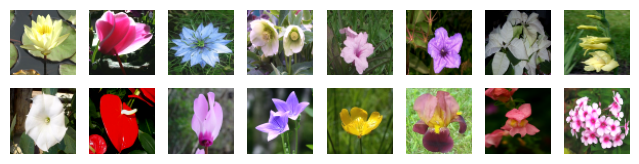

(16, 64, 64, 3)


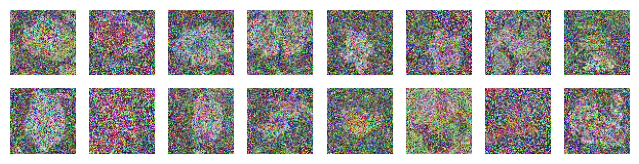

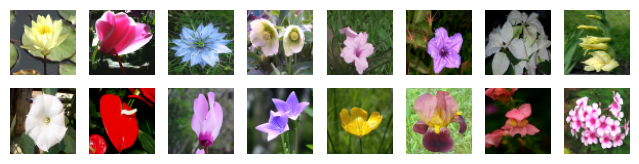

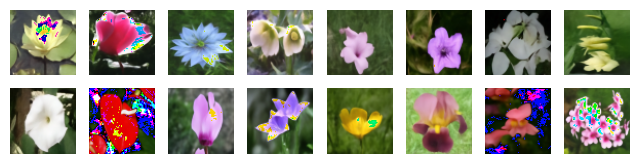

999it [00:13, 72.84it/s] 


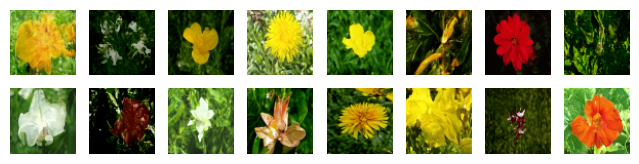

In [58]:
images = next(iter(data))
plotImages(images)
print(images.shape)
rng = jax.random.PRNGKey(4)
noise = jax.random.normal(rng, shape=images.shape, dtype=jnp.float32)
noise_level = 300
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
sampler = DDPMSampler()
noise_schedule = trainer.noise_schedule
noisy_images = noise_schedule.add_noise(images, noise, noise_levels)
plotImages(noisy_images)
regenerated_images = noise_schedule.remove_all_noise(noisy_images, noise, noise_levels)
plotImages(regenerated_images)
pred_noise = unet.apply(trainer.state.params, noisy_images, sampler.transform_steps(noise_levels))
reconstructed_images = noise_schedule.remove_all_noise(noisy_images, pred_noise, noise_levels)
plotImages(reconstructed_images)
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=BATCH_SIZE, diffusion_steps=999, priors=noisy_images)
plotImages(samples)

In [128]:
(jnp.arange(0, 1000, 10).round())

Array([  0,  10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120,
       130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250,
       260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380,
       390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510,
       520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640,
       650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770,
       780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900,
       910, 920, 930, 940, 950, 960, 970, 980, 990], dtype=int32)

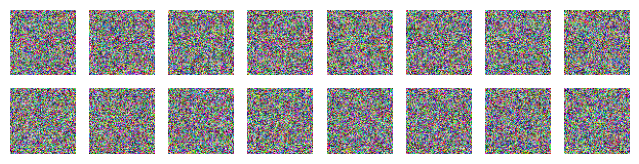

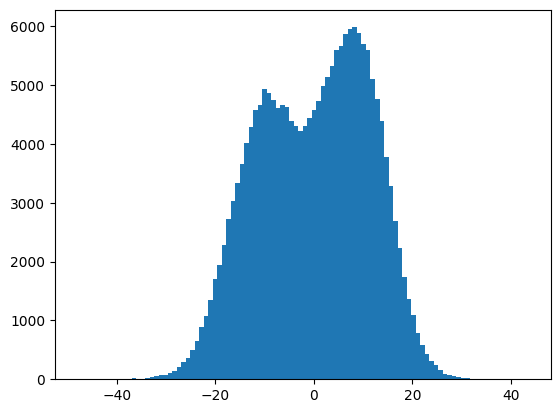

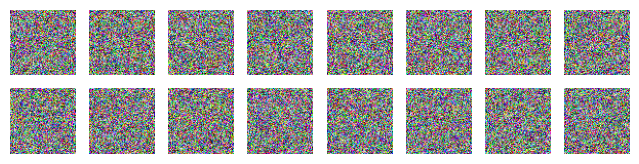

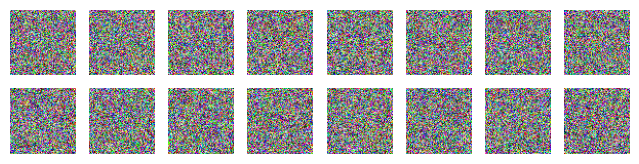

In [190]:
noise_level = 998
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
pred_noise = unet.apply(trainer.state.params, noise, sampler.transform_steps(noise_levels))
reconstructed_images = noise_schedule.remove_all_noise(noise, pred_noise, noise_levels)
plotImages(reconstructed_images)
plt.hist(reconstructed_images.flatten(), bins=100)
plotImages(pred_noise)
noise_level = 200
noise_levels = jnp.ones((images.shape[0],), dtype=jnp.int32) * noise_level
pred_noise = unet.apply(trainer.state.params, reconstructed_images, sampler.transform_steps(noise_levels))
reconstructed_images = noise_schedule.remove_all_noise(reconstructed_images, pred_noise, noise_levels)
plotImages(reconstructed_images)

100%|██████████| 100/100 [00:05<00:00, 18.17it/s]


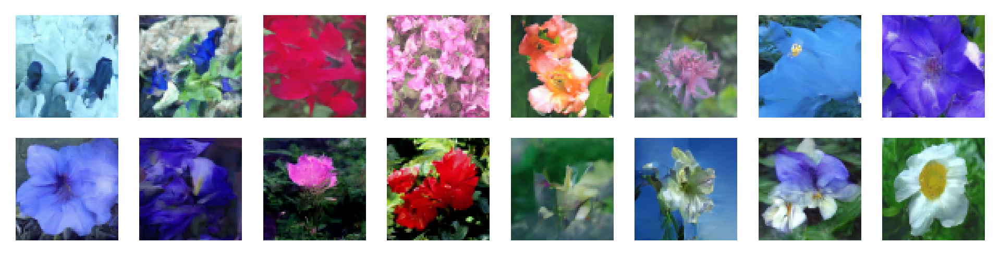

In [226]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=16, diffusion_steps=100, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 999/999 [00:14<00:00, 67.92it/s] 


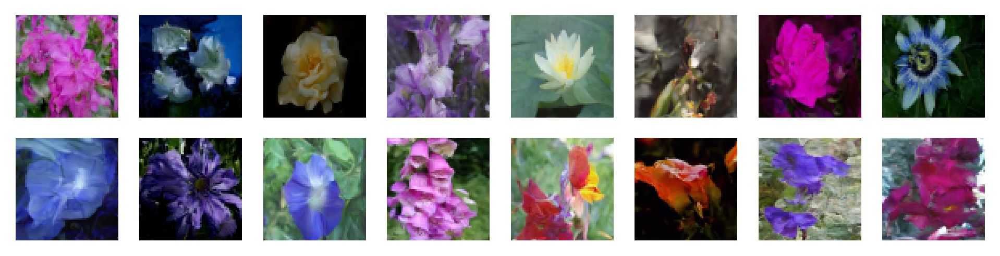

In [227]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=16, start_step=999, end_step=0, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 950/950 [00:13<00:00, 67.95it/s] 


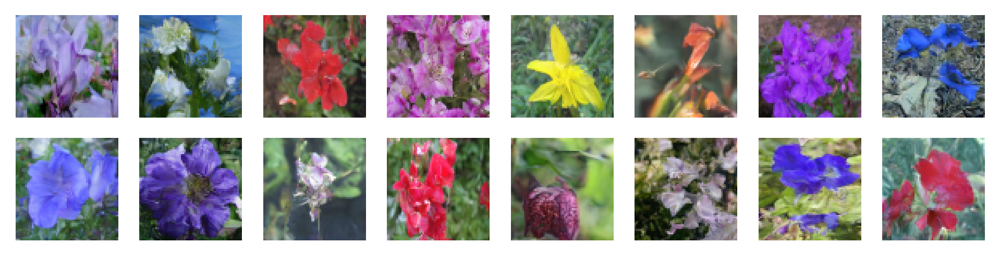

In [237]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=16, start_step=950, end_step=0, priors=None)
plotImages(samples, dpi=300)

1000it [00:23, 42.53it/s]


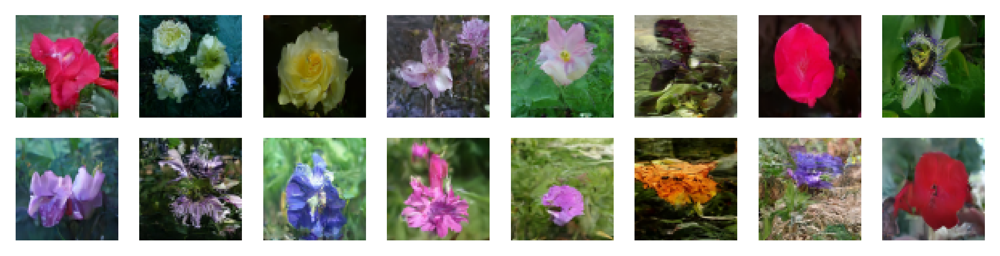

In [33]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=16, start_step=999, end_step=0, priors=None)
plotImages(samples, dpi=300)

100%|██████████| 53/53 [00:05<00:00, 10.22it/s]


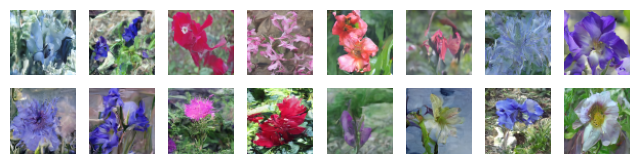

In [229]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=16, diffusion_steps=50, start_step=940, end_step=0, priors=None)
plotImages(samples)

  0%|          | 0/990 [00:00<?, ?it/s]

100%|██████████| 990/990 [00:48<00:00, 20.33it/s]


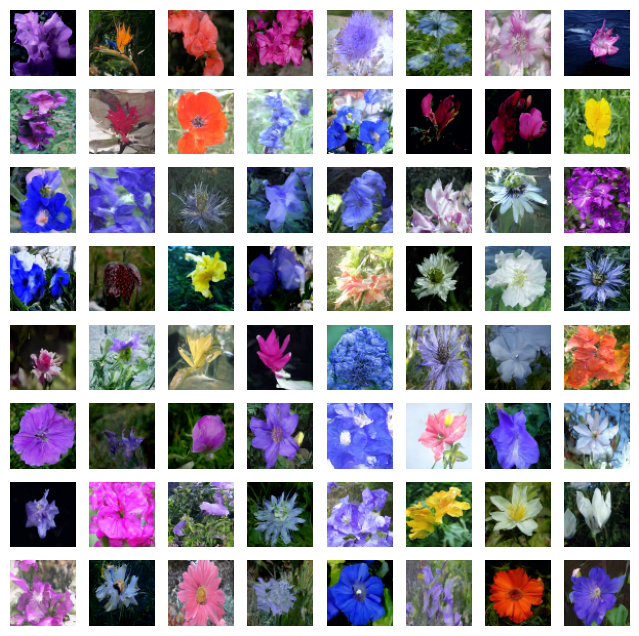

In [238]:
sampler = DDPMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=64, start_step=990, priors=None)
plotImages(samples)

100%|██████████| 100/100 [00:09<00:00, 10.90it/s]


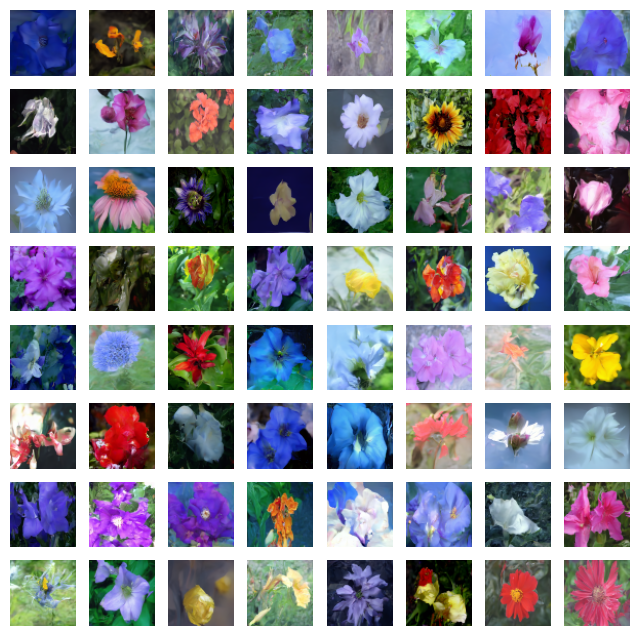

In [232]:
sampler = DDIMSampler(trainer.model, trainer.best_state.params, trainer.noise_schedule)
samples = sampler.generate_images(num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:41,  9.85it/s]


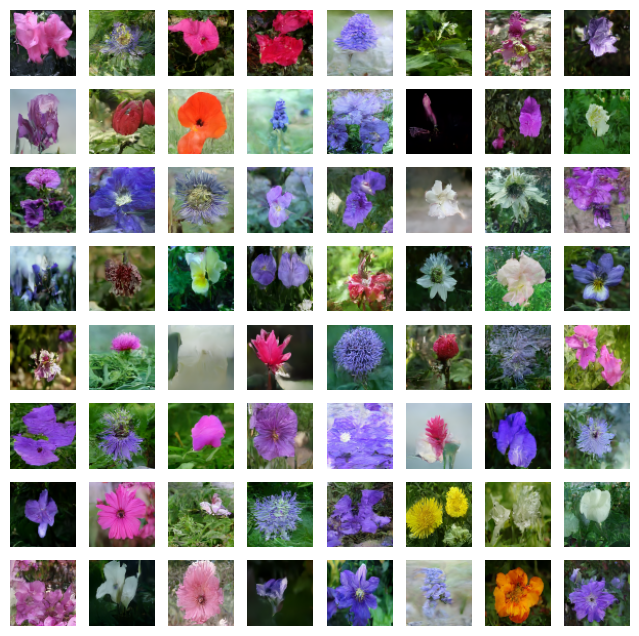

In [27]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:11,  8.64it/s]


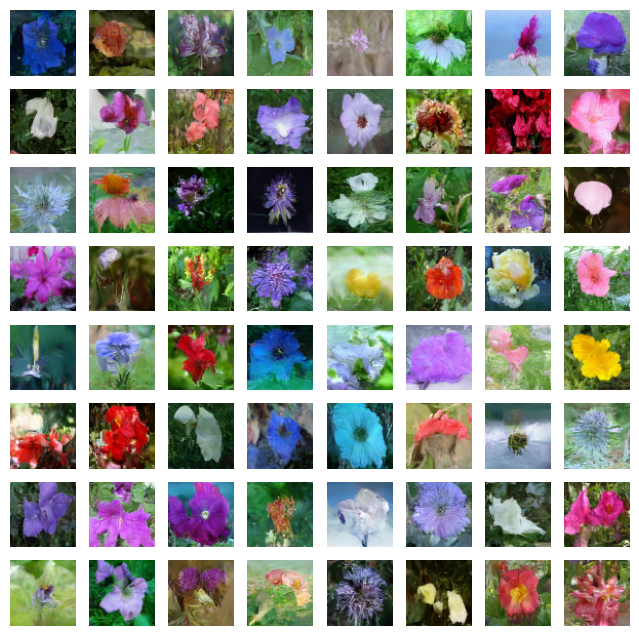

In [32]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:17, 12.87it/s]


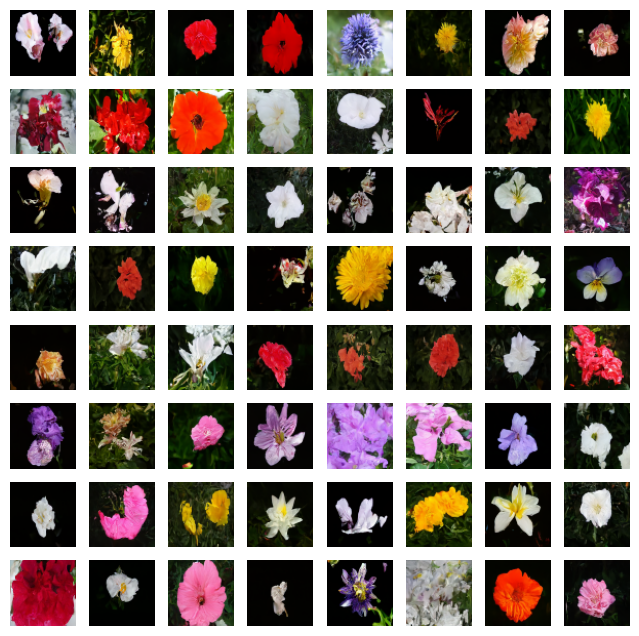

In [36]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:09, 10.89it/s]


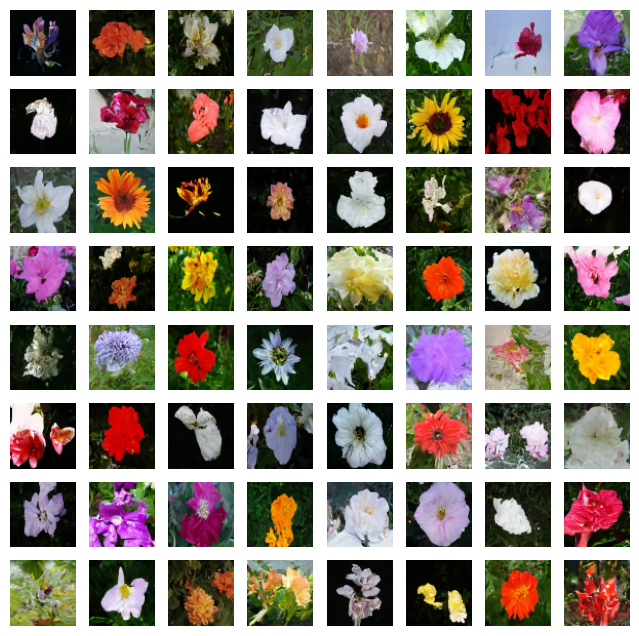

In [35]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.best_state.params, trainer.noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [01:18, 12.72it/s]


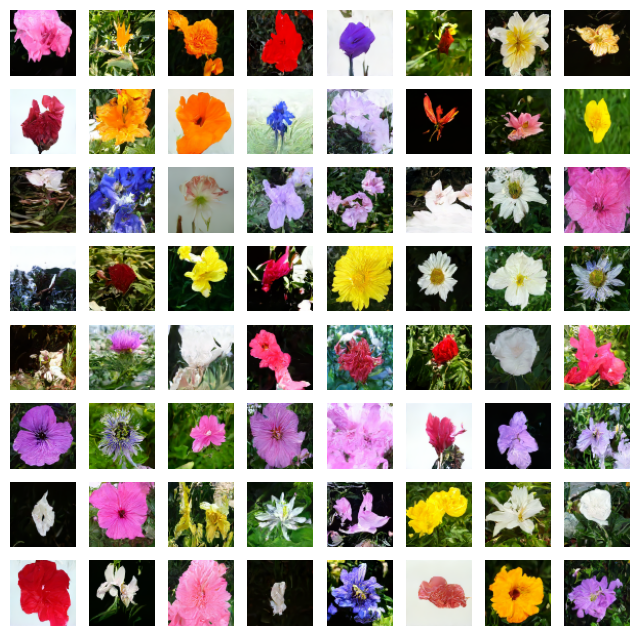

In [34]:
sampler = DDPMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=1000, priors=None)
plotImages(samples)

100it [00:14,  7.10it/s]


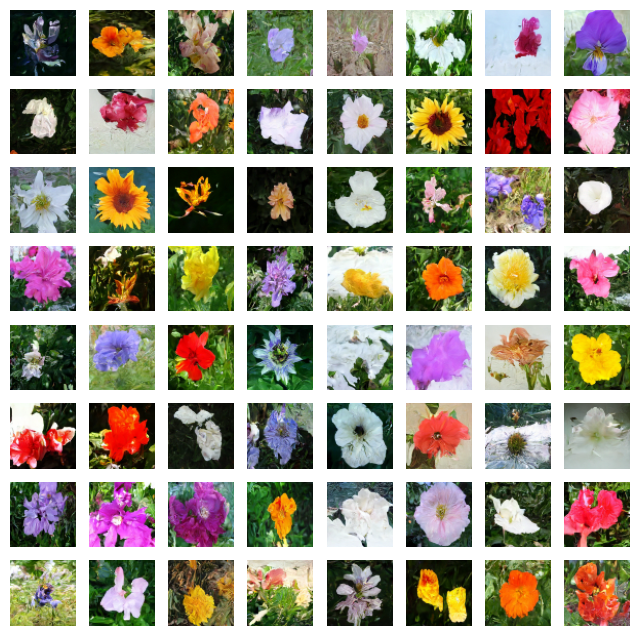

In [33]:
sampler = DDIMSampler()
samples = sampler.generate_images(trainer.model, trainer.state.params, noise_schedule, num_images=64, diffusion_steps=100, priors=None)
plotImages(samples)

1000it [00:12, 82.85it/s]


Samples (64, 64, 64, 3) -0.99983406 0.99983406 -0.3262726


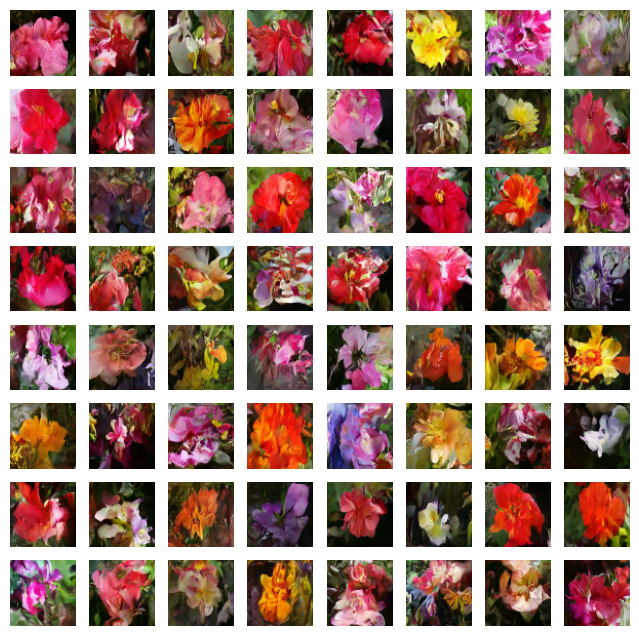

In [26]:
samples = generate_images(trainer.state, trainer.schedule, num_images=64, diffusion_steps=1000)
plotImages(samples)